In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.stats.weightstats import ztest as ztest

# 1: Data Wrangling

## 1.1: Borough Level Crime (2008-2018)

In [2]:
# Importing the Metropolitan Police's crime datasets for the period 01/2008-12/2018.
crime_category_08_18_df = pd.read_csv('pods_datasets/used/crime_stats/borough_level_crime_2008_18.csv')

In [3]:
crime_category_08_18_df.head()

,Borough,Major Category,Minor Category,200801,200802,200803,200804,200805,200806,200807,...,201803,201804,201805,201806,201807,201808,201809,201810,201811,201812
0,Barking and Dagenham,Burglary,Burglary in a Dwelling,82,71,87,74,74,103,113,...,122,75,93,77,94,84,99,94,106,163
1,Barking and Dagenham,Burglary,Burglary in Other Buildings,59,68,56,53,57,39,44,...,61,65,39,52,40,36,50,61,60,50
2,Barking and Dagenham,Criminal Damage,Criminal Damage To Dwelling,79,52,55,73,63,80,73,...,30,29,32,29,21,29,23,35,21,15
3,Barking and Dagenham,Criminal Damage,Criminal Damage To Motor Vehicle,142,138,118,158,126,96,116,...,53,64,64,67,69,42,38,42,47,33
4,Barking and Dagenham,Criminal Damage,Criminal Damage To Other Building,20,19,20,23,16,12,17,...,6,9,8,8,7,7,11,5,4,7


"Fraud data was transferred from individual police forces to National Action Fraud in March 2013", so we will remove fraud crime rows from the 2008-2018 dataset.

In [4]:
crime_category_08_18_df = crime_category_08_18_df[crime_category_08_18_df['Major Category'] != 'Fraud or Forgery']

We will keep the datasets that include the different crime categories for later analysis.

Below, a DataFrame is derived that contains the monthly number of crimes for each borough for the years 2008-2018.

In [5]:
# Dropping unnecessary columns.
crime_category_columns = ['Major Category', 'Minor Category']
crime_08_18_df = crime_category_08_18_df.drop(columns=crime_category_columns)

In [6]:
# We will sum the number of crimes in each borough, for each month (each column) in the 2008-18 dataset. 
crime_08_18_df = crime_category_08_18_df.groupby(['Borough'], as_index=False).sum()

## 1.2: Formatting Borough Names

We can use the crime_08_18_df DataFrame to obtain our list of London boroughs, as this dataset contains the measurements relevant to our target variable, meaning most of our other datasets will be combined with this DataFrame further through this project.
Note: City of London is not a borough, so we will not include it in our analysis.

In [7]:
# Acquiring list of boroughs included in analysis.
borough_list = crime_08_18_df['Borough'].tolist()

In [8]:
print('The list of {} boroughs to be analysed are: {}'.format(len(borough_list), borough_list))

The list of 32 boroughs to be analysed are: ['Barking and Dagenham', 'Barnet', 'Bexley', 'Brent', 'Bromley', 'Camden', 'Croydon', 'Ealing', 'Enfield', 'Greenwich', 'Hackney', 'Hammersmith and Fulham', 'Haringey', 'Harrow', 'Havering', 'Hillingdon', 'Hounslow', 'Islington', 'Kensington and Chelsea', 'Kingston upon Thames', 'Lambeth', 'Lewisham', 'Merton', 'Newham', 'Redbridge', 'Richmond upon Thames', 'Southwark', 'Sutton', 'Tower Hamlets', 'Waltham Forest', 'Wandsworth', 'Westminster']


Defining function to check that borough names in a given dataset are in the correct format in order to allow merging between the dataframe and our crime dataframes. The borough names have been taken from the Met Police's crime dataset for 2008-2018.
The function will return a list of borough names in the dataset that could not be matched with the names acquired from our crime datasets. 

Note: 'City of Westminster' is a common alternative to 'Westminster', so we have addressed this within the function. The function also sorts the rows alphabetically by borough for ease of combining datasets later on.

In [9]:
def rename_borough(df):
    # Addressing common 'Westminster' contrast in format
    df['Borough'].replace(['City of Westminster'],'Westminster', inplace=True)
    # Acquire borough in input DataFrame
    df_borough_list = df['Borough'].tolist()
    # Filtering for boroughs in correct format
    df = df[df['Borough'].isin(borough_list)]
    # Acquiring list of boroughs that couldn't be formatted
    error_boroughs = list(set(df_borough_list) - set(borough_list))
    print('Cannot format the following boroughs from the dataframe: {}'.format(error_boroughs))
    # Making sure list is in alphabetical order, making it easier to combine with similar DataFrames
    df = df.sort_values(by=['Borough'])
    # Setting boroughs as indices
    df.set_index('Borough', inplace=True)
    return df

## 1.3: Borough Level Crime (2019-2021)

Due to the overlapping of time periods between datasets, we are going to use the 2012-21 crime dataset to acquire the crime records for 2019-21, which will then be joined to the 2008-2018 dataset.


In [10]:
# Importing the Metropolitan Police's crime datasets for the period 01/2012-11/2021
crime_category_12_21_df = pd.read_csv('pods_datasets/used/crime_stats/borough_level_crime_2012_21.csv')

In [11]:
# Renaming columns listing categories so that it matches our 2008-18 dataset.
crime_category_12_21_df.rename(columns={'MajorText':'Major Category','MinorText':'Minor Category'}, inplace=True)

In [12]:
# Obtaining the desired borough and category columns, as well as the years 2019-2021
crime_category_19_21_df = crime_category_12_21_df.iloc[:,:3].join(crime_category_12_21_df.iloc[:,-35:])

In [13]:
# Filtering out rows that don't contain London boroughs and reseting index
crime_category_19_21_df = crime_category_19_21_df[crime_category_19_21_df['Borough']!='Aviation Security(SO18)']
crime_category_19_21_df.reset_index(drop=True, inplace=True)

Observations with minor category labelled 'Distraction Burglary', contain a NaN value for major category. We will change these NaN values to 'Burglary'.

In [14]:
crime_category_19_21_df.loc[crime_category_19_21_df['Minor Category'] == 'Distraction Burglary', 'Major Category'] = 'Burglary'

"Fraud data was transferred from individual police forces to National Action Fraud in March 2013", so we will remove fraud crime rows from the dataset.

In [15]:
crime_category_19_21_df = crime_category_19_21_df[crime_category_19_21_df['Major Category'] != 'Fraud and Forgery']

We will now drop the category columns and sum the crime counts for each individual month, grouping by borough. The resulting DataFrame will list the monthly total crime counts for each borough, with borough names as row indices, and dates as column names.

Note: The DataFrame containing information on crime categories will be left as it is, for future analysis.

In [16]:
# Dropping category columns.
crime_category_columns = ['Major Category', 'Minor Category']
crime_19_21_df = crime_category_19_21_df.drop(columns=crime_category_columns)

In [17]:
# Grouping DataFrame by borough to obtain total crimes for each month in each borough
crime_19_21_df = crime_19_21_df.groupby(['Borough'], as_index=False).sum()

In [18]:
# Checking borough name format for DataFrame
crime_19_21_df = rename_borough(crime_19_21_df)

Cannot format the following boroughs from the dataframe: []


## 1.4: Combining Crime Datasets

### 1.4.1: Boroughs

The crime DataFrames will now be joined to obtain the DataFrame displaying the monthly total crime counts for each borough, over the years 2008-2021.

In [19]:
# Sorting rows by borough for ease of combining datasets further on.
crime_08_18_df.sort_values(by=['Borough'], inplace=True)
# Set borough names as the index for the 2008-18 dataset. This has already been done for the 2019-21 dataset.
crime_08_18_df.set_index('Borough', inplace=True)

In [20]:
# Joining monthly crime DataFrames
crime_08_21_df = crime_08_18_df.join(crime_19_21_df)

We must turn the monthly counts into yearly counts, by summing across all of the months in a year. This is because the data for our independent variables only contain yearly measurements.

Note: The DataFrame containing monthly crime counts will be saved for timeseries analysis

In [21]:
# Defining annual crime count DataFrame.
yearly_crime_08_21_df = pd.DataFrame(index=borough_list)
for i in range(0,14): # As there are 13 years in the DataFrame.
    jan_year_index = 12* i # Calculating index of column for January of year i.
    month_year = crime_08_21_df.columns[jan_year_index] # Acquiring relevant column name.
    year = month_year[:4] # Acquiring year from column name.
    # Column for year added to new DataFrame by summing over all of the month columns in the respective year of our monthly 
    # crime DataFrame.
    yearly_crime_08_21_df[year] = crime_08_21_df[crime_08_21_df.columns[jan_year_index: jan_year_index+12]].sum(axis=1)

In [22]:
yearly_crime_08_21_df.head()

,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
Barking and Dagenham,18412,18909,18306,17591,16567,16445,16192,17157,17673,18648,18174,20190,19252,18227
Barnet,24951,24655,24162,24814,24081,22982,23000,24568,25659,26951,28197,31609,27439,24797
Bexley,15760,15089,13676,11671,11939,11813,12195,12337,13410,14807,15317,18067,15604,13599
Brent,25625,27405,27834,29937,27202,24532,25185,25596,27594,29702,30669,30450,28797,25884
Bromley,25106,23232,20546,20729,20023,19410,20168,21081,20699,22747,23186,25219,22017,20439


In [23]:
# Finding the total number of crimes in each borough for the years 2008-2021.
total_borough_crime_08_21 = pd.DataFrame()
total_borough_crime_08_21['total_crimes'] = crime_08_21_df.sum(axis=1)

In [24]:
# Normalising our total crime values so they will be easier to compare in terms of proportion.
total_borough_crime_08_21['norm_total_crimes'] = total_borough_crime_08_21 / total_borough_crime_08_21.max()

In [25]:
# Displaying the boroughs with the 10 highest crime counts for 01/2008-11/2021.
total_borough_crime_08_21.sort_values(by=['total_crimes'], ascending=False, inplace=True)
total_borough_crime_08_21.head(10)

,total_crimes,norm_total_crimes
Borough,,
Westminster,809608,1.000000
Lambeth,476066,0.588020
Southwark,471397,0.582253
Camden,452242,0.558594
Newham,448863,0.554420
Croydon,429914,0.531015
Tower Hamlets,413355,0.510562
Ealing,406697,0.502338
Hackney,403478,0.498362


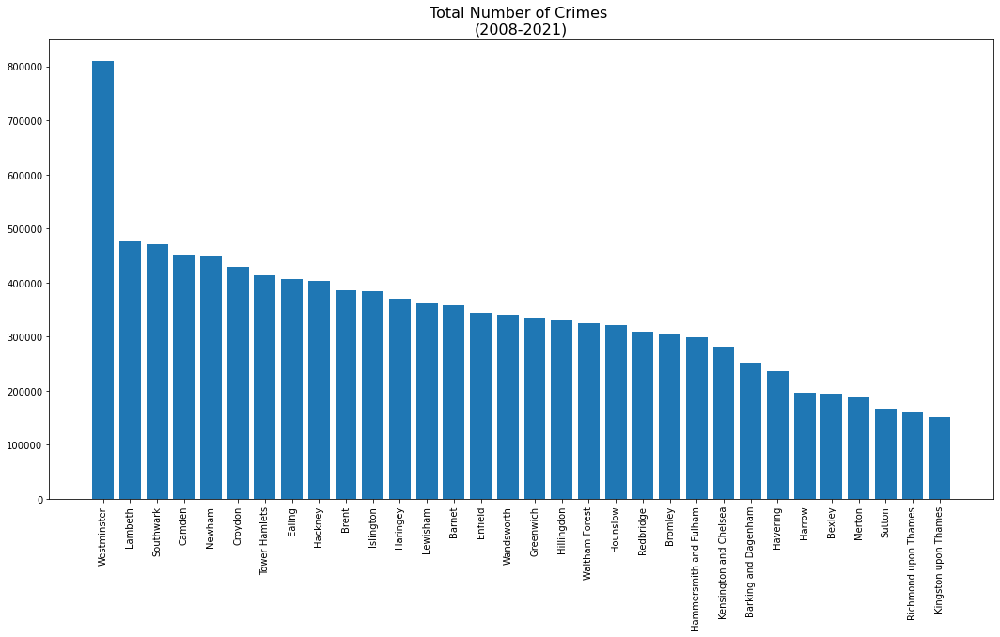

In [26]:
# Plotting a bar graph for the total number of crimes in each borough in 2008-2021
fig, ax = plt.subplots(1, figsize=(18, 9))
ax.bar(total_borough_crime_08_21.index.values, total_borough_crime_08_21['total_crimes'])
ax.set_title('Total Number of Crimes \n(2008-2021)', fontdict={'fontsize': '16', 'fontweight' : '3'})
plt.xticks(rotation=90)
plt.show()
fig.savefig('figures/crime_bar_graphs/tota_crime', bbox_inches='tight', dpi=300)

We can see that Westminster has a bit less than double the number of crimes of the borough with the next highest number. This could be due to the huge number of people, many of which are tourists, that visit Westminster every day. Other areas also associated with tourism - such as Lambeth, Southwark and Camden - display a higher number of crimes committed than other boroughs.

### 1.4.2: London

In [27]:
# Calculating London total crime occurences for each month by summing over boroughs.
city_crime_08_21_df = crime_08_21_df.sum(axis=0).to_frame()
# Taking transpose so that the column names are dates.
city_crime_08_21_df = city_crime_08_21_df.T
# Setting index as London.
city_crime_08_21_df.index = ['London']

In [28]:
city_crime_08_21_df.head()

,200801,200802,200803,200804,200805,200806,200807,200808,200809,200810,...,202102,202103,202104,202105,202106,202107,202108,202109,202110,202111
London,68690,65702,68070,66071,69400,69134,71069,66155,64641,69829,...,52233,62667,61763,67515,69725,70754,67113,70010,75726,73108


In [29]:
# Calculating London total crime occurences for each year by summing over boroughs of yearly crime DataFrame.
yearly_city_crime_08_21_df = yearly_crime_08_21_df.sum(axis=0).to_frame()
# Taking transpose so that the column names are years.
yearly_city_crime_08_21_df = yearly_city_crime_08_21_df.T
# Setting index as London.
yearly_city_crime_08_21_df.index = ['London']

In [30]:
yearly_city_crime_08_21_df.head()

,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
London,809803,792296,783351,778027,757353,704746,698919,732031,759478,823165,838201,917669,791029,723206


## 1.5: Population Estimates Dataset

### 1.5.1: Boroughs

Importing our population estimates dataset from a multi-sheet xls file, for the years 2001-2020. The sheet with index 10 contains our population estimates, so we will import only this sheet. We input header=7 as the first 6 rows of the spreadsheet don't contain any information relevant to the dataset.

In [31]:
borough_pop_df = pd.read_excel('pods_datasets/used/ukpopestimatesmid2020on2021geography.xls', sheet_name=10, header=7)

In [32]:
# Removing first column as it doesn't contain any helpful information.
borough_pop_df.drop(columns=['Code'], inplace=True)

In [33]:
# Obtaining rows that contain population estimates for London boroughs
borough_pop_df = borough_pop_df[borough_pop_df['Geography'] == 'London Borough']

In [34]:
# Dropping column that has served its purpose, and setting name of column listing borough names to 'Borough'.
borough_pop_df.drop(columns='Geography', inplace=True)
borough_pop_df.rename(columns={'Name':'Borough'}, inplace=True)

In [35]:
borough_pop_df = rename_borough(borough_pop_df)

Cannot format the following boroughs from the dataframe: ['City of London']


In [36]:
# Removing 'Mid-' from each year column name so it is easier to combine with other sets.
col_name_list = []
for col_name in borough_pop_df.columns: # Iterating over the boroughs
    new_col_name = col_name[-4:] # Removing first 4 characters of column name.
    col_name_list.append(new_col_name) # Appending new column name to list of new names
borough_pop_df.columns = col_name_list # Setting columns of DataFrame to new column names

In [37]:
# Reordering columns so they ascend in year.
borough_pop_df = borough_pop_df[[str(i) for i in range(2001,2021)]]

In [38]:
borough_pop_df.head()

,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
Borough,,,,,,,,,,,,,,,,,,,,
Barking and Dagenham,165654,166357,166210,165610,166275,167157,169031,172452,177580,182838,187029,190663,194576,198650,203101,208182,210711,211998,212906,214107
Barnet,319481,320552,321802,323723,327541,330801,334837,339212,345829,351438,357538,363777,368301,373745,378778,384774,387803,392140,395869,399007
Bexley,218757,219123,220016,220917,222391,223280,224625,226652,228146,230711,232774,234308,236816,240016,242387,245095,246124,247258,248287,249301
Brent,269620,269871,268323,268335,270939,276504,283273,290901,298118,304785,312245,314593,317112,320101,323443,326427,329102,330795,329771,327753
Bromley,296218,296668,297253,297307,299421,300963,302625,304968,306924,308560,310554,314039,318167,321602,325303,327580,329391,331096,332336,332752


### 1.5.2: London

We will now create a DataFrame for the city's total population estimates for the years 2001-2020, by summing over the boroughs.

In [39]:
city_pop_df = borough_pop_df.sum(axis=0).to_frame()
# Taking transpose so that the column names are years.
city_pop_df = city_pop_df.T
# Setting index as London.
city_pop_df.index = ['London']

In [40]:
city_pop_df.head()

,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
London,7315044,7369391,7387702,7425612,7511878,7590571,7685866,7804732,7935122,8054157,8196995,8302221,8411427,8533259,8660243,8762413,8817347,8899375,8952268,8991550


### 1.5.3 X_per_capita()

Now that we have population DataFrames, it is sensible to create a function for acquiring a DataFrame of X per capita values from a DataFrame containing a variable X and a population DataFrame that shares the same indices. The optional argument, monthly, can be set to True when calling the function. If this is the case, the function will calculate the per capita estimates for DataFrames containing monthly data, by using yearly population estimates.

In [41]:
def X_per_capita(X_df, population_df, monthly=False):
    X_per_capita_columns = {}
    for column in X_df.columns:
        # For monthly DataFrames, obtain the column year from the first 4 digits of the column name.
        if monthly:
            year = column[:4]
        # For yearly DataFrames, the column year is equal to the column name.
        else:
            year = column
        # No population estimate for 2021, so we will use 2020 estimates, as travel has been limited recently and the population
        # estimates should be similar.
        if year == '2021': 
            X_per_capita_columns[column] = X_df[column].div(population_df['2020'])
        else:
            X_per_capita_columns[column] = X_df[column].div(population_df[year])
    # If there's only one row in the input population DataFrame, set 'London' as the index of the per capita DataFrame.
    if population_df.shape[0] == 1:
        X_per_capita_df = pd.DataFrame(X_per_capita_columns, index=['London'])
    # If there's more than one row in the input population DataFrame, set the borough list as the indices of the per capita 
    # DataFrame.
    else:
        X_per_capita_df = pd.DataFrame(X_per_capita_columns, index=borough_list)
    return X_per_capita_df

From this point onwards, to reduce the length of variable names, 'per capita' will be referred to as 'pc'.

## 1.6: Police Workforce Datasets

One of the questions posed in this project is whether the number of people working for the Metropolitan Police has the largest impact on London crime rates in comparison with the selected measures of quality of life. We will use the full-time equivalent (FTE) measure, as it removes the risk of high numbers of part-time workers distorting our data.
Unfortunately this data is not avaiable by borough, so we will have to use datasets for the Metropolitan Police Force as a whole.

### 1.6.1: Police Workforce (2013-2021)

In [42]:
# Importing the Metropolitan Police's workforce dataset for the period 05/2013-07/2021.
met_workforce_13_21_df = pd.read_csv('pods_datasets/used/police_workforce/police_force_strength_2013_21.csv')

In [43]:
met_workforce_13_21_df.head()

,Date,Police Officer Strength,Police Staff Strength,PCSO Strength
0,May-13,30636,12702,2497
1,Jun-13,30550,12166,2487
2,Jul-13,30463,12149,2467
3,Aug-13,30360,12114,2450
4,Sep-13,30413,12113,2324


The dataset is split over different months, however the format of the dates aren't the same as our crime datasets. We will change the dates so that this dataset can easily be merged with our crime datasets. All of the dates in the workforce dataset are in the same format, with 3 letters denoting the month, followed by a dash and the last 2 digits of the year.

In [44]:
for date in met_workforce_13_21_df['Date']:
    # Defining dictionary for converting months into the desired format.
    month_txt_2_num = {'Jan-':'01', 'Feb-':'02', 'Mar-':'03', 'Apr-':'04', 'May-':'05', 'Jun-':'06', 'Jul-':'07', 'Aug-':'08', 'Sep-':'09', 'Oct-':'10', 'Nov-':'11', 'Dec-':'12'}
    # Taking first 4 characters of date, which refer to month.
    month = date[:4]
    # Using dictionary to obtain new month format.
    month_formatted = month_txt_2_num[month]
    # Taking last two characters of date, which refer to year.
    year = date[-2:]
    # Using a format string to get the 4 digit version of the year.
    year_formatted = '20{}'.format(year)
    # Combining new year and month strings in order to get date format.
    date_formatted = year_formatted + month_formatted
    # Replace old date string with new one.
    met_workforce_13_21_df.loc[met_workforce_13_21_df['Date'] == date, 'Date'] = date_formatted

In [45]:
# Setting the formatted dates as indices.
met_workforce_13_21_df.set_index('Date', inplace=True)

In [46]:
# Summing across rows to acquire total Metropolitan Police Force numbers
met_workforce_13_21_df['total_police_force'] = met_workforce_13_21_df.sum(axis=1)
# Dropping columns that are no longer needed.
met_workforce_13_21_df = pd.DataFrame(met_workforce_13_21_df['total_police_force'])

Taking the transpose so the columns of this dataset list years and, thus, can be combined with the monthly crime count and crime per capita datasets for the whole city.

In [47]:
met_workforce_13_21_df = met_workforce_13_21_df.T

In [48]:
met_workforce_13_21_df.head(1000)

Date,201305,201306,201307,201308,201309,201310,201311,201312,201401,201402,...,202010,202011,202012,202101,202102,202103,202104,202105,202106,202107
total_police_force,45835,45203,45079,44924,44850,44701,44563,44335,44232,44250,...,43592,43495,43323,43441,43547,43611,43429,43571,43708,43789


### 1.6.2: Police Workforce (2007-2012)

The datasets for police workforce numbers 2007-2009 and 2010-2012 only show figures for the years, as opposed to months

In [49]:
# Importing the Metropolitan Police's workforce dataset for the periods 2007-2009 and 2010-2012. 
# We are only interested in using the first 13 columns from each dataset.
police_workforce_07_09_df = pd.read_csv('pods_datasets/used/police_workforce/police_workforce_2007_09.csv', usecols = [i for i in range(13)])
police_workforce_10_12_df = pd.read_csv('pods_datasets/used/police_workforce/police_workforce_2010_12.csv', usecols = [i for i in range(13)])

In [50]:
police_workforce_07_09_df.head()

,Measure,Time,Time_type,Ethnicity,Ethnicity_type,Sex,Sex_type,Rank,Rank_type,Geography,Geography_type,FTE,Headcount
0,Police workforce,2007,As at 31st March,Asian,ONS 2001 5+1,Female,Male/Female,Chief Inspector,Detailed rank data,Avon & Somerset,Police Force Area,-,-
1,Police workforce,2007,As at 31st March,Asian,ONS 2001 5+1,Female,Male/Female,Chief Inspector,Detailed rank data,Bedfordshire,Police Force Area,-,-
2,Police workforce,2007,As at 31st March,Asian,ONS 2001 5+1,Female,Male/Female,Chief Inspector,Detailed rank data,British Transport Police,Police Force Area,-,-
3,Police workforce,2007,As at 31st March,Asian,ONS 2001 5+1,Female,Male/Female,Chief Inspector,Detailed rank data,Cambridgeshire,Police Force Area,-,-
4,Police workforce,2007,As at 31st March,Asian,ONS 2001 5+1,Female,Male/Female,Chief Inspector,Detailed rank data,Cheshire,Police Force Area,-,-


In [51]:
police_workforce_10_12_df.head()

,Measure,Time,Time_type,Ethnicity,Ethnicity_type,Sex,Sex_type,Rank,Rank_type,Geography,Geography_type,FTE,Headcount
0,Police workforce,2010,As at 31st March,Asian,ONS 2001 5+1,Female,Male/Female,Chief Inspector,Detailed rank data,Avon & Somerset,Police Force Area,-,-
1,Police workforce,2010,As at 31st March,Asian,ONS 2001 5+1,Female,Male/Female,Chief Inspector,Detailed rank data,Bedfordshire,Police Force Area,-,-
2,Police workforce,2010,As at 31st March,Asian,ONS 2001 5+1,Female,Male/Female,Chief Inspector,Detailed rank data,British Transport Police,Police Force Area,-,-
3,Police workforce,2010,As at 31st March,Asian,ONS 2001 5+1,Female,Male/Female,Chief Inspector,Detailed rank data,Cambridgeshire,Police Force Area,-,-
4,Police workforce,2010,As at 31st March,Asian,ONS 2001 5+1,Female,Male/Female,Chief Inspector,Detailed rank data,Cheshire,Police Force Area,-,-


In [52]:
# Defining function for cleaning the workforce datasets and obtaining the desired data.
def clean_workforce_df(df):
    # Renaming columns variables, as the columns currently can't be called using the apparent names.
    col_names = ['Measure','Time','Time_type','Ethnicity','Ethnicity_type','Sex','Sex_type','Rank','Rank_type','Geography','Geography_type','FTE','Headcount']
    df.columns =  col_names
    # Now that the column names have been corrected, we can drop unnecessary columns.
    df.drop(columns=['Measure','Time_type','Ethnicity_type','Sex_type','Rank_type','Geography_type'], inplace=True)
    # Filtering for rows containing Met Police data.
    met_df = df[df['Geography'] == 'Metropolitan Police']
    # Making sure we take mesaurements that aren't split over police demographics, as this isn't the focus of this project.
    met_df = met_df[(met_df['Ethnicity'] == 'All') & (met_df['Sex'] == 'All') & (met_df['Rank'] == 'All')]
    # Filtering for year and FTE columns.
    met_df = met_df[['Time','FTE']]
    # Resetting indices
    met_df.set_index('Time', inplace=True)
    # Removing commas from values and changing element type to a numeric type.
    met_df['FTE'] = met_df['FTE'].str.replace(',','')
    met_df = met_df.astype('int64')
    # Renaming column for ease of joining with our other police workforce dataset.
    met_df.columns = ['total_police_force']
    # Taking transpose so the column names will be years.
    met_df = met_df.T
    return met_df

In [53]:
# Acquiring desired datasets using function.
met_workforce_07_09_df = clean_workforce_df(police_workforce_07_09_df)
met_workforce_10_12_df = clean_workforce_df(police_workforce_10_12_df)

In [54]:
met_workforce_07_09_df.head()

Time,2007,2008,2009
total_police_force,49009,49993,51621


In [55]:
# Renaming columns as they currently can't be called using the apparent names.
met_workforce_07_09_df.columns =  ['2007', '2008', '2009']
met_workforce_10_12_df.columns =  ['2010', '2011', '2012']

In [56]:
# Dropping 2007 column, as it is not included in the rest of our datasets.
met_workforce_08_09_df = met_workforce_07_09_df.drop(columns=['2007'])

In [57]:
# Combining datasets to acquire Met Police workforce numbers for 2008-2012.
met_workforce_08_12_df = met_workforce_08_09_df.join(met_workforce_10_12_df)

In [58]:
met_workforce_08_12_df.head()

,2008,2009,2010,2011,2012
total_police_force,49993,51621,52515,50577,48185


### 1.6.3: Police Workforce (2008-2021)

In [59]:
# Obtaining 2008-2021 DataFrame by joining DataFrames
met_workforce_08_21_df = met_workforce_08_12_df.join(met_workforce_13_21_df)

In [60]:
# Setting index as London for ease of joining DataFrames.
met_workforce_08_21_df.index = ['London']

In [61]:
met_workforce_08_21_df.head()

,2008,2009,2010,2011,2012,201305,201306,201307,201308,201309,...,202010,202011,202012,202101,202102,202103,202104,202105,202106,202107
London,49993,51621,52515,50577,48185,45835,45203,45079,44924,44850,...,43592,43495,43323,43441,43547,43611,43429,43571,43708,43789


Acquiring a DataFrame for the yearly average number of people working for the Metropolitan Police.

In [62]:
# Defining yearly average DataFrame.
yearly_met_workforce_08_21_df = pd.DataFrame(index=['London'])
# 2008-2012 columns are already years, so we join them onto our yearly DataFrame.
yearly_met_workforce_08_21_df = yearly_met_workforce_08_21_df.join(met_workforce_08_21_df[met_workforce_08_21_df.columns[:5]])
# 2013 columns are in months, but from May onwards. We take the mean of the relevant column values.
yearly_met_workforce_08_21_df['2013'] = met_workforce_08_21_df[met_workforce_08_21_df.columns[5:13]].mean(axis=1)
# There are 8 more years to find the averages of (2014-2021).
for i in range(8):
    # Acquiring the January column index for the years 2014-2021.
    jan_year_index = 13 + 12*i
    # Acquiring the column name for this index.
    month_year = met_workforce_08_21_df.columns[jan_year_index]
    # Obtaining year from the first 4 characters of the column name.
    year = month_year[:4]
    # The column for the specified year in our new DataFrame is calculated by taking the mean of all of the month column values 
    # for the year in our old DataFrame.
    yearly_met_workforce_08_21_df[year] = met_workforce_08_21_df[met_workforce_08_21_df.columns[jan_year_index: jan_year_index+12]].mean(axis=1)

In [63]:
yearly_met_workforce_08_21_df.head()

,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
London,49993,51621,52515,50577,48185,44936.25,44663.916667,44418.833333,42371.25,40570.916667,39665.666667,40527.333333,43069.416667,43585.142857


### 1.6.4: Per Capita
We will also now obtain a DataFrame containing the number of Metropolitan Police per capita, based on the population of London. Many people that work for the Met live outside of London, so it is important to distinguish that this is not the percentage of Londoners that work for the Metropolitan Police.

In [64]:
yearly_met_workforce_pc_08_21_df = X_per_capita(yearly_met_workforce_08_21_df, city_pop_df)

## 1.7: Underpayment of Employees

### 1.7.1: Boroughs

This dataset contains the percentages of people earning below the London Living Wage (LLW) in each borough for the years 2005-2018. This measure has been selected as a feature for our analysis due to the increasing cost of living in the city, combined with low-paying jobs.

In [65]:
# Importing the dataset.
percent_below_llw_05_18_df = pd.read_excel('pods_datasets/used/employees_earning_below_llw_borough_2005_18.xls', sheet_name=2, index_col=None, header=None)  

In [66]:
# Extracting desired columns and rows.
percent_below_llw_05_18_df = percent_below_llw_05_18_df.iloc[1:39,1:16].reset_index(drop=True)

In [67]:
# Dropping undesired rows in the middle of the dataset.
percent_below_llw_05_18_df.drop(index=[1,2,3,36], inplace=True)

In [68]:
# Replacing NaN value with column name.
percent_below_llw_05_18_df.iloc[0,0] = 'Borough'

In [69]:
# Setting column names as first row values, converted to strings, and then deleting the row.
percent_below_llw_05_18_df.columns = percent_below_llw_05_18_df.iloc[0].map(str)
percent_below_llw_05_18_df.drop(index=[0], inplace=True)

In [70]:
# Sorting rows by borough for ease of combining datasets further on.
percent_below_llw_05_18_df.sort_values(by=['Borough'], inplace=True)
# Setting boroughs as indices.
percent_below_llw_05_18_df.set_index('Borough', inplace=True)

In [71]:
percent_below_llw_05_18_df.head()

,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018
Borough,,,,,,,,,,,,,,
Barking and Dagenham,10.7,12.9,11.6,12.1,13.4,13.7,16.1,17,16.2,24.1,25,27.7,26.1,25.8
Barnet,16.6,15.8,18.4,16.4,15,19.6,19.9,22.7,19.7,24.7,28.3,28.5,29.2,36.3
Bexley,20.4,17,21.2,25.2,21.3,24.3,28.5,30.3,35.7,32.6,34.8,32.4,32.9,35.3
Brent,18.7,18.2,17.1,21,18.3,24.3,29.1,29.5,29.4,29.3,32,32.8,37.8,36.9
Bromley,25.3,17.9,23.5,21,20.6,24.5,24.9,25.7,26.3,28.8,27.2,27.9,29.6,33.5


The row containing the percentages for London, at the bottom of the dataset, will be used to create the DataFrame for the city as a whole, and then dropped from this DataFrame.

### 1.7.2: London

In [72]:
# Acquiring dataframe for percentage of employees earning below LLW in London.
city_below_llw_05_18_df = pd.DataFrame(columns=percent_below_llw_05_18_df.columns)
city_below_llw_05_18_df.loc['London'] = percent_below_llw_05_18_df.loc['London']

In [73]:
# Dropping London row from corresponding DataFrame for boroughs.
percent_below_llw_05_18_df.drop(index='London', inplace=True)

In [74]:
city_below_llw_05_18_df.head()

,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018
London,13.3,12,12.7,12.8,12.8,13,14.8,16.7,17.4,19.1,20,19.5,19.4,20.4


The percentage of employees in London earning below the LLW has almost doubled over the period the dataset covers, suggesting this may be a good measure for further investigation. 

## 1.8: Employment

### 1.8.1: Boroughs

The workless-households-borough.xlsx file contains different sheets for the years 2004-2019 detailing percentages of working households, households with mixed employment status, and workless households. The percentage of workless households has been selected as a measure of quality of life, as unemployment in a city as expensive as London has the potential to be detrimental to one's lifestyle.

All of these sheets are format in the same way, so we will iteratively attain a DataFrame containing the percentage of workless households in each borough for the years 2004-2019.

In [75]:
# The dataset ranges from 2004 to 2019, so we define a list of the years covered.
years = [str(i) for i in range(2004, 2020)]
# Defining a DataFrame for the boroughs' percentages for the years 2004-2019.
workless_percent_04_19_df = pd.DataFrame(index=borough_list)
for year in years: # Iterate through the years.
    # Import excel sheet for the specified year.
    employment_percent_year_df = pd.read_excel('pods_datasets/used/workless-households-borough.xlsx', sheet_name=year, index_col=None, header=None)
    # Remove unwanted measurements.
    employment_percent_year_df.drop(columns=[i for i in range(2,7)], inplace=True)
    # Filter for desired columns and rows.
    employment_percent_year_df = employment_percent_year_df.iloc[5:37,1:3]
    # Renaming columns.
    employment_percent_year_df.columns = ['Borough', 'workless_households']
    # Setting boroughs as indices.
    employment_percent_year_df.set_index('Borough', inplace=True)
    # Column for specified year in new DataFrame is assigned to the year's Series.
    workless_percent_04_19_df[year] = employment_percent_year_df

In [76]:
workless_percent_04_19_df.head()

,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
Barking and Dagenham,29.7,27.7,25.5,22.5,23.2,26,26.2,24.9,26.5,11.2,20.5,13.7,15.6,13.7,13.8,14.7
Barnet,18,15,18.7,18.6,18.2,17.9,14.6,15,17.3,12.4,10.8,14.7,11.6,10.7,7.3,9.4
Bexley,13.5,12.6,15,15.8,17.8,22.3,16.1,13.8,13.6,14.3,12.3,12.1,11.8,12.1,10.4,14.3
Brent,22.5,17.1,22.8,16.9,14.9,15.6,18.4,20.4,15.1,10.7,12,13,10.8,12.9,8.6,9.9
Bromley,13,10.4,14.1,14.1,12.5,13.4,17.6,15.1,14.2,21.6,14.8,12.4,10.6,8.2,10.4,8.3


In [77]:
# Replacing NaN value with mean of the years either side of the element's year.
workless_percent_04_19_df.loc['Westminster', '2013'] = (workless_percent_04_19_df.loc['Westminster', '2012'] + workless_percent_04_19_df.loc['Westminster', '2014'])/2

### 1.8.2: London

We will now carry out the same process to find the percentage values for the entire city. The comments for lines of code that haven't changed in function have been omitted, as they can be seen above.

In [78]:
years = [str(i) for i in range(2004, 2020)]
city_workless_percent_04_19_df = pd.DataFrame(index=['London'])
for year in years:
    city_employment_percent_year_df = pd.read_excel('pods_datasets/used/workless-households-borough.xlsx', sheet_name=year, index_col=None, header=None)
    city_employment_percent_year_df.drop(columns=[i for i in range(2,7)], inplace=True)
    # Different row index so we may specify London.
    city_employment_percent_year_df = city_employment_percent_year_df.iloc[47,1:3].to_frame().T
    city_employment_percent_year_df.columns = ['Borough', 'workless_households']
    city_employment_percent_year_df.set_index('Borough', inplace=True)
    city_workless_percent_04_19_df[year] = city_employment_percent_year_df

In [79]:
city_workless_percent_04_19_df.head()

,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
London,20,19.8,20,19.4,18.8,19.1,19.3,18.9,17.7,12.8,14.6,13.5,12.8,12.9,12.4,12


The percentage of households in London that are workless has almost halved in the period 2004-2019. Comparing this with the trend seen in the percentage of employees earning below LLW, it could be suggested that a higher availability of low wage jobs, or an increase in the cost of living, could have caused the decrease in the percentage of households that are unemployed. In contrast, the decrease in the percentage of households that are workless could have increased the percentage of employees earning below LLW, due to high-demand for jobs driving wages down.

## 1.9: Homelessness

### 1.9.1: Boroughs

Homelessness is an essential measure of quality of life. We will now clean the dataset containing the total number of people sleeping rough, by borough.

In [80]:
# Importing dataset
rough_sleeping_10_20_df = pd.read_excel('pods_datasets/used/rough_sleeping_statistics_2020.xlsx', sheet_name=1, index_col=None, header=3)

In [81]:
# Filtering for London locations
rough_sleeping_10_20_df = rough_sleeping_10_20_df[rough_sleeping_10_20_df['Region'] == 'London']

In [82]:
# Dropping unnecessary columns and rows, then renaming columns and setting boroughs as index.
rough_sleeping_10_20_df.drop(columns=['Local authority ONS code', 'Region', 'Region ONS code'], inplace=True)
rough_sleeping_10_20_df.drop(index=1, inplace=True)
rough_sleeping_10_20_df.rename(columns={'Local authority':'Borough'}, inplace=True)
# Sorting rows by borough for ease of combining datasets further on.
rough_sleeping_10_20_df.sort_values(by=['Borough'], inplace=True)
# Setting borough as index.
rough_sleeping_10_20_df.set_index('Borough', inplace=True)

In [83]:
rough_sleeping_10_20_df.head()

,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
Borough,,,,,,,,,,,
Barking and Dagenham,2.0,13.0,8.0,0.0,4.0,20.0,5.0,0.0,9.0,14.0,10.0
Barnet,7.0,14.0,20.0,24.0,14.0,21.0,22.0,21.0,24.0,24.0,6.0
Bexley,8.0,4.0,5.0,4.0,7.0,6.0,11.0,16.0,5.0,9.0,16.0
Brent,3.0,7.0,11.0,6.0,11.0,55.0,24.0,29.0,30.0,25.0,12.0
Bromley,2.0,7.0,2.0,5.0,2.0,4.0,3.0,5.0,6.0,8.0,1.0


From this DataFrame we will now obtain the totals for the all of the London boroughs.

### 1.9.2: London

In [84]:
# Defining dataframe for city.
city_rough_sleeping_10_20_df = pd.DataFrame()
# Summing down over the different boroughs to obtain total sleeping rough counts for London for each year.
city_rough_sleeping_10_20_df = rough_sleeping_10_20_df.sum(axis=0).to_frame().T

In [85]:
# Ensuring index name indicates what row contains.
city_rough_sleeping_10_20_df.rename(index={0:'London'}, inplace=True)

In [86]:
city_rough_sleeping_10_20_df.head()

,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
London,415.0,446.0,557.0,543.0,742.0,940.0,964.0,1137.0,1283.0,1136.0,714.0


### 1.9.3 Percentage of Population

We will derive a DataFrame containing the percentages of people in each borough that are homeless.

In [87]:
percent_rough_sleeping_10_20_df = X_per_capita(rough_sleeping_10_20_df, borough_pop_df)

In [88]:
percent_rough_sleeping_10_20_df.head()

,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
Barking and Dagenham,0.000011,0.000070,0.000042,0.000000,0.000020,0.000098,0.000024,0.000000,0.000042,0.000066,0.000047
Barnet,0.000020,0.000039,0.000055,0.000065,0.000037,0.000055,0.000057,0.000054,0.000061,0.000061,0.000015
Bexley,0.000035,0.000017,0.000021,0.000017,0.000029,0.000025,0.000045,0.000065,0.000020,0.000036,0.000064
Brent,0.000010,0.000022,0.000035,0.000019,0.000034,0.000170,0.000074,0.000088,0.000091,0.000076,0.000037
Bromley,0.000006,0.000023,0.000006,0.000016,0.000006,0.000012,0.000009,0.000015,0.000018,0.000024,0.000003


We will also now obtain a DataFrame containing the percentages of people in London that are homeless.

In [89]:
percent_city_rough_sleeping_10_20_df = X_per_capita(city_rough_sleeping_10_20_df, city_pop_df)

In [90]:
percent_city_rough_sleeping_10_20_df.head()

,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
London,0.000052,0.000054,0.000067,0.000065,0.000087,0.000109,0.00011,0.000129,0.000144,0.000127,0.000079


## 1.10: Housing Affordability

### 1.10.1: Boroughs

Importing dataset containing data on the amount of affordable housing made available each financial year for each borough. We will use the first year of each time period interval as the year label, to allow easier merging with other datasets. We choose the first of the two years, specifically, because the time periods are financial years, meaning they run from April 1st of the first year, to March 31st of the second year and, as a result, most of the period is covered by the first year.

In [91]:
house_afford_91_20_df = pd.read_csv('pods_datasets/used/dclg-affordable-housing-borough.csv', index_col=None)

In [92]:
# Filtering for rows relevant to London boroughs, then reseting index.
house_afford_91_20_df = house_afford_91_20_df[house_afford_91_20_df['Area'].isin(borough_list)]
house_afford_91_20_df.reset_index(drop=True, inplace=True)
# Dropping unnecessary columns and renaming borough column.
house_afford_91_20_df.drop(columns=['Code'], inplace=True)
house_afford_91_20_df.rename(columns={'Area':'Borough'}, inplace=True)
# Sorting rows by borough for ease of combining datasets further on.
house_afford_91_20_df.sort_values(by=['Borough'], inplace=True)
# Setting boroughs as index.
house_afford_91_20_df.set_index('Borough', inplace=True)

In [93]:
# Changing year ranges to single values.
for i in range(len(house_afford_91_20_df['Year'])):
    # Finding year range
    years = house_afford_91_20_df['Year'].iloc[i]
    # Setting first year as the single year column name
    year = years[:4]
    # Replacing year range with single year.
    house_afford_91_20_df['Year'].iloc[i] = int(year)

In [94]:
# Removing commas and making sure elements of dataframe are integers.
house_afford_91_20_df['Affordable Housing Supply'] = house_afford_91_20_df['Affordable Housing Supply'].str.replace(',','')
house_afford_91_20_df = house_afford_91_20_df.astype('int64', copy=False)

In [95]:
# Filter out years outside of the range of the rest of our data.
house_afford_05_19_df = house_afford_91_20_df[house_afford_91_20_df['Year'] >= 2005]

In [96]:
# Reformatting DataFrame, so that it is replaced by a DataFrame showing affordable housing supply in each borough where the 
# boroughs are rows and the years are columns.
years = [i for i in range(2005, 2020)]
new_house_afford_05_19_df = pd.DataFrame(index=borough_list)
for year in years:
    new_house_afford_05_19_df[str(year)] = house_afford_05_19_df.loc[house_afford_05_19_df['Year'] == year, 'Affordable Housing Supply']
house_afford_05_19_df = new_house_afford_05_19_df

In [97]:
house_afford_05_19_df.head()

,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
Barking and Dagenham,331,303,420,238,189,284,384,114,530,1200,318,59,320,275,101
Barnet,407,71,347,316,214,392,666,357,393,441,128,320,237,150,247
Bexley,168,158,391,152,284,317,357,172,96,387,197,69,136,163,199
Brent,259,522,295,648,557,703,852,530,277,1316,208,226,128,436,213
Bromley,372,280,350,340,323,505,394,358,59,209,86,74,88,171,109


### 1.10.2: London

We will now sum over all the boroughs to find the amount of affordable housing made available each month over all of the London boroughs.

In [98]:
# Defining dataframe for whole city.
city_house_afford_05_19_df = pd.DataFrame()
# Summing down over the different boroughs to obtain totals for London for each year.
city_house_afford_05_19_df = house_afford_05_19_df.sum(axis=0).to_frame().T

In [99]:
# Renaming index as 'London'.
city_house_afford_05_19_df.rename(index={0:'London'}, inplace=True)

In [100]:
city_house_afford_05_19_df.head()

,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
London,11497,13175,15062,13065,13825,14621,17448,8901,9382,18047,5788,7018,7116,9205,10336


### 1.10.3 Per Capita

Obtaining DataFrame for the amount of affordable housing made available per capita for each borough. 

In [101]:
house_afford_pc_05_19_df = X_per_capita(house_afford_05_19_df, borough_pop_df)

In [102]:
# Also for the city as a whole.
city_house_afford_pc_05_19_df = X_per_capita(city_house_afford_05_19_df, city_pop_df)

## 1.11: Qualifications for People of Working Age

### 1.11.1: Boroughs

Cleaning dataset for the qualification levels of people of working age (16-64 years old). The dataset spans 2004-2020. The qualification levels we are interested in are 'no qualifications' and level NVQ1 qualifications, which is described as ‘1-4 GCSEs or equivalent’ (Level 1 qualifications): 1-4 O-Levels/CSE/GCSEs (any grades), Entry Level, Foundation Diploma, NVQ level 1, Foundation GNVQ, Basic/Essential Skills. These figures will act as measures of education level.

In [103]:
# Importing dataset.
qualifications_04_20_df = pd.read_csv('pods_datasets/used/Qualifications-of-working-age-NVQ.csv', index_col=None)

In [104]:
# Filtering for desired columns.
qualifications_04_20_df = qualifications_04_20_df[['Area', 'Year', 'Qualifications of working age population (16-64)', 'number']]

In [105]:
# Filtering for rows relevant to London boroughs.
qualifications_04_20_df = qualifications_04_20_df[qualifications_04_20_df['Area'].isin(borough_list)]

In [106]:
# Renaming columns for ease of manipulation.
qualifications_04_20_df.rename(columns={'Area':'Borough', 'Qualifications of working age population (16-64)':'Qualification_Level'}, inplace=True)

In [107]:
# Filtering for rows corresponding to no qualifications.
no_qualifications_04_20_df = qualifications_04_20_df[(qualifications_04_20_df['Qualification_Level'] == 'no qualifications')|(qualifications_04_20_df['Qualification_Level'] == 'with no qualifications')]

In [108]:
# Dropping unnecessary column.
no_qualifications_04_20_df.drop(columns='Qualification_Level', inplace=True)

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [109]:
# Sorting rows by borough for ease of combining datasets further on.
no_qualifications_04_20_df.sort_values(by=['Borough'], inplace=True)
# Setting boroughs as indices
no_qualifications_04_20_df.set_index('Borough', inplace=True)

C:\Users\User\anaconda3\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


In [110]:
# Removing commas and making sure elements of dataframe are integers.
no_qualifications_04_20_df.loc[:,'number'] = no_qualifications_04_20_df['number'].str.replace(',','')
no_qualifications_04_20_df = no_qualifications_04_20_df.astype('int64')

C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:1773: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


In [111]:
# Reformatting DataFrame, so that it is replaced by a DataFrame showing number of people without qualifications in each borough
# where the boroughs are rows and the years are columns.
years = [i for i in range(2004, 2021)]
new_no_qualifications_04_20_df = pd.DataFrame(index=borough_list)
for year in years:
    new_no_qualifications_04_20_df[str(year)] = no_qualifications_04_20_df.loc[no_qualifications_04_20_df['Year'] == year, 'number']
no_qualifications_04_20_df = new_no_qualifications_04_20_df

In [112]:
no_qualifications_04_20_df.head()

,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
Barking and Dagenham,23100,24300,20900,24700,25900,20600,19500,16400,16600,19000,19300,14400,18900,16300,11000,11400,12800
Barnet,20300,21300,15900,24500,19600,22500,14800,14000,17500,10500,17000,12600,13900,13600,15700,12800,6300
Bexley,15100,16700,13400,18700,18000,15900,13900,12500,11300,7000,8800,16300,10500,8400,6900,9400,9700
Brent,32900,24000,22900,16900,16700,19900,10900,24400,23600,17100,16800,13900,13600,18100,14500,15600,17600
Bromley,17600,17300,17200,14300,18400,10500,13300,14700,10000,11700,7400,8500,7200,8900,7200,8000,6100


In [113]:
# Carrying out the same process for qualification level NVQ1 values.
NVQ1_qualifications_04_20 = qualifications_04_20_df[qualifications_04_20_df['Qualification_Level'] == 'NVQ1 only']
# Dropping unnecessary column
NVQ1_qualifications_04_20.drop(columns='Qualification_Level', inplace=True)
# Sorting rows by borough for ease of combining datasets further on.
NVQ1_qualifications_04_20.sort_values(by=['Borough'], inplace=True)
# Setting boroughs as indices
NVQ1_qualifications_04_20.set_index('Borough', inplace=True)
# Removing commas and making sure elements of dataframe are integers.
NVQ1_qualifications_04_20.loc[:,'number'] = NVQ1_qualifications_04_20['number'].str.replace(',','')
NVQ1_qualifications_04_20 = NVQ1_qualifications_04_20.astype('int64', copy=False)
# Reformatting dataframe, so that it is replaced by a dataframe showing number of people with a qualification level of NVQ1 in 
# each borough, where the boroughs are rows and the years are columns.
years = [i for i in range(2004, 2021)]
new_NVQ1_qualifications_04_20 = pd.DataFrame(index=borough_list)
for year in years:
    new_NVQ1_qualifications_04_20[str(year)] = NVQ1_qualifications_04_20.loc[NVQ1_qualifications_04_20['Year'] == year, 'number']
NVQ1_qualifications_04_20 = new_NVQ1_qualifications_04_20

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:1773: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-

In [114]:
NVQ1_qualifications_04_20.head()

,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
Barking and Dagenham,21200,20200,20800,16300,15100,15500,18000,18500,16300,18100,15800,13500,13900,14600,16900,16200,11500
Barnet,15700,14800,16300,20100,22800,19800,19100,19100,24400,22800,19500,19700,20200,13600,11500,7700,6400
Bexley,26900,25700,26400,25200,24200,23700,26100,26100,20900,23700,20900,19500,19400,22700,18100,14200,16800
Brent,14700,10600,16600,13700,15200,15300,15700,19400,12300,18800,15100,19900,20600,17100,14400,7000,13400
Bromley,23900,23400,22100,25300,25700,23500,23300,22200,22500,19700,21700,18500,20200,17700,10500,15400,14200


We will now acquire a DataFrame where the entries are the number of people with qualification level NVQ1 or less for each borough. This is done by adding the two DataFrames that have been acquired in this section.

In [115]:
NVQ1_or_less_04_20 = no_qualifications_04_20_df + NVQ1_qualifications_04_20
NVQ1_or_less_04_20.head()

,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
Barking and Dagenham,44300,44500,41700,41000,41000,36100,37500,34900,32900,37100,35100,27900,32800,30900,27900,27600,24300
Barnet,36000,36100,32200,44600,42400,42300,33900,33100,41900,33300,36500,32300,34100,27200,27200,20500,12700
Bexley,42000,42400,39800,43900,42200,39600,40000,38600,32200,30700,29700,35800,29900,31100,25000,23600,26500
Brent,47600,34600,39500,30600,31900,35200,26600,43800,35900,35900,31900,33800,34200,35200,28900,22600,31000
Bromley,41500,40700,39300,39600,44100,34000,36600,36900,32500,31400,29100,27000,27400,26600,17700,23400,20300


### 1.11.2: London

We will now sum over the boroughs to acquire the DataFrame containing the number of people with qualification level NVQ1 or less for the London boroughs in each year.

In [116]:
# Defining dataframe for whole city.
city_NVQ1_or_less_04_20 = pd.DataFrame()
# Summing down over the different boroughs to obtain totals for London for each year.
city_NVQ1_or_less_04_20 = NVQ1_or_less_04_20.sum(axis=0).to_frame().T

In [117]:
# Ensuring index name indicates what row contains.
city_NVQ1_or_less_04_20.rename(index={0:'London'}, inplace=True)

In [118]:
city_NVQ1_or_less_04_20.head()

,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
London,1242900,1232500,1193500,1163700,1210500,1157300,1056500,1070100,970800,949900,906800,894200,836200,811000,812000,799400,693900


### 1.11.3 Percentage of Population
We will also now obtain a DataFrame containing the percentages of people in each borough with qualification level NVQ1 or less, as well as for the aggregate of the boroughs.

In [119]:
percent_NVQ1_or_less_04_20_df = X_per_capita(NVQ1_or_less_04_20, borough_pop_df)

In [120]:
# Also for the city as a whole.
percent_city_NVQ1_or_less_04_20_df = X_per_capita(city_NVQ1_or_less_04_20, city_pop_df)

## 1.12: Population Density

### 1.12.1 Boroughs

In [121]:
# Importing dataset.
population_density_99_50_df = pd.read_csv('pods_datasets/used/housing_density_borough_1999_2050.csv', index_col=None)

In [122]:
# Filtering for years covered by other datasets.
population_density_05_21_df = population_density_99_50_df[(population_density_99_50_df['Year'] >= 2005) & (population_density_99_50_df['Year'] <= 2021)]

In [123]:
# Filtering for rows relevant to London boroughs, then reseting index.
population_density_05_21_df = population_density_05_21_df[population_density_05_21_df['Name'].isin(borough_list)]
population_density_05_21_df.reset_index(drop=True, inplace=True)
# Renaming borough column.
population_density_05_21_df.rename(columns={'Name':'Borough'}, inplace=True)

In [124]:
# Saving DataFrame for use in creating the corresponding city DataFrame before setting boroughs as indices.
city_population_density_components_05_21_df = population_density_05_21_df[['Borough', 'Year', 'Population', 'Square_Kilometres']]

In [125]:
# Dropping unnecessary columns.
population_density_05_21_df = population_density_05_21_df[['Borough', 'Year', 'Population_per_square_kilometre']]

In [126]:
# Setting boroughs as index.
population_density_05_21_df.set_index('Borough', inplace=True)

In [127]:
# Reformatting dataframe, so that it is replaced by a dataframe population per square km in each borough
# where the boroughs are rows and the years are columns.
years = [i for i in range(2005, 2022)]
new_population_density_05_21_df = pd.DataFrame(index=borough_list)
for year in years:
    new_population_density_05_21_df[str(year)] = population_density_05_21_df.loc[population_density_05_21_df['Year'] == year, 'Population_per_square_kilometre']
population_density_05_21_df = new_population_density_05_21_df

In [128]:
population_density_05_21_df.head()

,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
Barking and Dagenham,4605.0,4629.4,4681.3,4776.0,4918.0,5063.7,5190.5,5288.3,5393.3,5502.5,5604.5,5728.6,5830.1,5892.7,5950.5,6047.6,6134.3
Barnet,3775.8,3813.3,3859.9,3910.3,3986.6,4051.2,4122.9,4196.9,4256.0,4323.2,4378.3,4451.9,4512.4,4577.0,4638.3,4693.4,4741.0
Bexley,3671.0,3685.7,3707.9,3741.3,3766.0,3808.3,3846.1,3870.9,3910.7,3963.2,4000.8,4044.0,4080.2,4126.7,4174.4,4208.8,4239.7
Brent,6267.0,6395.7,6552.3,6728.7,6895.7,7049.9,7241.8,7297.7,7357.9,7438.8,7514.0,7612.1,7696.7,7791.8,7880.9,7953.6,8013.3
Bromley,1994.3,2004.6,2015.7,2031.3,2044.3,2055.2,2072.2,2095.4,2121.1,2143.6,2167.5,2181.0,2204.1,2216.2,2226.6,2240.6,2261.1


This DataFrame contains the values for population per squared km for each borough in the years 2005-2021.

### 1.12.2: London 

We will now create a DataFrame conaitning the population per square km values for each year for all of the boroughs in the city.

In [129]:
# Reformatting dataframe, so that it is replaced by a dataframe population per square km for the whole city where column names 
# list each year.
# List of years covered by DataFrame.
years = [i for i in range(2005, 2022)]
# Defining new DataFrame
city_population_density_05_21_df = pd.DataFrame()
for year in years:
    # Calculating total population and total squared km for the city's boroughs in each year
    population = city_population_density_components_05_21_df.loc[city_population_density_components_05_21_df['Year'] == year, 'Population'].sum()
    km_squared = city_population_density_components_05_21_df.loc[city_population_density_components_05_21_df['Year'] == year, 'Square_Kilometres'].sum()
    # Calculating population per squared km for the city's boroughs in each year and inputting into a DataFrame.
    city_population_density_05_21_df.loc['London', str(year)] = population / km_squared

In [130]:
city_population_density_05_21_df.head()

,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
London,4787.68515,4837.840025,4898.576163,4974.335245,5057.439133,5133.305927,5232.673678,5298.81007,5367.726577,5445.305927,5530.924156,5603.287444,5670.236456,5735.290631,5798.727215,5860.60102,5920.879541


## 1.13: Deriving Crime per Capita

Deriving crime per capita DataFrames using the earlier-defined X_per_capita function.

### 1.13.1: Boroughs

In [131]:
# Deriving datasets for monthly crime per capita, by borough, for 2008-2021.
crime_pc_08_21_df = X_per_capita(crime_08_21_df, borough_pop_df, monthly=True)

In [132]:
# Deriving datasets for yearly crime per capita, by borough, for 2008-2021.
yearly_crime_pc_08_21_df = X_per_capita(yearly_crime_08_21_df, borough_pop_df)

In [133]:
# Calculating mean annual crimes per capita for each borough.
yearly_mean_crime_pc_08_21_df = yearly_crime_pc_08_21_df.mean(axis=1)
yearly_mean_crime_pc_08_21_df = yearly_mean_crime_pc_08_21_df.to_frame()
yearly_mean_crime_pc_08_21_df.columns = ['mean_crime_pc']

In [134]:
# Displaying 10 highest boroughs for mean annual crimes per capita (2008-2021).
yearly_mean_crime_pc_08_21_df.sort_values(by=['mean_crime_pc'], ascending=False, inplace=True)
yearly_mean_crime_pc_08_21_df.head(10)

,mean_crime_pc
Westminster,0.244856
Camden,0.134877
Kensington and Chelsea,0.127453
Islington,0.124031
Hammersmith and Fulham,0.116870
Southwark,0.111693
Hackney,0.110129
Lambeth,0.108703
Tower Hamlets,0.103657
Haringey,0.100909


### 1.13.2: London

In [135]:
# Deriving datasets for citywide monthly crime per capita for 2008-2021.
city_crime_pc_08_21_df = X_per_capita(city_crime_08_21_df, city_pop_df, monthly=True)

In [136]:
# Deriving datasets for citywide annual crime per capita for 2008-2021.
yearly_city_crime_pc_08_21_df = X_per_capita(yearly_city_crime_08_21_df, city_pop_df)

## 1.14: Finalising Datsets

### 1.14.1: Aligning Datset Time Periods

We will now filter all of our datasets so that they cover the same period of time. The largest period of time we can find that all of the datasets cover is 2010-2018, so we will write a function that drops the year columns of datasets that are outside of this range.

In [137]:
def keep_years_10_18(df):
    new_df = df
    for column in new_df.columns:
        # Year taken as first 4 characters of column name, so function works for DataFrame columns listing months or years.
        year = str(column)[:4] 
        # Define list of column names to drop from DataFrame.
        drop_col_list = []
        if int(year) < 2010 or int(year) > 2018:
            # If column year is outside of the desired range, drop the column.
            new_df.drop(columns=[column], inplace=True)
    return new_df

We will now acquire the 2010-2018 equivalents of all of our datasets, using the above function. The new variable names will not include year ranges, as we know that all of these DataFrames span the years 2010-2018.

In [138]:
# Crime datasets.
yearly_crime_df = keep_years_10_18(yearly_crime_08_21_df)
yearly_city_crime_df = keep_years_10_18(yearly_city_crime_08_21_df)
yearly_crime_pc_df = keep_years_10_18(yearly_crime_pc_08_21_df)
yearly_city_crime_pc_df = keep_years_10_18(yearly_city_crime_pc_08_21_df)

# Metropolitan Police workforce datasets.
yearly_met_workforce_df = keep_years_10_18(yearly_met_workforce_08_21_df)
yearly_met_workforce_pc_df = keep_years_10_18(yearly_met_workforce_pc_08_21_df)

# Employees earning below LLW datasets.
percent_below_llw_df = keep_years_10_18(percent_below_llw_05_18_df)
city_below_llw_df = keep_years_10_18(city_below_llw_05_18_df)

# Workless households datasets.
workless_percent_df = keep_years_10_18(workless_percent_04_19_df)
city_workless_percent_df = keep_years_10_18(city_workless_percent_04_19_df)

# Rough sleeping datasets.
percent_rough_sleeping_df = keep_years_10_18(percent_rough_sleeping_10_20_df)
percent_city_rough_sleeping_df = keep_years_10_18(percent_city_rough_sleeping_10_20_df)

# Availability of affordable housing datasets.
house_afford_pc_df = keep_years_10_18(house_afford_pc_05_19_df)
city_house_afford_pc_df = keep_years_10_18(city_house_afford_pc_05_19_df)

# Qualification level datasets.
percent_NVQ1_or_less_df = keep_years_10_18(percent_NVQ1_or_less_04_20_df)
percent_city_NVQ1_or_less_df = keep_years_10_18(percent_city_NVQ1_or_less_04_20_df)

# Housing density datasets.
population_density_df = keep_years_10_18(population_density_05_21_df)
city_population_density_df = keep_years_10_18(city_population_density_05_21_df)

### 1.14.2: Individual Borough DataFrames

We will now combine all of our different DataFrames, so that we end up with a DataFrame for each individual borough, containing each variable in the columns, with the dates acting as row indices.

In [139]:
def get_borough_df(borough_name):
    variable_col_names = ['crime_num', 'crime_pc', 'earning_below_llw_%', 'workless_households_%', 'homeless_%', 'affordable_housing_pc', 'NVQ1_or_less_%', 'population_density']
    borough_df = pd.DataFrame(index=yearly_crime_df.columns, columns=variable_col_names)
    for year in yearly_crime_df.columns:
        borough_df.loc[year, 'crime_num'] = yearly_crime_df.loc[borough_name, year]
        borough_df.loc[year, 'crime_pc'] = yearly_crime_pc_df.loc[borough_name, year]
        borough_df.loc[year, 'earning_below_llw_%'] = percent_below_llw_df.loc[borough_name, year]
        borough_df.loc[year, 'workless_households_%'] = workless_percent_df.loc[borough_name, year]
        borough_df.loc[year, 'homeless_%'] = percent_rough_sleeping_df.loc[borough_name, year]
        borough_df.loc[year, 'affordable_housing_pc'] = house_afford_pc_df.loc[borough_name, year]
        borough_df.loc[year, 'NVQ1_or_less_%'] = percent_NVQ1_or_less_df.loc[borough_name, year]
        borough_df.loc[year, 'population_density'] = population_density_df.loc[borough_name, year]
        borough_df.loc[year, 'police_pc'] = yearly_met_workforce_pc_08_21_df.loc['London', year]
    return borough_df

In [140]:
# Acquiring DataFrames containing all variables for each borough.
Bark_and_Dag_df = get_borough_df('Barking and Dagenham')
Barnet_df = get_borough_df('Barnet')
Bexley_df = get_borough_df('Bexley')
Brent_df = get_borough_df('Brent')
Bromley_df = get_borough_df('Bromley')
Camden_df = get_borough_df('Camden')
Croydon_df = get_borough_df('Croydon')
Ealing_df = get_borough_df('Ealing')
Enfield_df = get_borough_df('Enfield')
Greenwich_df = get_borough_df('Greenwich')
Hackney_df = get_borough_df('Hackney')
Hammer_and_Fulham_df = get_borough_df('Hammersmith and Fulham')
Haringey_df = get_borough_df('Haringey')
Harrow_df = get_borough_df('Harrow')
Havering_df = get_borough_df('Havering')
Hillingdon_df = get_borough_df('Hillingdon')
Hounslow_df = get_borough_df('Hounslow')
Islington_df = get_borough_df('Islington')
Kens_and_Chelsea_df = get_borough_df('Kensington and Chelsea')
Kingston_df = get_borough_df('Kingston upon Thames')
Lambeth_df = get_borough_df('Lambeth')
Lewisham_df = get_borough_df('Lewisham')
Merton_df = get_borough_df('Merton')
Newham_df = get_borough_df('Newham')
Redbridge_df = get_borough_df('Redbridge')
Richmond_df = get_borough_df('Richmond upon Thames')
Southwark_df = get_borough_df('Southwark')
Sutton_df = get_borough_df('Sutton')
Tower_Hamlets_df = get_borough_df('Tower Hamlets')
Waltham_Forest_df = get_borough_df('Waltham Forest')
Wandsworth_df = get_borough_df('Wandsworth')
Westminster_df = get_borough_df('Westminster')

We will now define a list of the borough DataFrames, so that we may iterate through them later in our project.

In [141]:
borough_df_list = [Bark_and_Dag_df, Barnet_df, Bexley_df, Brent_df, Bromley_df, Camden_df, Croydon_df, Ealing_df, Enfield_df, Greenwich_df, Hackney_df, Hammer_and_Fulham_df, Haringey_df, Harrow_df, Havering_df, Hillingdon_df, Hounslow_df, Islington_df, Kens_and_Chelsea_df, Kingston_df, Lambeth_df, Lewisham_df, Merton_df, Newham_df, Redbridge_df, Richmond_df, Southwark_df, Sutton_df, Tower_Hamlets_df, Waltham_Forest_df, Wandsworth_df, Westminster_df]

We will also use this to derive a dictionary where the keys are borough names and the values are the corresponding borough DataFrames.

In [142]:
borough_df_dict = {}
i = 0
for borough in borough_list:
    borough_df_dict[borough] = borough_df_list[i]
    i += 1

### 1.14.3: Concatenation of Borough DataFrames

We will concatenate all of our borough DataFrames, resulting in a DataFrame where the columns list the variables, both dependent and independent, and the rows are a concatenation of all the yearly values of said variables, over all of the boroughs.

In [143]:
all_yearly_values_df = pd.DataFrame(columns=Bark_and_Dag_df.columns)
for borough in borough_list:
    all_yearly_values_df = pd.concat([all_yearly_values_df, borough_df_dict[borough]], ignore_index=True)

In [144]:
# Ensuring the dtypes of each element is a float.
all_yearly_values_df = all_yearly_values_df.astype(float)

In [145]:
all_yearly_values_df.head()

,crime_num,crime_pc,earning_below_llw_%,workless_households_%,homeless_%,affordable_housing_pc,NVQ1_or_less_%,population_density,police_pc
0,18306.0,0.100121,13.7,26.2,0.000011,0.001553,0.205100,5063.7,0.006520
1,17591.0,0.094055,16.1,24.9,0.000070,0.002053,0.186602,5190.5,0.006170
2,16567.0,0.086892,17.0,26.5,0.000042,0.000598,0.172556,5288.3,0.005804
3,16445.0,0.084517,16.2,11.2,0.000000,0.002724,0.190671,5393.3,0.005342
4,16192.0,0.081510,24.1,20.5,0.000020,0.006041,0.176693,5502.5,0.005234


#### Pearson Correlation Matrix

In [146]:
import seaborn as sns

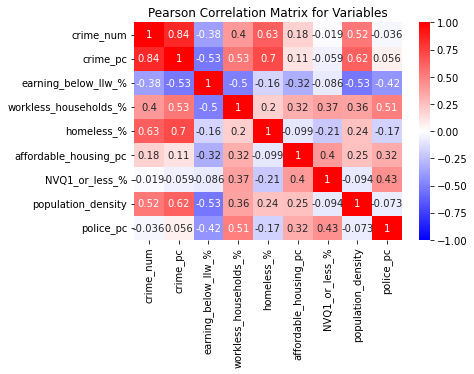

In [147]:
# Calculating pearson correlation matrix for the variables across all boroughs.
pearson_matrix = all_yearly_values_df.corr(method='pearson')
#sns.set(font_scale=0.75)
sns.heatmap(pearson_matrix, vmin=-1, vmax=1, cmap='bwr', annot = True)
plt.title('Pearson Correlation Matrix for Variables')
plt.savefig('figures/EDA_graphs/variable_corr_matrix.svg', bbox_inches='tight')
plt.show()

We can see that the features that have the highest Pearson correlation coefficient are the percentage of people who are homeless, population density, the percentage of employees earning below LLW, and the percentage of households that are workless. The number of police, per capita, in London shows very low correlation coefficients with the number of crimes and crime per capita. This would suggest that the number of Metropolitan Police, per capita, in London does not have the largest affect on crime levels.

### 1.14.4: Individual Borough Totals and Averages

Constructing a DataFrame containing the summary statistics of all of the boroughs. For each borough, all raw number variables (e.g. number of crimes) were totalled, and any proportion-based variables (i.e. percentages, per capita and density measurements) were averaged.

In [148]:
borough_summary_df = pd.DataFrame(index=borough_list, columns=Bark_and_Dag_df.columns)
for i in range(len(borough_list)):
    for column in Bark_and_Dag_df.columns:
        # Creating exception for percentage, per capita, and density variables.
        if column[-2:] in ['_%','pc'] or column[-7:] == 'density':
            borough_summary_df.loc[borough_list[i],column] = borough_df_list[i][column].mean() # Take average.
        else:
            borough_summary_df.loc[borough_list[i],column] = borough_df_list[i][column].sum() # Take sum.

In [149]:
borough_summary_df.head()

,crime_num,crime_pc,earning_below_llw_%,workless_households_%,homeless_%,affordable_housing_pc,NVQ1_or_less_%,population_density,police_pc
Barking and Dagenham,156753,0.087854,21.3,18.455556,0.000034,0.001959,0.1672,5499.355556,0.005344
Barnet,224414,0.066804,25.433333,12.711111,0.000049,0.00093,0.089522,4318.866667,0.005344
Bexley,117165,0.054309,31.866667,12.944444,0.00003,0.000885,0.136352,3961.211111,0.005344
Brent,248251,0.08626,31.233333,13.544444,0.00006,0.001639,0.106458,7444.522222,0.005344
Bromley,188589,0.065321,27.6,13.877778,0.000012,0.000684,0.092329,2139.588889,0.005344


### 1.14.5: London DataFrame

Acquiring the DataFrame for the yearly measurements of all of the variables, dependent and independent, for London as a whole. The row indices are years and the columns list variables.

In [150]:
variable_col_names = ['crime_num', 'crime_pc', 'earning_below_llw_%', 'workless_households_%', 'homeless_%', 'affordable_housing_pc', 'NVQ1_or_less_%', 'population_density']
london_df = pd.DataFrame(index=yearly_crime_df.columns, columns=variable_col_names)
for year in yearly_crime_df.columns:
    london_df.loc[year, 'crime_num'] = yearly_city_crime_df.loc['London', year]
    london_df.loc[year, 'crime_pc'] = yearly_city_crime_pc_df.loc['London', year]
    london_df.loc[year, 'met_workforce'] = yearly_met_workforce_df.loc['London', year]
    london_df.loc[year, 'met_workforce_pc'] = yearly_met_workforce_df.loc['London', year]
    london_df.loc[year, 'earning_below_llw_%'] = city_below_llw_df.loc['London', year]
    london_df.loc[year, 'workless_households_%'] = city_workless_percent_df.loc['London', year]
    london_df.loc[year, 'homeless_%'] = percent_city_rough_sleeping_df.loc['London', year]
    london_df.loc[year, 'affordable_housing_pc'] = city_house_afford_pc_df.loc['London', year]
    london_df.loc[year, 'NVQ1_or_less_%'] = percent_city_NVQ1_or_less_df.loc['London', year]
    london_df.loc[year, 'population_density'] = city_population_density_df.loc['London', year]

In [151]:
london_df.head()

,crime_num,crime_pc,earning_below_llw_%,workless_households_%,homeless_%,affordable_housing_pc,NVQ1_or_less_%,population_density,met_workforce,met_workforce_pc
2010,783351,0.09726,13,19.3,0.000052,0.001815,0.131174,5133.305927,52515.000000,52515.000000
2011,778027,0.094916,14.8,18.9,0.000054,0.002129,0.130548,5232.673678,50577.000000,50577.000000
2012,757353,0.091223,16.7,17.7,0.000067,0.001072,0.116933,5298.81007,48185.000000,48185.000000
2013,704746,0.083784,17.4,12.8,0.000065,0.001115,0.11293,5367.726577,44936.250000,44936.250000
2014,698919,0.081905,19.1,14.6,0.000087,0.002115,0.106267,5445.305927,44663.916667,44663.916667


# 2: Crime Category Pie Charts

2019 was a year that saw a very high number of violent crimes and homicides. By the end of the year, the number of homicides reported in the city reached 149, the highest in a decade. In February 2020, we then saw the pandemic force most countries into lockdown, which has affected the types of crimes being committed. Due to these two factors we will be the crime category proportions for 2019-2021 separately.

In [152]:
# Acquiring totals of each type of crime for each borough in the relevant time periods.
crime_category_08_18_df['total'] = crime_category_08_18_df.iloc[:,3:].sum(axis=1)
crime_category_19_21_df['total'] = crime_category_19_21_df.iloc[:,3:].sum(axis=1)

In [153]:
# Grouping on borough and the major categories of each crime.
crime_major_category_08_18_df = crime_category_08_18_df.groupby(['Borough', 'Major Category'], as_index=False).sum()
crime_major_category_19_21_df = crime_category_19_21_df.groupby(['Borough', 'Major Category'], as_index=False).sum()

In [154]:
# Defining function to create and save pie charts for each borough.
def crime_category_pie_charts(df, file_name):
    # Iterate through boroughs
    for borough in borough_list:
        # Filter for rows containing values for specified borough
        borough_crime_category_df = df[df['Borough']==borough]
        # Acquire category names as labels.
        labels = borough_crime_category_df['Major Category']
        # Acquire total number of crimes for each category.
        variable = borough_crime_category_df['total']
        # Defining graph
        fig, ax = plt.subplots(1, figsize=(15, 9))
        ax.pie(variable, labels=labels, autopct='%1.1f%%', startangle = 90)
        ax.set_title('{} Major Categories of Crimes ({})'.format(borough, file_name), fontdict={'fontsize': '16', 'fontweight' : '3'})
        plt.show()
        fig.savefig('figures/pie_charts/{}/{}_major_crime_categories_pie.svg'.format(file_name, borough), bbox_inches='tight', dpi=300)

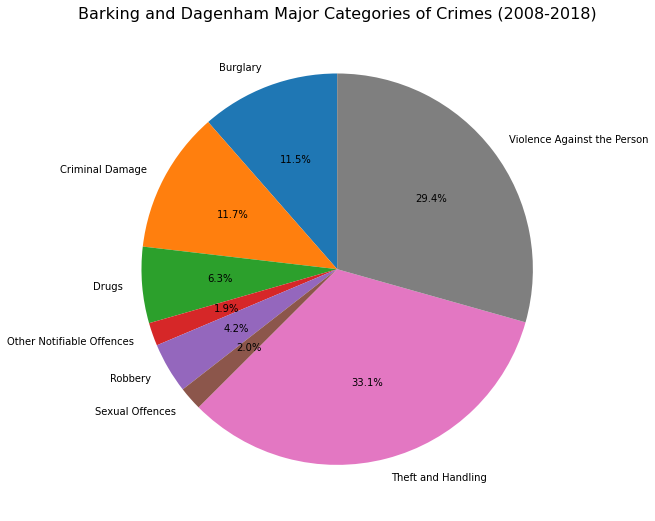

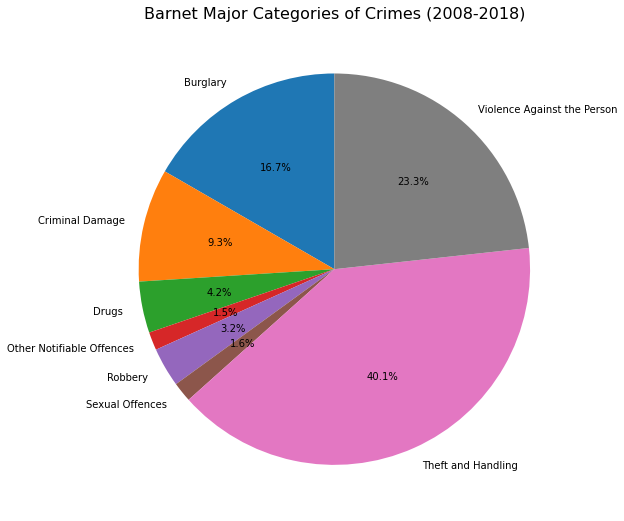

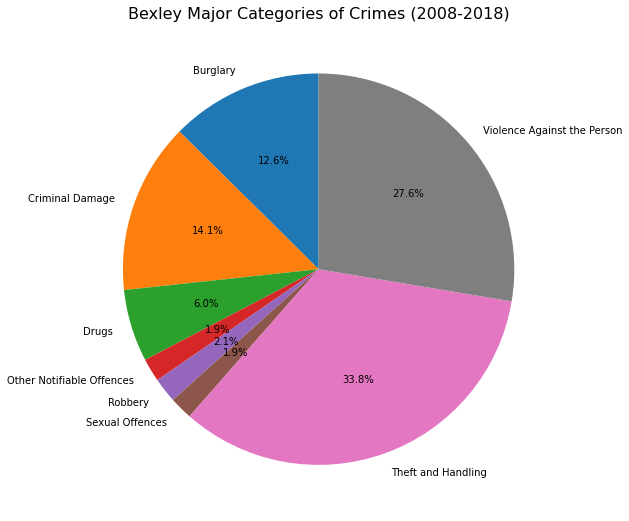

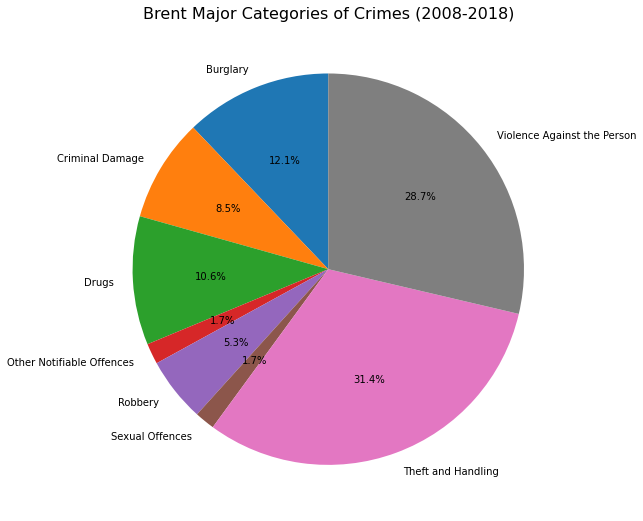

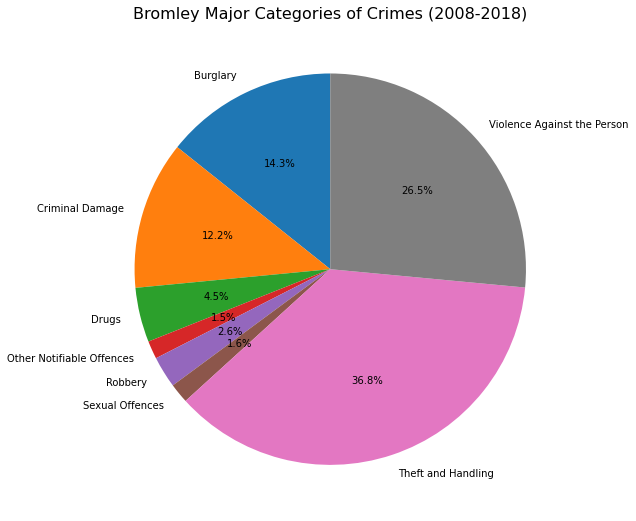

...

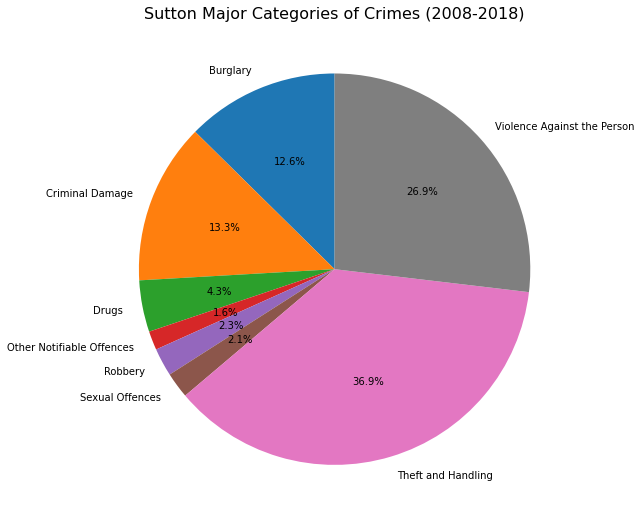

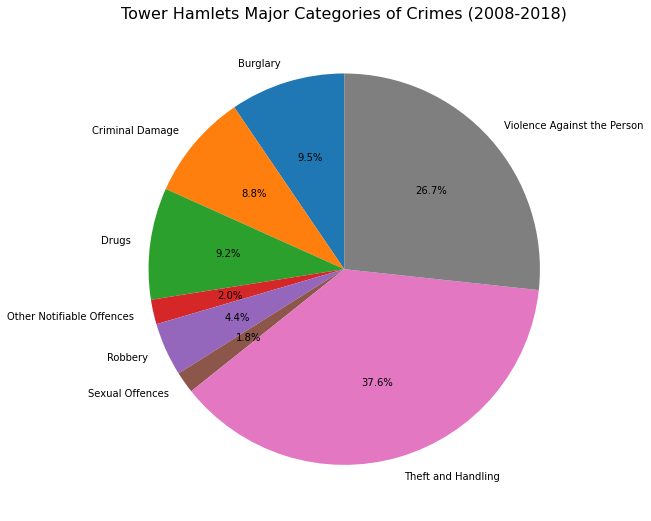

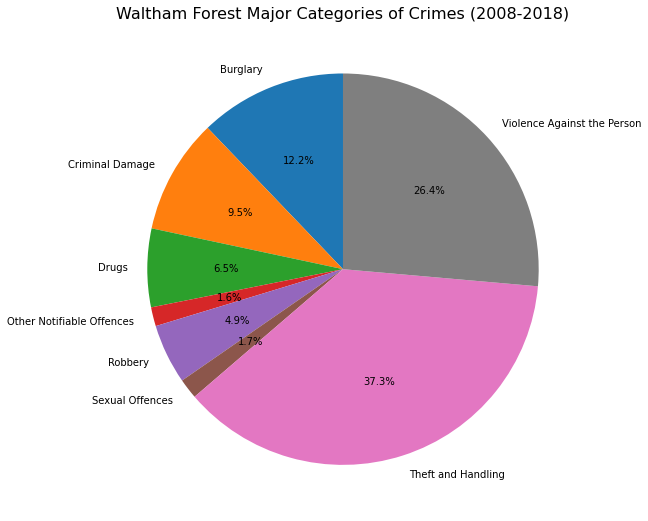

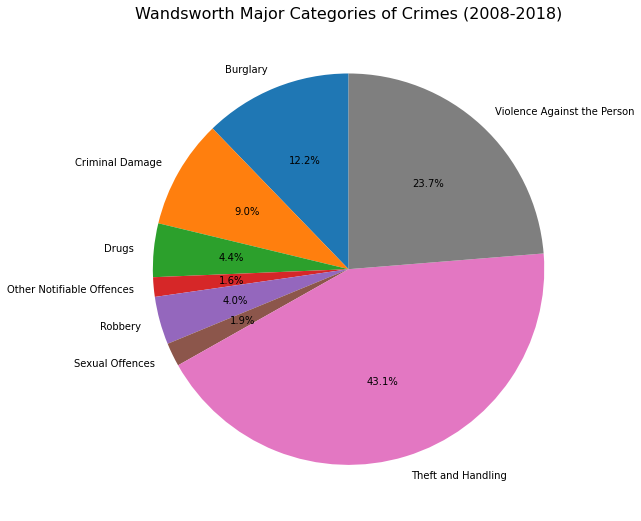

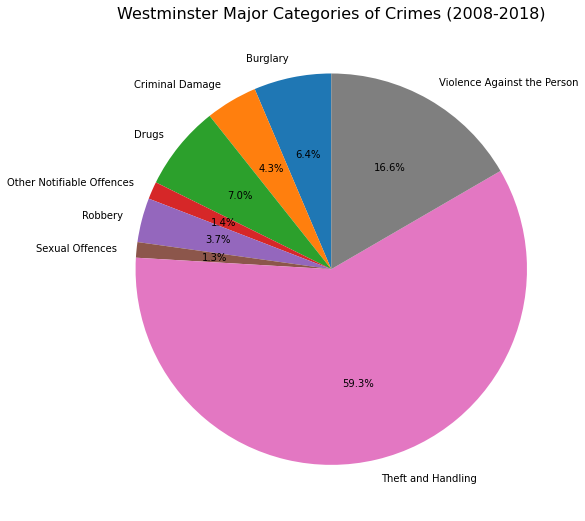

In [155]:
# Obtaining pie charts of major crime categories for each borough (2008-2018)
crime_category_pie_charts(crime_major_category_08_18_df, '2008-2018')

There are subtle differences in the proportions of crimes belonging to different major categories across the boroughs. We do, however, see that the proportion of crimes that are categorised as 'Theft and Handling' is over 50% for the boroughs Camden (50.4%), Kensington and Chelsea (53.7%), and Westminster (59.3%). These boroughs are often associated with high levels of tourism, which likely contributes to these high percentages. This suggests that our analysis might benefit if we also look at crime levels without theft included, as most people would be unlikely to commit such crimes in their local area, which has the potential to distort our selections of boroughs with high crime levels due to local socioeconomic factors.

We can also see that the proportion of crimes classed as 'Burglary' is generally under 10% for the Inner London boroughs, while the Outer London boroughs are all above 10%, with particularly high proportions in Barnet (16.7%), Harrow and Richmond (both 16.3%). This contrast between the two areas of London is most likely due to the larger number of houses in the Outer London boroughs, while the large blocks of flats and increased CCTV presence, both of which are more common in Inner London, results in a lower proportion of crimes in this area that are classed as 'Burglary'.

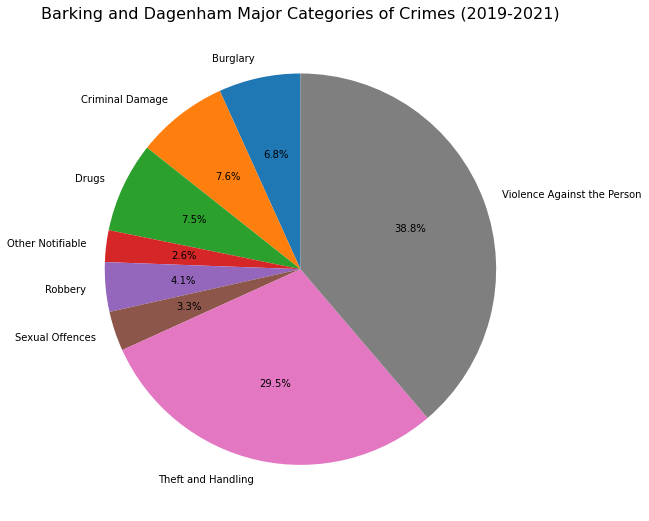

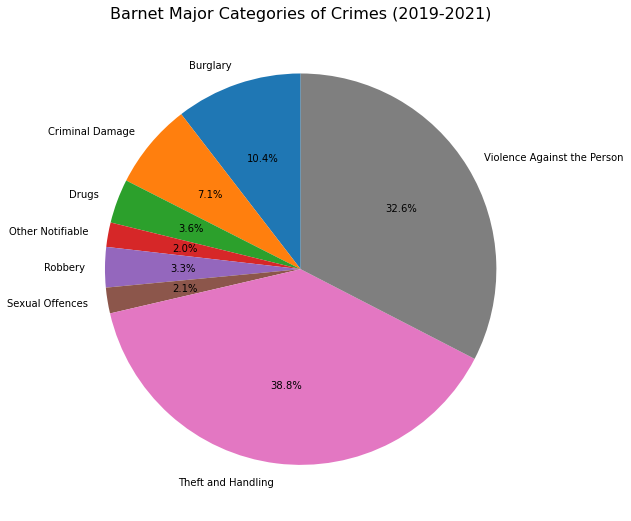

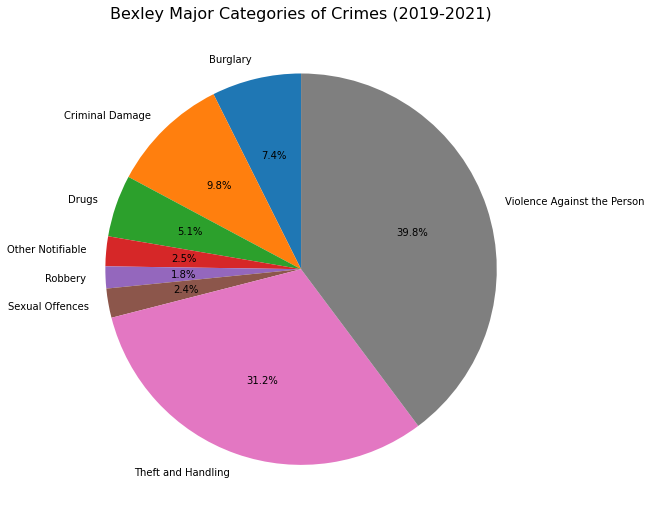

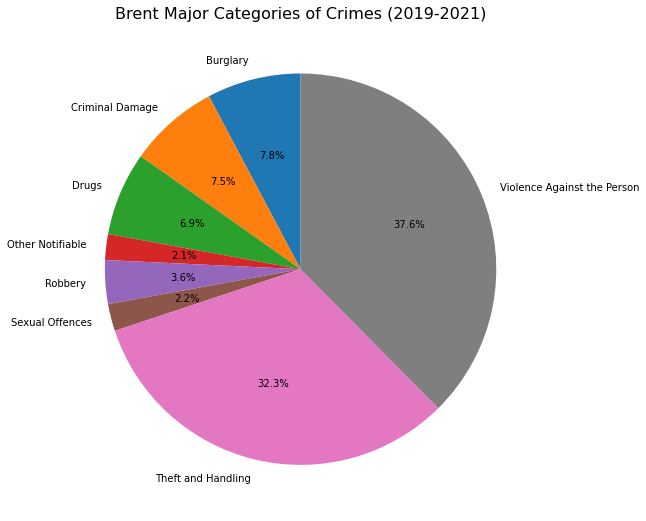

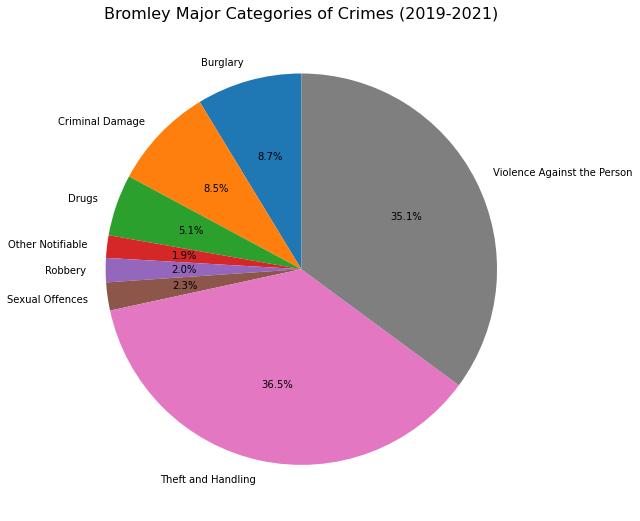

...

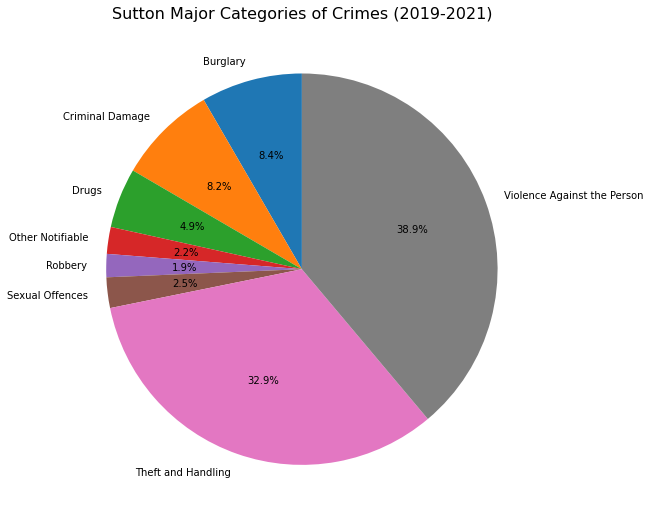

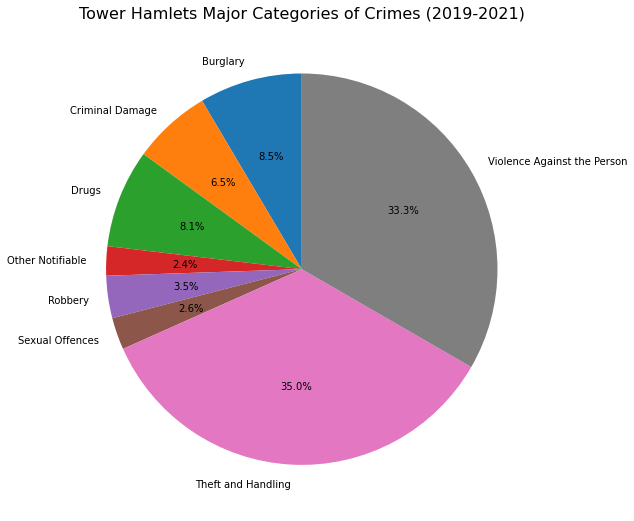

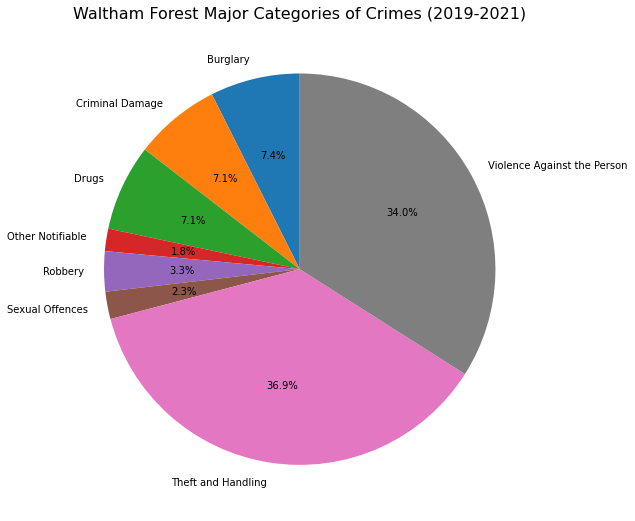

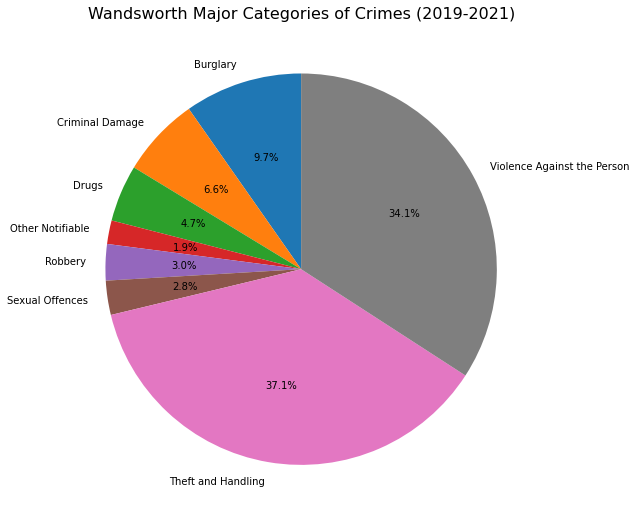

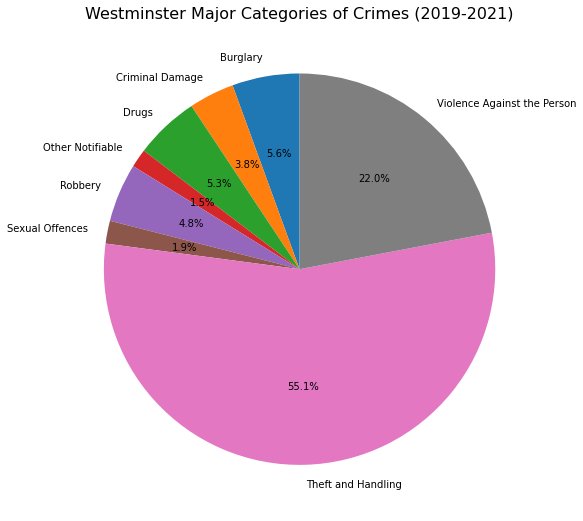

In [156]:
# Obtaining pie charts of major crime categories for each borough (2009-2021)
crime_category_pie_charts(crime_major_category_19_21_df, '2019-2021')

We can see that for the years 2019-2021, the proportion of crimes categorised as 'Violence Against the Person' increased significantly. This is reflected by the high levels of homicide and violent crime seen in 2019. This increase could also possibly be partially explained by the rise in reports of domestic violence in many areas, such as China's Hubei province, where domestic violence reports to police more than tripled in one county alone during the lockdown in February, from 47 last year to 162 this year. The Catalan regional government saw calls to its helpline rise by 20% in the first few days of lockdown, while Cyprus saw calls to a similar hotline rise by 30% in the week after 9 March, when the island had its first confirmed case of coronavirus.

## 2.1: Crimes Excluding 'Theft and Handling'

In [157]:
# Removing theft crime counts.
crime_categories_no_theft_08_18_df = crime_major_category_08_18_df[crime_major_category_08_18_df['Major Category']!='Theft and Handling']
crime_categories_no_theft_19_21_df = crime_major_category_19_21_df[crime_major_category_19_21_df['Major Category']!='Theft and Handling']

In [158]:
# Grouping by borough, whilst summing over different crime categories.
crime_no_theft_08_18_df = crime_categories_no_theft_08_18_df.groupby(['Borough']).sum()
crime_no_theft_19_21_df = crime_categories_no_theft_19_21_df.groupby(['Borough']).sum()

In [159]:
# Dropping total column so that the DataFrames can be joined without containing incorrect crime totals for the new time period.
crime_no_theft_08_18_df.drop(columns=['total'], inplace=True)
crime_no_theft_19_21_df.drop(columns=['total'], inplace=True)

In [160]:
crime_no_theft_08_18_df.head()

,200801,200802,200803,200804,200805,200806,200807,200808,200809,200810,...,201803,201804,201805,201806,201807,201808,201809,201810,201811,201812
Borough,,,,,,,,,,,,,,,,,,,,,
Barking and Dagenham,1075,1012,1008,1086,1025,1098,1152,1164,938,1073,...,1123,1003,1038,1071,1147,965,1019,1067,1015,1077
Barnet,1289,1100,1250,1228,1375,1218,1256,1094,1090,1235,...,1454,1434,1502,1468,1508,1370,1282,1583,1509,1483
Bexley,884,915,945,891,869,809,844,853,794,854,...,825,800,893,925,828,812,826,889,978,980
Brent,1473,1341,1600,1352,1560,1427,1533,1428,1430,1666,...,1784,1609,1887,1883,1889,1706,1715,1778,1763,1577
Bromley,1431,1296,1329,1285,1313,1255,1482,1296,1233,1340,...,1343,1211,1291,1234,1260,1155,1226,1249,1282,1294


In [161]:
# Joining datasets
crime_no_theft_08_21_df = crime_no_theft_08_18_df.join(crime_no_theft_19_21_df)

In [162]:
# Dropping columns containing years that are not covered by the other datasets involved in our analysis.
drop_cols = []
for col_name in crime_no_theft_08_21_df.columns:
    year = col_name[:4]
    if int(year) > 2018 or int(year) < 2010:
        drop_cols.append(col_name)
crime_no_theft_10_18_df = crime_no_theft_08_21_df.drop(columns=drop_cols)

In [163]:
crime_no_theft_08_21_df.head()

,200801,200802,200803,200804,200805,200806,200807,200808,200809,200810,...,202102,202103,202104,202105,202106,202107,202108,202109,202110,202111
Borough,,,,,,,,,,,,,,,,,,,,,
Barking and Dagenham,1075,1012,1008,1086,1025,1098,1152,1164,938,1073,...,1035,1143,1196,1254,1294,1284,1185,1233,1330,1203
Barnet,1289,1100,1250,1228,1375,1218,1256,1094,1090,1235,...,1222,1628,1469,1549,1536,1449,1324,1488,1554,1392
Bexley,884,915,945,891,869,809,844,853,794,854,...,705,923,871,940,943,946,873,896,980,946
Brent,1473,1341,1600,1352,1560,1427,1533,1428,1430,1666,...,1460,1608,1522,1698,1644,1809,1690,1601,1791,1634
Bromley,1431,1296,1329,1285,1313,1255,1482,1296,1233,1340,...,959,1191,1228,1262,1217,1296,1050,1253,1292,1320


We must turn the monthly counts into yearly counts, by summing across all of the months in a year. 

Note: The DataFrame containing monthly crime counts will be saved for timeseries analysis

In [164]:
# Defining annual crime count DataFrame.
yearly_crime_no_theft_08_21_df = pd.DataFrame(index=borough_list)
for i in range(0,14): # As there are 13 years in the DataFrame.
    jan_year_index = 12* i # Calculating index of column for January of year i.
    month_year = crime_no_theft_08_21_df.columns[jan_year_index] # Acquiring relevant column name.
    year = month_year[:4] # Acquiring year from column name.
    # Column for year added to new DataFrame by summing over all of the month columns in the respective year of our monthly 
    # crime DataFrame.
    yearly_crime_no_theft_08_21_df[year] = crime_no_theft_08_21_df[crime_no_theft_08_21_df.columns[jan_year_index: jan_year_index+12]].sum(axis=1)

In [165]:
# Obtaining the total number of crimes (excluding theft) in each borough for 2010-2018.
total_crime_no_theft_10_18_df = pd.DataFrame()
total_crime_no_theft_10_18_df['no_theft_crimes'] = crime_no_theft_10_18_df.sum(axis=1)

In [166]:
# Normalising our total crime (excluding theft) values so they will be easier to compare in terms of proportion
total_crime_no_theft_10_18_df['no_theft_norm_crimes'] = total_crime_no_theft_10_18_df / total_crime_no_theft_10_18_df.max()

In [167]:
# Displaying the boroughs with the 10 highest crime counts (excluding theft) for 2010-2018.
total_crime_no_theft_10_18_df.sort_values(by=['no_theft_crimes'], ascending=False, inplace=True)
total_crime_no_theft_10_18_df.head(10)

,no_theft_crimes,no_theft_norm_crimes
Borough,,
Westminster,209766,1.000000
Lambeth,188457,0.898415
Southwark,180305,0.859553
Croydon,178846,0.852598
Brent,169934,0.810112
Newham,169927,0.810079
Tower Hamlets,163827,0.780999
Ealing,162492,0.774635
Lewisham,150892,0.719335


In [168]:
# Deriving datasets for annual crime per capita (excluding theft and handling), by borough, for 2010-2018.
yearly_no_theft_crime_pc_10_18_df = X_per_capita(yearly_crime_no_theft_08_21_df, borough_pop_df)

In [169]:
# Calculating mean annual crimes per capita (excluding theft and handling) for each borough.
yearly_no_theft_mean_crime_pc_10_18_df = yearly_no_theft_crime_pc_10_18_df.mean(axis=1)
yearly_no_theft_mean_crime_pc_10_18_df = yearly_no_theft_mean_crime_pc_10_18_df.to_frame()
# Renaming column.
yearly_no_theft_mean_crime_pc_10_18_df.columns = ['no_theft_mean_crime_pc']

In [170]:
# Displaying 10 highest boroughs for mean annual crimes per capita (excluding theft and handling) for 2010-2018.
yearly_no_theft_mean_crime_pc_10_18_df.sort_values(by=['no_theft_mean_crime_pc'], ascending=False, inplace=True)
yearly_no_theft_mean_crime_pc_10_18_df.head(10)

,no_theft_mean_crime_pc
Westminster,0.101342
Southwark,0.068737
Islington,0.067971
Lambeth,0.067827
Camden,0.067456
Tower Hamlets,0.065162
Hammersmith and Fulham,0.065080
Hackney,0.064796
Haringey,0.062327
Barking and Dagenham,0.061542


Joining total and per capita crime (exluding theft and handling) DataFrames with the DataFrame containing the totals/averages of each variable we are analysing.

In [171]:
borough_summary_df = borough_summary_df.join(total_crime_no_theft_10_18_df)
borough_summary_df = borough_summary_df.join(yearly_no_theft_mean_crime_pc_10_18_df)

## 2.2: Total Crimes by Major Category (2008-2018)

The pie charts cobined with recent headlines suggest that the 'Major Categories' of crimes committed in each borough should provide a useful variable on which to cluster the boroughs.

In [172]:
# Assigning new variable, so we may recall old one if necessary.
sum_crime_major_category_08_18_df = crime_major_category_08_18_df

In [173]:
# Summing category crimes across months.
sum_crime_major_category_08_18_df['sum_crimes_08_18'] = sum_crime_major_category_08_18_df.iloc[:,2:].sum(axis=1)

In [174]:
# Filtering for desired columns
sum_crime_major_category_08_18_df = sum_crime_major_category_08_18_df[['Borough', 'Major Category', 'sum_crimes_08_18']]

In [175]:
sum_crime_major_category_08_18_df.head()

,Borough,Major Category,sum_crimes_08_18
0,Barking and Dagenham,Burglary,44468
1,Barking and Dagenham,Criminal Damage,45416
2,Barking and Dagenham,Drugs,24432
3,Barking and Dagenham,Other Notifiable Offences,7394
4,Barking and Dagenham,Robbery,16188


We will now derive a DataFrame for the total number of crimes for each category in each borough. The columns names are boroughs and the row indices are crime categories.

In [176]:
# Defining new DataFrame where column names are boroughs.
total_crime_major_category_08_18_df = pd.DataFrame(columns=borough_list)
# Iterating through boroughs.
for borough in borough_list:
    # This will create a DataFrame for the specific borough, listing the total number of crimes for each category.
    borough_crime_major_category_df = sum_crime_major_category_08_18_df[sum_crime_major_category_08_18_df['Borough'] == borough][['Major Category', 'sum_crimes_08_18']]
    # Set the crime categories as the indices.
    borough_crime_major_category_df.set_index('Major Category', inplace=True)
    # Adding column to new DataFrame for specified borough, where the indices are categories.
    total_crime_major_category_08_18_df[borough] = borough_crime_major_category_df

In [177]:
total_crime_major_category_08_18_df.head()

,Barking and Dagenham,Barnet,Bexley,Brent,Bromley,Camden,Croydon,Ealing,Enfield,Greenwich,...,Merton,Newham,Redbridge,Richmond upon Thames,Southwark,Sutton,Tower Hamlets,Waltham Forest,Wandsworth,Westminster
Major Category,,,,,,,,,,,,,,,,,,,,,
Burglary,44468,91374,37272,73064,67686,70888,80322,74346,75412,56432,...,40198,64940,68378,41064,72738,32338,59978,62548,64904,80984
Criminal Damage,45416,51186,41780,51296,57994,44600,75260,61420,55422,59692,...,33864,60124,43060,28242,61288,34078,55402,48844,47776,54212
Drugs,24432,23230,17658,64010,21350,50710,46410,44102,32022,27108,...,15718,47098,36460,11496,68978,10920,58230,33320,23480,88732
Other Notifiable Offences,7394,8190,5682,10350,7060,9866,11906,11778,9280,10526,...,4386,12040,7372,3784,12728,3988,12856,8056,8544,18296
Robbery,16188,17806,6100,32068,12340,26662,30800,23640,23572,15004,...,9784,43134,20106,4538,42036,5944,27800,25400,21012,46288


We will now derive a DataFrame for the proportions of crimes in each borough that belong to each category. The columns names are boroughs and the row indices are crime categories.

In [178]:
# Defining new DataFrame where column names are boroughs.
crime_major_category_percent_08_18_df = pd.DataFrame(columns=borough_list)
# Iterating through boroughs.
for borough in borough_list:
    # Adding column to new DataFrame for specified borough, where the elements are numbers of occurences of each crime category,
    # divided by the total number of crimes in the borough. 
    crime_major_category_percent_08_18_df[borough] = total_crime_major_category_08_18_df[borough] / total_crime_major_category_08_18_df[borough].sum()

In [179]:
# Taking transpose so the row indices are boroughs, to allow ease of joining DataFrames.
crime_major_category_percent_08_18_df = crime_major_category_percent_08_18_df.T

In [180]:
crime_major_category_percent_08_18_df.head()

Major Category,Burglary,Criminal Damage,Drugs,Other Notifiable Offences,Robbery,Sexual Offences,Theft and Handling,Violence Against the Person
Barking and Dagenham,0.114565,0.117007,0.062945,0.019049,0.041706,0.019611,0.331348,0.293769
Barnet,0.166729,0.093398,0.042387,0.014944,0.032490,0.016342,0.401015,0.232695
Bexley,0.125907,0.141135,0.059650,0.019194,0.020606,0.018904,0.338319,0.276285
Brent,0.121256,0.085130,0.106230,0.017177,0.053219,0.016519,0.313764,0.286706
Bromley,0.142841,0.122388,0.045056,0.014899,0.026042,0.016309,0.367527,0.264938


In [181]:
# Joining total crimes per category for each borough onto our DataFrame containing the summary statistics for each borough
borough_summary_df = borough_summary_df.join(crime_major_category_percent_08_18_df)

# 3: K-Means Clustering

The similarities in characteristics of different areas, coinciding with the crime category proportions seen in the pie charts, suggest that we may identify unifying features of areas that could contribute to contrasts in crime rates, as well as providing the opportunity to ascertain what features have a larger effect on crime within a cluster of boroughs with similar characteristics.

## 3.1: Variable Selection

### 3.1.1: Independent Variables

We will now select the independent variables from our DataFrame of summary data for each borough. We will use these variables to perform a k-means clustering algorithm, in order to ascertain which boroughs have similar characteristics in terms of the measurements that have been picked to quantify quality of life.

In [182]:
# Selecting independent variables to cluster on.
k_means_borough_summary_df = borough_summary_df[['earning_below_llw_%', 'workless_households_%', 'homeless_%', 'affordable_housing_pc', 'NVQ1_or_less_%', 'population_density']]

### 3.1.2: Crimes per Capita

When grouping boroughs by crimes per capita, we tend to end up with one cluster containing Westminster, whilst all of the other boroughs are assigned to one other cluster. This is due to the extremely high levels of crime in Westminster in comparison to the rest of the city. Thus, when clustering by crime per capita, we will leave Westminster out of our clustering algorithm

In [183]:
# Removing Westminster from DataFrame.
no_westminster_borough_summary_df = borough_summary_df.drop(index=['Westminster'])

In [184]:
k_means_crime_borough_summary_df = no_westminster_borough_summary_df[['crime_pc']]

### 3.1.3: Crime Category Proportions

We will now select the 8 different major categories of crimes that we are analysing. For each borough, we have 8 rows, one per category, displaying the percentage of crimes committed, within the borough, that are classified to each of the 8 different categories.

In [185]:
k_means_crime_category_totals_df = borough_summary_df[['Burglary', 'Criminal Damage', 'Drugs', 'Other Notifiable Offences', 'Robbery', 'Sexual Offences', 'Theft and Handling', 'Violence Against the Person']]

## 3.2: Elbow Method

In [186]:
from sklearn.cluster import KMeans

We will now use the elbow method to find the optimal value of k, for our clustering algorithm. We do this by running the algorithm for different values of k. We then find the variation within the clusters, which is the sum of distances between each member of a cluster and the cluster's mean. The variation within the clusters is then plot against the different values for k, and we search for an 'elbow' in the graph.

Note: In this section, we will set random_state=0 when we use the KMeans and silhouette_score functions. This is for reproducibility.

In [187]:
def elbow_method(df, file_name):
    inertia = []
    # Testing for k=1 up to k=10
    k_list = range(1,11)
    for k in k_list:
        # Defining model object with k clutsers
        kmeans_model = KMeans(n_clusters=k, random_state=0)
        # Fitting model to input DataFrame
        kmeans_model.fit(df)
        # Storing measures for the mean of variation over each cluster
        inertia.append(kmeans_model.inertia_)
    # Plotting and saving graph
    plt.figure(figsize=(15, 9))
    plt.plot(k_list, inertia, 'x-')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Total Variation within Clusters')
    plt.title('Elbow Graph for Acquiring Optimal k')
    plt.show()
    plt.savefig('figures/elbow_graphs/{}.svg'.format(file_name), bbox_inches='tight', dpi=300)

### 3.2.1: Independent Variables

C:\Users\User\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


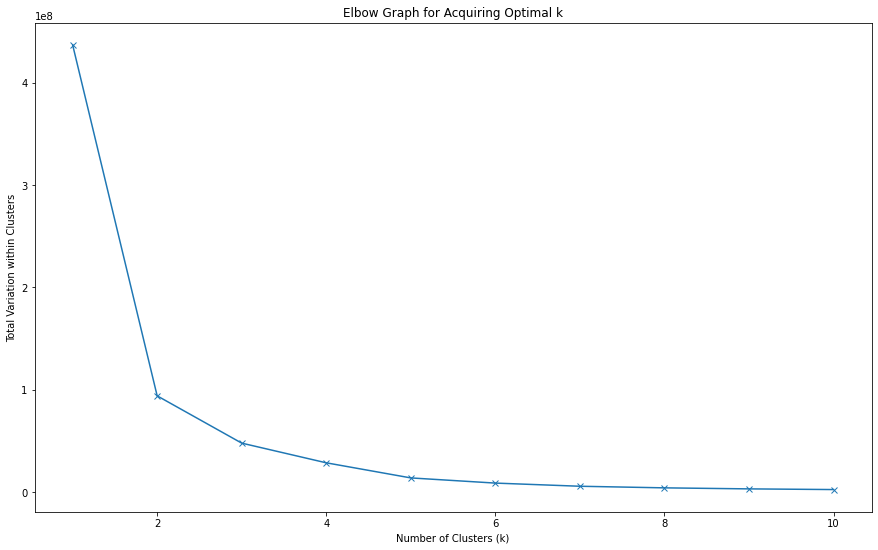

<Figure size 432x288 with 0 Axes>

In [188]:
# Plotting elbow graph for k-means split based on our independent variable values.
elbow_method(k_means_borough_summary_df, 'kmeans_elbow_graph')

From the graph above, we would expect the optimal value of k to be either 2 or 3. To be certain, we will use the silhouette method.

### 3.2.2: Crimes per Capita

C:\Users\User\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


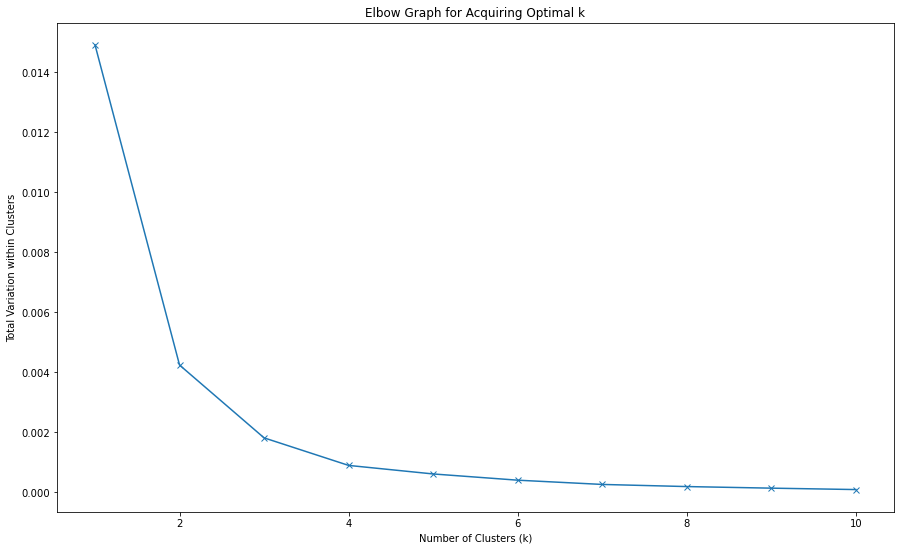

<Figure size 432x288 with 0 Axes>

In [189]:
# Plotting elbow graph for crime per capita (excluding theft and handling).
elbow_method(k_means_crime_borough_summary_df, 'kmeans_crime_elbow_graph')

Again, it is difficult to tell whether the optimal value of k is 2 or 3. The silhouette method will be utilised.

### 3.2.3: Crime Categories

C:\Users\User\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


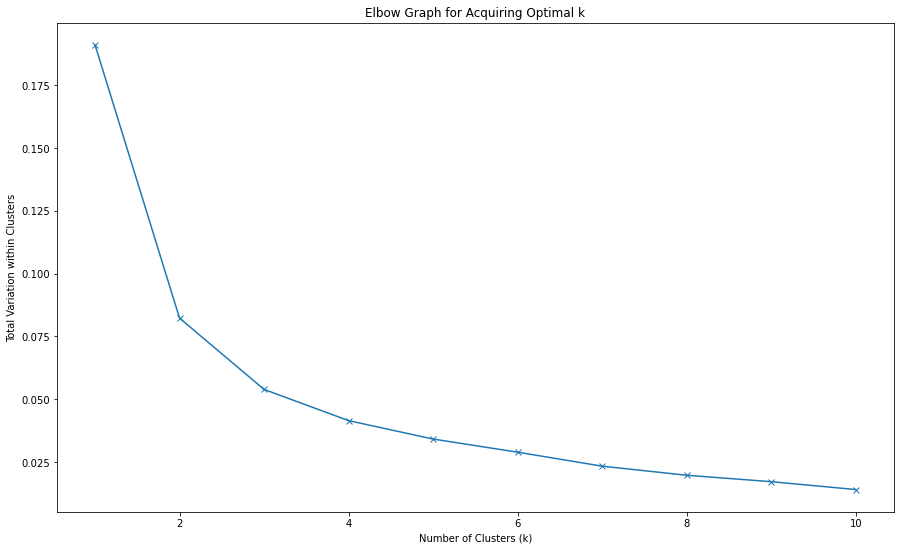

<Figure size 432x288 with 0 Axes>

In [190]:
# Plotting elbow graph for k-means clustering based on the proportions of different crime categories in each borough.
elbow_method(k_means_crime_category_totals_df, 'crime_category_elbow_graph')

Similarly to the other elbow plots, 2 and 3 are both candidates for the optimal value of k. We will use the silhouette method for this set of clusters as well.

## 3.3: Silhouette Method

This method involves calculating the silhouette score for our k-means model over a number of different values of k. Silhouette score acts as a goodness-of-fit metric that compares cohesion and separation in the model. The k-value for which we get the highest silhouette score will be the optimal value for k.

In [191]:
from sklearn.metrics import silhouette_score

In [192]:
def silhouette_method(df):
    # Defining silhouette score DataFrame
    silhouette_score_df = pd.DataFrame(columns=['k', 'silhouette_score'])
    # k ranging from 2 to 10 (we can't use k=1 for silhouette score)
    k_list = range(2,11)
    silhouette_score_list = []
    for k in k_list:
        # Defining model on k clusters and fitting on our DataFrame.
        fitted_kmeans_model = KMeans(n_clusters=k, random_state=0).fit(df)
        # Acquiring cluster labels for each borough in the DataFrame
        cluster_labels = fitted_kmeans_model.labels_
        # Calculating silhouette score and appending to list
        silhouette_score_list.append(silhouette_score(df, cluster_labels, random_state=0))
    # Filling in the columns of our DataFrame using the list of k values and the list of silhouette scores.
    silhouette_score_df['k'] = k_list
    silhouette_score_df['silhouette_score'] = silhouette_score_list
    return silhouette_score_df

### 3.3.1: Independent Variables

In [193]:
# Calculating silhouette score for k-means split based on our independent variable values.
X_silhouette_score_df = silhouette_method(k_means_borough_summary_df)

In [194]:
X_silhouette_score_df.head(10)

,k,silhouette_score
0,2,0.671275
1,3,0.614854
2,4,0.492812
3,5,0.614795
4,6,0.591421
5,7,0.627313
6,8,0.598888
7,9,0.587015
8,10,0.543831


These scores confirm that k=2 is the optimal number of clusters for our data.

### 3.3.2: Crimes per Capita

In [195]:
# Calculating silhouette score for k-means split based on crime per capita (excluding Westminster).
crime_silhouette_score_df = silhouette_method(k_means_crime_borough_summary_df)

In [196]:
crime_silhouette_score_df.head(10)

,k,silhouette_score
0,2,0.616249
1,3,0.591043
2,4,0.604832
3,5,0.562920
4,6,0.550698
5,7,0.589088
6,8,0.578446
7,9,0.575992
8,10,0.597853


We can see that k=2 is the optimal number of clusters for our data.

### 3.3.3: Crime Categories

In [197]:
# Calculating silhouette score for k-means split based on crime category proportions.
crime_category_silhouette_score_df = silhouette_method(k_means_crime_category_totals_df)

In [198]:
crime_category_silhouette_score_df.head(10)

,k,silhouette_score
0,2,0.564428
1,3,0.336015
2,4,0.301138
3,5,0.286614
4,6,0.296351
5,7,0.294696
6,8,0.270857
7,9,0.271352
8,10,0.292275


Our silhouette scores for the third k-means model also reveal k=2 to be the optimal number of clusters.

## 3.4: Fitting K-Clusters

Below we define a function for acquiring cluster labels for a k-means model. The function fits a model to the specfied column of the input DataFrame, where the number of clusters is determined by the k variable.

In [199]:
def fit_k_clusters(df, k, col_name, no_westminster=False):
    # Defining and fitting model
    final_kmeans_model = KMeans(n_clusters=k).fit(df)
    # Acquiring cluster labels for each borough in the DataFrame.
    cluster_labels = final_kmeans_model.labels_
    if no_westminster:
        # Adding cluster column to the borough summary DataFrame that excludes Westminster
        no_westminster_borough_summary_df[col_name] = cluster_labels
    else:
        # Adding cluster column to the borough summary DataFrame.
        borough_summary_df[col_name] = cluster_labels
    return

Defining a function to acquire a DataFrame of all yearly measurements from all boroughs within a particular cluster. We must input the DataFrame containing the variables and cluster labels. The function will then concatenate all of the measurements from the boroughs included in the specified cluster, returning the combined DataFrame and a list of the boroughs included in the cluster.

In [200]:
def find_cluster_df(df, cluster_col_name, cluster_label):
    # Defining DataFrame for yearly measurements within cluster, where the columns are the variable names.
    cluster_df = pd.DataFrame(columns=Bark_and_Dag_df.columns)
    # Finding indices of rows in input DataFrame where the cluster labels are equal to the desired cluster labels for the
    # specified type of cluster.
    cluster_boroughs = df[df[cluster_col_name]==cluster_label].index.values
    # Print boroughs in cluster
    print('The boroughs in cluster {} are: {}.'.format(cluster_label, cluster_boroughs))
    # Using dictionary of borough DataFrames to concatenate over all boroughs that are included in the cluster.
    for borough in cluster_boroughs:
        cluster_df = pd.concat([cluster_df, borough_df_dict[borough]], ignore_index=True)
    return cluster_df, cluster_boroughs

### 3.4.1: Independent Variables

In [201]:
# Fitting k-means model on independent variables and acquiring cluster labels for new independent variable cluster column (k=2).
fit_k_clusters(k_means_borough_summary_df, 2, 'X_clusters')

In [202]:
# Acquiring DataFrame for cluster labelled 0, as well as a list of the included boroughs.
X_cluster_0_df, X_cluster_0_boroughs = find_cluster_df(borough_summary_df, 'X_clusters', 0)

The boroughs in cluster 0 are: ['Barking and Dagenham' 'Barnet' 'Bexley' 'Brent' 'Bromley' 'Croydon'
 'Ealing' 'Enfield' 'Greenwich' 'Harrow' 'Havering' 'Hillingdon'
 'Hounslow' 'Kingston upon Thames' 'Merton' 'Redbridge'
 'Richmond upon Thames' 'Sutton' 'Waltham Forest'].


In [203]:
X_cluster_0_df.head()

,crime_num,crime_pc,earning_below_llw_%,workless_households_%,homeless_%,affordable_housing_pc,NVQ1_or_less_%,population_density,police_pc
0,18306,0.100121,13.7,26.2,0.000011,0.001553,0.2051,5063.7,0.006520
1,17591,0.094055,16.1,24.9,0.00007,0.002053,0.186602,5190.5,0.006170
2,16567,0.086892,17,26.5,0.000042,0.000598,0.172556,5288.3,0.005804
3,16445,0.084517,16.2,11.2,0.0,0.002724,0.190671,5393.3,0.005342
4,16192,0.08151,24.1,20.5,0.00002,0.006041,0.176693,5502.5,0.005234


In [204]:
# Acquiring DataFrame for cluster labelled 1, as well as a list of the included boroughs.
X_cluster_1_df, X_cluster_1_boroughs = find_cluster_df(borough_summary_df, 'X_clusters', 1)

The boroughs in cluster 1 are: ['Camden' 'Hackney' 'Hammersmith and Fulham' 'Haringey' 'Islington'
 'Kensington and Chelsea' 'Lambeth' 'Lewisham' 'Newham' 'Southwark'
 'Tower Hamlets' 'Wandsworth' 'Westminster'].


In [205]:
X_cluster_1_df.head()

,crime_num,crime_pc,earning_below_llw_%,workless_households_%,homeless_%,affordable_housing_pc,NVQ1_or_less_%,population_density,police_pc
0,32671,0.152153,7.7,21.7,0.000051,0.001681,0.095005,9854.6,0.006520
1,35063,0.159314,9.8,25,0.000032,0.001072,0.105867,10100.7,0.006170
2,32267,0.143531,10.1,22.2,0.000022,0.002131,0.085406,10324.4,0.005804
3,29138,0.12642,10.9,11.8,0.000017,0.00095,0.106731,10542.7,0.005342
4,27886,0.11815,12.2,19.1,0.000021,0.001178,0.081772,10778.0,0.005234


### 3.4.2: Crimes per Capita

In [206]:
# Fitting k-means model, split on crimes per capita, and acquiring cluster labels for new crimes per capita cluster column (k=2).
fit_k_clusters(k_means_crime_borough_summary_df, 2, 'crime_pc_clusters', no_westminster=True)

In [207]:
# Acquiring DataFrame for cluster labelled 0, as well as a list of the included boroughs.
crime_pc_cluster_0_df, crime_pc_cluster_0_boroughs = find_cluster_df(no_westminster_borough_summary_df, 'crime_pc_clusters', 0)

The boroughs in cluster 0 are: ['Barking and Dagenham' 'Barnet' 'Bexley' 'Brent' 'Bromley' 'Croydon'
 'Ealing' 'Enfield' 'Greenwich' 'Harrow' 'Havering' 'Hillingdon'
 'Hounslow' 'Kingston upon Thames' 'Lewisham' 'Merton' 'Redbridge'
 'Richmond upon Thames' 'Sutton' 'Waltham Forest' 'Wandsworth'].


In [208]:
crime_pc_cluster_0_df.head()

,crime_num,crime_pc,earning_below_llw_%,workless_households_%,homeless_%,affordable_housing_pc,NVQ1_or_less_%,population_density,police_pc
0,18306,0.100121,13.7,26.2,0.000011,0.001553,0.2051,5063.7,0.006520
1,17591,0.094055,16.1,24.9,0.00007,0.002053,0.186602,5190.5,0.006170
2,16567,0.086892,17,26.5,0.000042,0.000598,0.172556,5288.3,0.005804
3,16445,0.084517,16.2,11.2,0.0,0.002724,0.190671,5393.3,0.005342
4,16192,0.08151,24.1,20.5,0.00002,0.006041,0.176693,5502.5,0.005234


In [209]:
# Acquiring DataFrame for cluster labelled 1, as well as a list of the included boroughs.
crime_pc_cluster_1_df, crime_pc_cluster_1_boroughs = find_cluster_df(no_westminster_borough_summary_df, 'crime_pc_clusters', 1)

The boroughs in cluster 1 are: ['Camden' 'Hackney' 'Hammersmith and Fulham' 'Haringey' 'Islington'
 'Kensington and Chelsea' 'Lambeth' 'Newham' 'Southwark' 'Tower Hamlets'].


In [210]:
crime_pc_cluster_1_df.head()

,crime_num,crime_pc,earning_below_llw_%,workless_households_%,homeless_%,affordable_housing_pc,NVQ1_or_less_%,population_density,police_pc
0,32671,0.152153,7.7,21.7,0.000051,0.001681,0.095005,9854.6,0.006520
1,35063,0.159314,9.8,25,0.000032,0.001072,0.105867,10100.7,0.006170
2,32267,0.143531,10.1,22.2,0.000022,0.002131,0.085406,10324.4,0.005804
3,29138,0.12642,10.9,11.8,0.000017,0.00095,0.106731,10542.7,0.005342
4,27886,0.11815,12.2,19.1,0.000021,0.001178,0.081772,10778.0,0.005234


### 3.4.3: Crime Categories

In [211]:
# Fitting k-means model, split on crime category proportions, and acquiring cluster labels for new crimes per capita cluster 
# column (k=2).
fit_k_clusters(k_means_crime_category_totals_df, 2, 'crime_category_clusters')

In [212]:
# Acquiring DataFrame for cluster labelled 0, as well as a list of the included boroughs.
crime_category_cluster_0_df, crime_category_cluster_0_boroughs = find_cluster_df(borough_summary_df, 'crime_category_clusters', 0)

The boroughs in cluster 0 are: ['Barking and Dagenham' 'Barnet' 'Bexley' 'Brent' 'Bromley' 'Croydon'
 'Ealing' 'Enfield' 'Greenwich' 'Hackney' 'Haringey' 'Harrow' 'Havering'
 'Hillingdon' 'Hounslow' 'Kingston upon Thames' 'Lambeth' 'Lewisham'
 'Merton' 'Newham' 'Redbridge' 'Richmond upon Thames' 'Southwark' 'Sutton'
 'Tower Hamlets' 'Waltham Forest' 'Wandsworth'].


In [213]:
crime_category_cluster_0_df.head()

,crime_num,crime_pc,earning_below_llw_%,workless_households_%,homeless_%,affordable_housing_pc,NVQ1_or_less_%,population_density,police_pc
0,18306,0.100121,13.7,26.2,0.000011,0.001553,0.2051,5063.7,0.006520
1,17591,0.094055,16.1,24.9,0.00007,0.002053,0.186602,5190.5,0.006170
2,16567,0.086892,17,26.5,0.000042,0.000598,0.172556,5288.3,0.005804
3,16445,0.084517,16.2,11.2,0.0,0.002724,0.190671,5393.3,0.005342
4,16192,0.08151,24.1,20.5,0.00002,0.006041,0.176693,5502.5,0.005234


In [214]:
# Acquiring DataFrame for cluster labelled 1, as well as a list of the included boroughs.
crime_category_cluster_1_df, crime_category_cluster_1_boroughs = find_cluster_df(borough_summary_df, 'crime_category_clusters', 1)

The boroughs in cluster 1 are: ['Camden' 'Hammersmith and Fulham' 'Islington' 'Kensington and Chelsea'
 'Westminster'].


In [215]:
crime_category_cluster_1_df.head()

,crime_num,crime_pc,earning_below_llw_%,workless_households_%,homeless_%,affordable_housing_pc,NVQ1_or_less_%,population_density,police_pc
0,32671,0.152153,7.7,21.7,0.000051,0.001681,0.095005,9854.6,0.006520
1,35063,0.159314,9.8,25,0.000032,0.001072,0.105867,10100.7,0.006170
2,32267,0.143531,10.1,22.2,0.000022,0.002131,0.085406,10324.4,0.005804
3,29138,0.12642,10.9,11.8,0.000017,0.00095,0.106731,10542.7,0.005342
4,27886,0.11815,12.2,19.1,0.000021,0.001178,0.081772,10778.0,0.005234


We will visualise, and analyse, our borough clusters in the next section.

# 4: Borough Maps and Heatmaps

## 4.1: Map DataFrame Preparation

In [216]:
import geopandas as gpd

In [217]:
# Loading borough boundaries for plotting in geopandas.
borough_map_df = gpd.read_file('pods_datasets/used/geodata/statistical-gis-boundaries-london/ESRI/London_Borough_Excluding_MHW.shp')

In [218]:
# Joining, by borough, our borough summary DataFrame, containing the summed or averaged variables for each borough, as well as
# the clusters for independent variables and crime categories.
borough_map_df.set_index('NAME', inplace=True)
borough_map_df = borough_map_df.join(borough_summary_df)

In [219]:
# Joining crime per capita cluster labels for boroughs excluding Westminster.
borough_map_df = pd.concat([borough_map_df, no_westminster_borough_summary_df['crime_pc_clusters']], axis=1)

In [220]:
borough_map_df.head()

,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry,crime_num,crime_pc,earning_below_llw_%,...,Criminal Damage,Drugs,Other Notifiable Offences,Robbery,Sexual Offences,Theft and Handling,Violence Against the Person,X_clusters,crime_category_clusters,crime_pc_clusters
Kingston upon Thames,E09000021,3726.117,0.000,F,None,None,"POLYGON ((516401.600 160201.800, 516407.300 16...",94625,0.062599,23.211111,...,0.109648,0.059389,0.015668,0.018940,0.020014,0.411543,0.254583,0.0,0.0,0.0
Croydon,E09000008,8649.441,0.000,F,None,None,"POLYGON ((535009.200 159504.700, 535005.500 15...",270384,0.080146,24.511111,...,0.113224,0.069821,0.017912,0.046337,0.020668,0.337149,0.274049,0.0,0.0,0.0
Bromley,E09000006,15013.487,0.000,F,None,None,"POLYGON ((540373.600 157530.400, 540361.200 15...",188589,0.065321,27.6,...,0.122388,0.045056,0.014899,0.026042,0.016309,0.367527,0.264938,0.0,0.0,0.0
Hounslow,E09000018,5658.541,60.755,F,None,None,"POLYGON ((521975.800 178100.000, 521967.700 17...",203096,0.085964,20.455556,...,0.106145,0.068490,0.018612,0.025527,0.018020,0.370157,0.284134,0.0,0.0,0.0
Ealing,E09000009,5554.428,0.000,F,None,None,"POLYGON ((510253.500 182881.600, 510249.900 18...",256912,0.08367,26.833333,...,0.096420,0.069233,0.018490,0.037111,0.016348,0.362482,0.283205,0.0,0.0,0.0


In [221]:
# Dropping row containing City of London data, as it is not a London borough.
borough_map_df.drop(index=['City of London'], inplace=True)

In [222]:
borough_map_df.head(33)

,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry,crime_num,crime_pc,earning_below_llw_%,...,Criminal Damage,Drugs,Other Notifiable Offences,Robbery,Sexual Offences,Theft and Handling,Violence Against the Person,X_clusters,crime_category_clusters,crime_pc_clusters
Kingston upon Thames,E09000021,3726.117,0.000,F,None,None,"POLYGON ((516401.600 160201.800, 516407.300 16...",94625,0.062599,23.211111,...,0.109648,0.059389,0.015668,0.018940,0.020014,0.411543,0.254583,0.0,0.0,0.0
Croydon,E09000008,8649.441,0.000,F,None,None,"POLYGON ((535009.200 159504.700, 535005.500 15...",270384,0.080146,24.511111,...,0.113224,0.069821,0.017912,0.046337,0.020668,0.337149,0.274049,0.0,0.0,0.0
Bromley,E09000006,15013.487,0.000,F,None,None,"POLYGON ((540373.600 157530.400, 540361.200 15...",188589,0.065321,27.6,...,0.122388,0.045056,0.014899,0.026042,0.016309,0.367527,0.264938,0.0,0.0,0.0
Hounslow,E09000018,5658.541,60.755,F,None,None,"POLYGON ((521975.800 178100.000, 521967.700 17...",203096,0.085964,20.455556,...,0.106145,0.068490,0.018612,0.025527,0.018020,0.370157,0.284134,0.0,0.0,0.0
Ealing,E09000009,5554.428,0.000,F,None,None,"POLYGON ((510253.500 182881.600, 510249.900 18...",256912,0.08367,26.833333,...,0.096420,0.069233,0.018490,0.037111,0.016348,0.362482,0.283205,0.0,0.0,0.0
Havering,E09000016,11445.735,210.763,F,None,None,"POLYGON ((549893.900 181459.800, 549894.600 18...",151688,0.06833,26.977778,...,0.113170,0.051823,0.017345,0.024398,0.017674,0.374961,0.257889,0.0,0.0,0.0
Hillingdon,E09000017,11570.063,0.000,F,None,None,"POLYGON ((510599.800 191689.500, 510615.200 19...",208491,0.07989,19.6,...,0.115547,0.051945,0.026129,0.027502,0.015947,0.357238,0.279761,0.0,0.0,0.0
Harrow,E09000015,5046.330,0.000,F,None,None,"POLYGON ((510599.800 191689.500, 510660.000 19...",120568,0.054743,33.911111,...,0.101062,0.056090,0.017796,0.033855,0.017809,0.337484,0.272577,0.0,0.0,0.0
Brent,E09000005,4323.270,0.000,F,None,None,"POLYGON ((525201.000 182512.600, 525181.500 18...",248251,0.08626,31.233333,...,0.085130,0.106230,0.017177,0.053219,0.016519,0.313764,0.286706,0.0,0.0,0.0
Barnet,E09000003,8674.837,0.000,F,None,None,"POLYGON ((524579.900 198355.200, 524594.300 19...",224414,0.066804,25.433333,...,0.093398,0.042387,0.014944,0.032490,0.016342,0.401015,0.232695,0.0,0.0,0.0


## 4.2: Map Plotting

In [223]:
import matplotlib.cm as cm
import matplotlib.colors as colors

Below we will define a function for plotting and saving a heatmap of London boroughs for a particular variable, referenced by variable_col_name, in the borough_map_df DataFrame. The other two arguments are graph_name and file_name, both of which are strings.

In [224]:
def plot_borough_heatmap(variable_col_name, graph_name, file_name):
    fig, ax = plt.subplots(1, figsize=(15, 9))
    # Plotting values for specified variable on heatmap.
    borough_map_df.plot(column=variable_col_name, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')
    ax.axis('off')
    ax.set_title('{}'.format(graph_name), fontdict={'fontsize': '16', 'fontweight' : '3'})
    # Acquiring max and min values of variable, so we can normalise our values in order to define and display a colour bar.
    v_max = borough_map_df[variable_col_name].max()
    v_min = borough_map_df[variable_col_name].min()
    colour_bar = cm.ScalarMappable(norm=colors.Normalize(v_min,v_max), cmap='Reds')
    fig.colorbar(colour_bar)
    # Saving file
    fig.savefig('figures/borough_maps/{}.png'.format(file_name), dpi=300)

### 4.2.1: Crimes Heatmaps

#### Number of Crimes

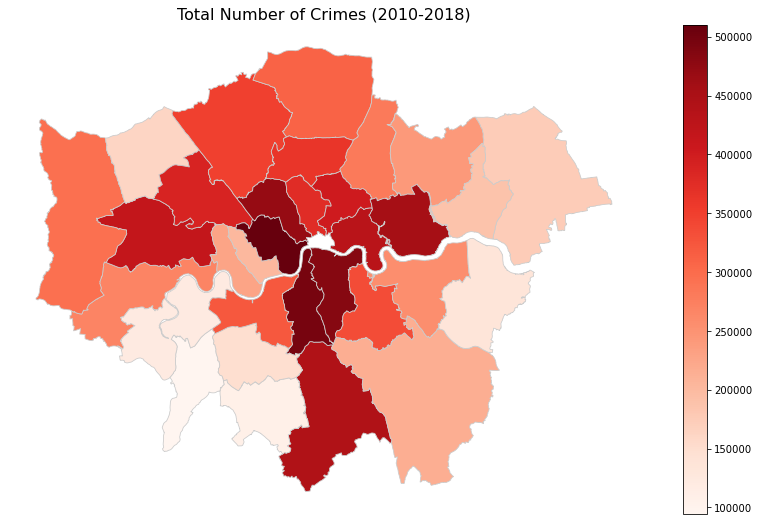

In [225]:
plot_borough_heatmap('crime_num', 'Total Number of Crimes (2010-2018)', 'total_crimes_map_10_18')

The boroughs with the highest number of crimes generally reside in Inner London, in particular tourist hotspots. We also see high numbers of crimes in highly-populated Outer London boroughs, such as Ealing and Croydon.

#### Crime per Capita

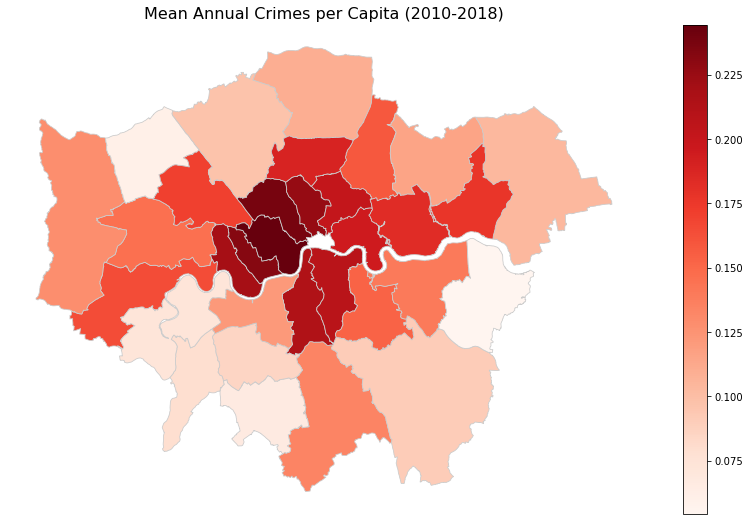

In [226]:
plot_borough_heatmap('crime_pc', 'Mean Annual Crimes per Capita (2010-2018)', 'crimes_per_capita_map_10_18')

When we change the focus of our heatmap to annual crime per capita, we can see that the Inner London boroughs, such as Kensington & Chelsea and Hammersmith & Fulham, that were not as high up the scale for crime numbers have now become more prominent in the heatmap. This map also suggests that Hounslow, Brent, Haringey and Barking & Dagenham are all Outer London boroughs that may have cause for concern in terms of crimes committed per capita.

#### Number of Crimes (Excluding Theft)

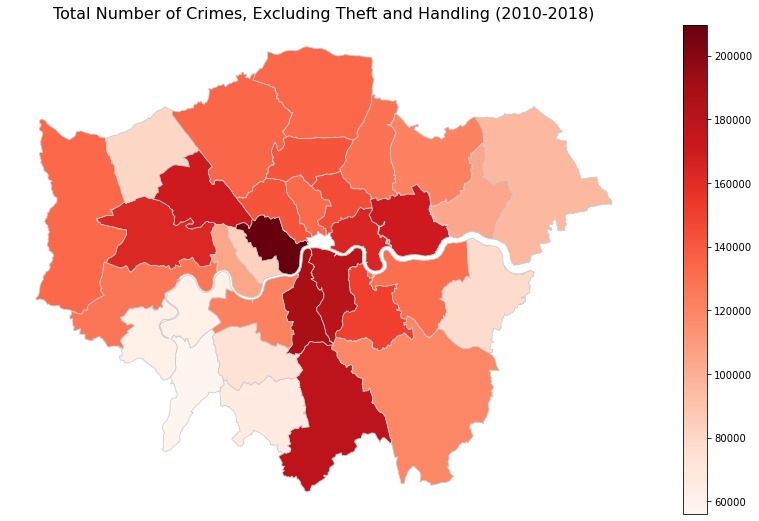

In [227]:
plot_borough_heatmap('no_theft_crimes', 'Total Number of Crimes, Excluding Theft and Handling (2010-2018)', 'no_theft_crimes_map_10_18')

Removing the crimes classes as 'Theft and Handling' causes a huge drop in the number of crimes in boroughs such as Westminster, Lambeth and Camden. This further reflects the extent to which crime such as theft is drawn towards areas with high levels of tourism. This heatmap identifies Croydon, Ealing and Brent as Outer London boroughs with a very high number of crimes not classed as theft.

#### Crime per Capita (Excluding Theft)

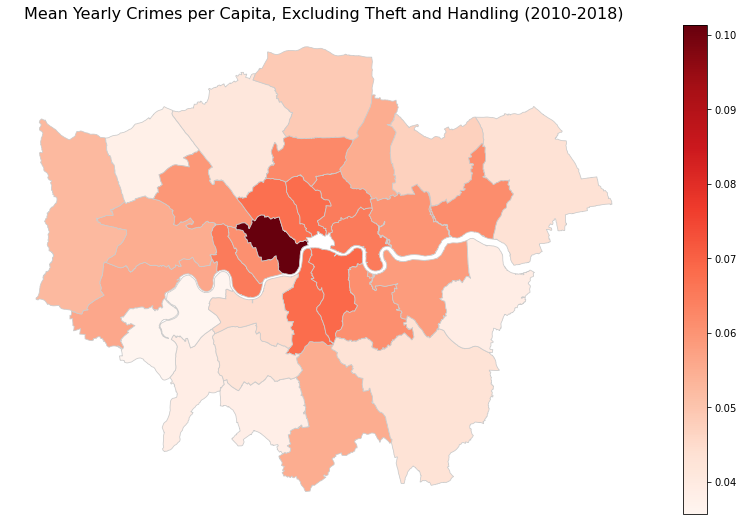

In [228]:
plot_borough_heatmap('no_theft_mean_crime_pc', 'Mean Yearly Crimes per Capita, Excluding Theft and Handling (2010-2018)', 'no_theft_crimes_pc_map_10_18')

This heatmap demonstrates that the annual number of crimes per capita (excluding 'Theft and Handling') are higher for Inner London boroughs than Outer London boroughs, despite the tendency for Inner London boroughs to have a much higher proportion of crimes classed as 'Theft and Handling'. This further reinforces Inner London as the main area of concern for crimes in the city. 

From our 4 crime heatmaps, there are also a few Outer London boroughs that could also be identified as areas of concern. Barking & Daegnham, Ealing, Haringey and Croydon all show high values, comparatively to the whole city or only the Outer London boroughs, for our 4 different measurements of crime levels.

### 4.2.2: Independent Variable Heatmaps

#### Percentage of Employees Earning Below London Living Wage

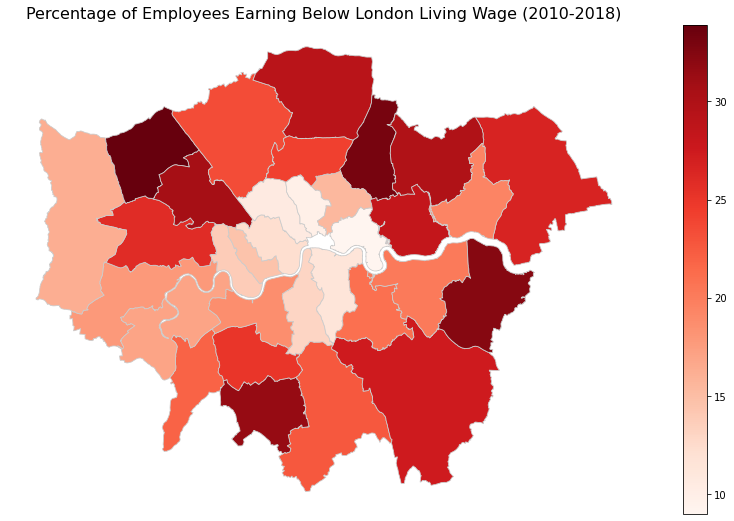

In [229]:
plot_borough_heatmap('earning_below_llw_%', 'Percentage of Employees Earning Below London Living Wage (2010-2018)', 'earning_below_llw_map_10_18')

We can see that the percentage of employees earning below LLW is much higher for the Outer London boroughs, where the cost of living is lower and, thus, people with lower-paying jobs can afford to live there. The Inner London borough, Newham, displays by far the highest percentage of any of the Inner London boroughs. This is likely due to the larger amount of social housing made available in Newham in comparison to other Inner London boroughs.

#### Percentage of Households Without Work

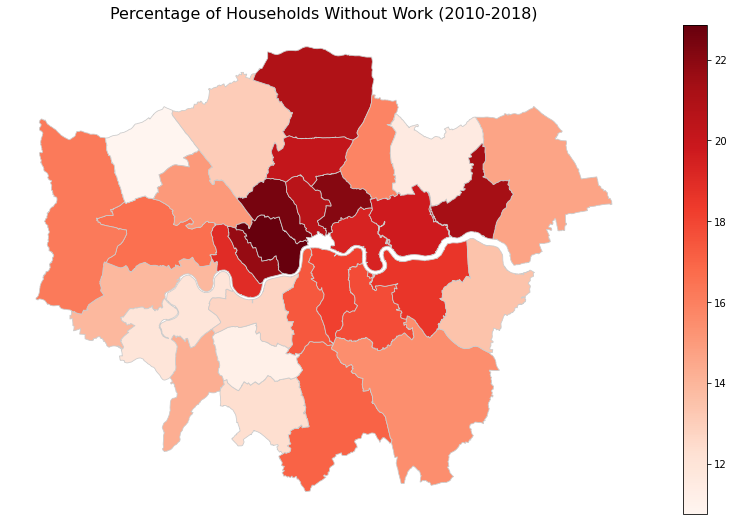

In [230]:
plot_borough_heatmap('workless_households_%', 'Percentage of Households Without Work (2010-2018)', 'workless_households_map_10_18')

Interestingly, the boroughs with the highest percentage of households that are workless are generally situated in Inner London. A possible reason for this could be wealthy homeowners that live in central London and don't work, as we see the highest percentages in areas such as Westminster and Camden, which are expensive areas to live in.

#### Percentage of People Sleeping Rough

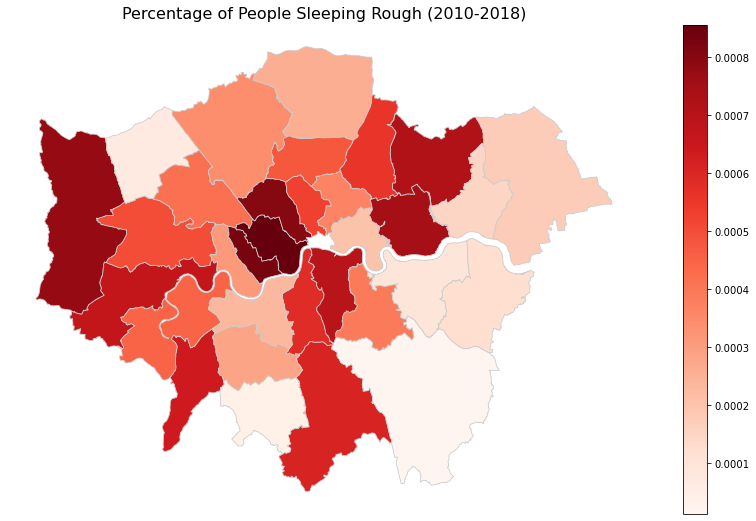

In [231]:
plot_borough_heatmap('homeless_%', 'Percentage of People Sleeping Rough (2010-2018)', 'homelessness_map_10_18')

The boroughs of Kensington & Chelsea, Westminster and Camden all show the highest percentage of population that are homeless within the city. The larger number of people visiting these boroughs, for leisurely purposes, each day provides ample opportunity for beggars to ask passers-by for help. Outside of Inner London, we see high percentages of people that are homeless in boroughs such as Redbridge, Hillingdon, Hounslow, Kingston and Croydon.

#### Affordable Housing Made Available per Capita

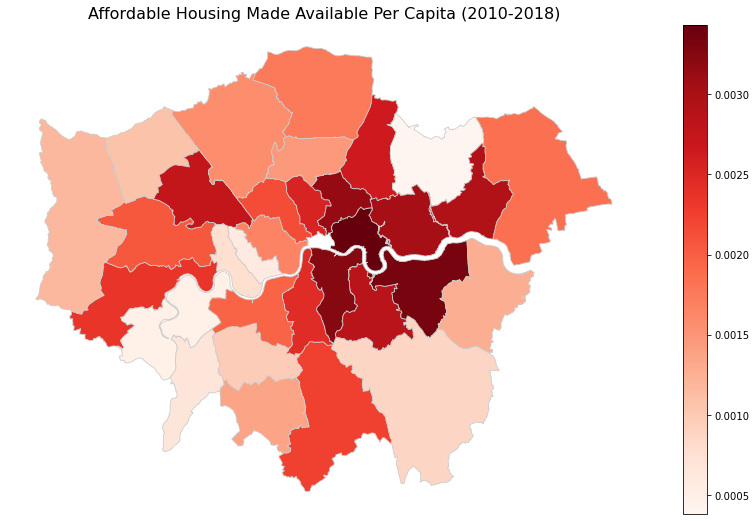

In [232]:
plot_borough_heatmap('affordable_housing_pc', 'Affordable Housing Made Available Per Capita (2010-2018)', 'affordable_housing_map_10_18')

Afforable housing made available per capita is significantly higher in Central East London boroughs, such as Southwark, Tower Hamlets, Hackney and Greenwich. This is most likely due to the larger majority of council housing being built in the years 1919-1980, when East London was less built-up than West London, and the land was cheaper due to the price divide between the two sides of the city. This is reflected by the low measurements in Central West London boroughs, such as Kensington & Chelsea and Greenwich, both of which have a significantly high percentage of their population sleeping rough.

#### Percentage of People with Qualification Level NVQ1 or Lower

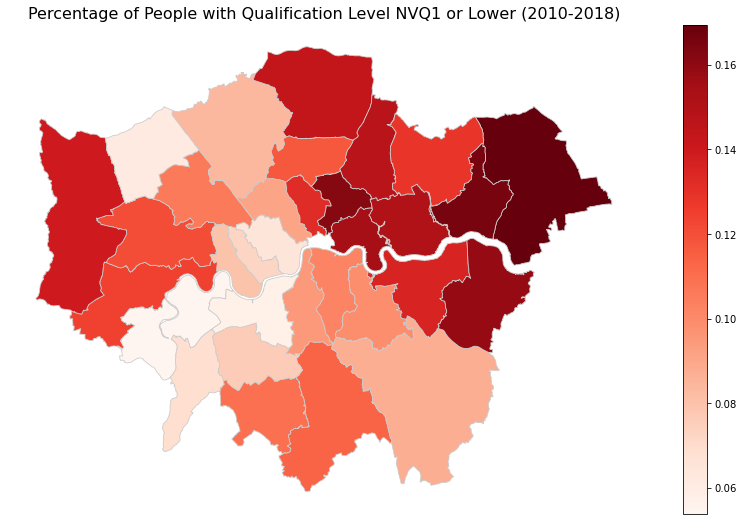

In [233]:
plot_borough_heatmap('NVQ1_or_less_%', 'Percentage of People with Qualification Level NVQ1 or Lower (2010-2018)', 'education_map_10_18')

In this heatmap, we can see similarities to the heatmap for the percentage of employees earning below LLW. The two are most likely related due to the increasing necessity of further education in order to obtain high-paying jobs. Outer London boroughs have higher percentages of people with NVQ1 qualification level or less. We see higher percentages in East London, likely due to the members of older working-class generations that had less provisions in terms of education, and still live in the area. Boroughs with particularly high percentages are Barking & Dagenham, Havering, Hackney and Bexley.

#### Population Density

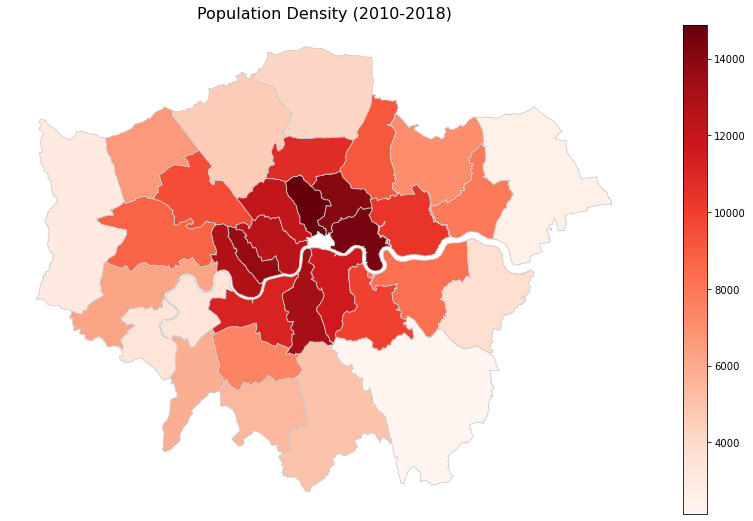

In [234]:
plot_borough_heatmap('population_density', 'Population Density (2010-2018)', 'population_density_map_10_18')

Population density in the city is as we would have expected, with much higher density within Inner London boroughs. We see particularly high values for the boroughs Islington, Hackney and Tower Hamlets, which suggests that these areas contain a lot of large blocks of flats and shared housing.

### 4.2.3: K-Means Clusters Maps

Below we will define a function for plotting and saving a map of London boroughs, which are coloured based on one of the k-means clusters columns, referenced by culster_col_name, in the borough_map_df DataFrame. The other two arguments are graph_name and file_name, both of which are strings.

In [235]:
def plot_borough_map(culster_col_name, graph_name, file_name):
    fig, ax = plt.subplots(1, figsize=(15, 9))
    # Plotting variable values for map
    borough_map_df.plot(column=culster_col_name, cmap='Set2', linewidth=0.8, ax=ax, edgecolor='0.8')
    ax.axis('off')
    ax.set_title('{}'.format(graph_name), fontdict={'fontsize': '16', 'fontweight' : '3'})
    # Saving file
    fig.savefig('figures/borough_maps/{}.png'.format(file_name), dpi=300)

#### Clusters Based on Independent Variables

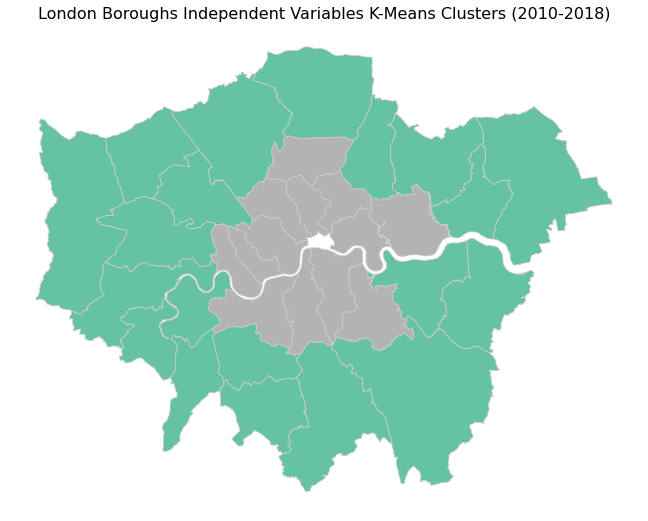

In [236]:
plot_borough_map('X_clusters', 'London Boroughs Independent Variables K-Means Clusters (2010-2018)', 'X_cluster_map_10_18')

We can see that the clustering based on independent variables has clustered all of the Inner London boroughs together, as well as the Outer London borough, Haringey. These boroughs are considered to have similar characteristics, based on the independent variables selected for this project.

#### Clusters Based on Crimes per Capita (Excluding Westminster)

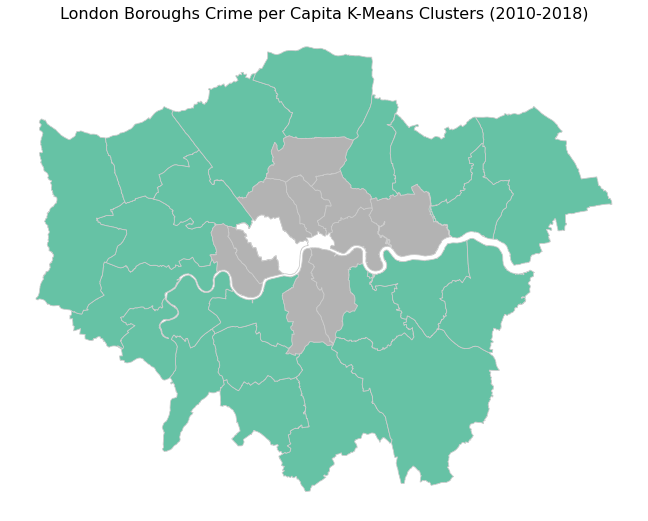

In [237]:
plot_borough_map('crime_pc_clusters', 'London Boroughs Crime per Capita K-Means Clusters (2010-2018)', 'crime_cluster_map_10_18')

The clustering based on crime per capita (excluding Westminster) has clustered all of the Inner London boroughs, except Wandsworth and Lewisham, together. Similarly to the last set of clusters, the Outer London borough, Haringey, has been included in the cluster with the Inner London boroughs. These boroughs are considered to have similarly high annual crimes per capita, suggesting that these are the particular boroughs of high concern.

#### Clusters Based on Crime Category Proportions

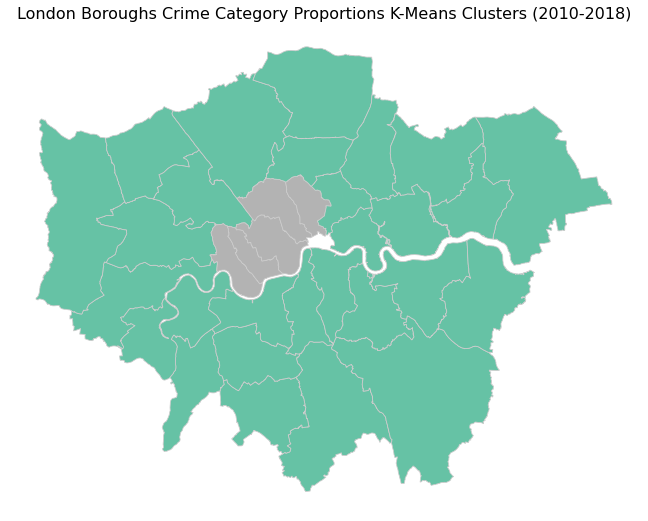

In [238]:
plot_borough_map('crime_category_clusters', 'London Boroughs Crime Category Proportions K-Means Clusters (2010-2018)', 'crime_category_cluster_map_10_18')

The clustering based on crime category proportions, has clustered the Inner London boroughs of Hammersmith & Fulham, Kensington & Chelsea, Westminster, Camden and Islington. These boroughs are considered to have similar proportions within the different crime categories. Three of these particular boroughs were mentioned during the analysis of the pie charts, due to the proportion of 'Theft and Handling' crimes being over 50% for those boroughs. This, paired with our other findings, implies that the high levels of crime in these boroughs (displayed in other heatmaps) is largely due to the large number of tourists travelling to these areas each day.

# 5: Henze-Zirkler Multivariate Normality Test

We would like to fit linear regression models to the datasets we have collected, however we must first test for the prerequisites such as multivariate normality and low levels of multicollinearity.

In [239]:
from pingouin import multivariate_normality

In [240]:
# Collecting predictor values for all boroughs for the years 2010-2018
all_yearly_independent_variables_df = all_yearly_values_df[['earning_below_llw_%', 'workless_households_%', 'homeless_%', 'affordable_housing_pc', 'NVQ1_or_less_%']]

This test involves defining a null hypothesis, which is that the data isn't distributed in a multivariate normal manner. We then set an alpha (5% in this case) and run a p-value test to see if we have sufficient evidence to reject the null hypothesis. 

In [241]:
# Performing Henze-Zirkler Multivariate Normality Test on our predictors.
multivariate_normality(all_yearly_independent_variables_df, alpha=0.05)

HZResults(hz=3.8412661181786527, pval=1.180286020295937e-102, normal=False)

We received a very high p-value, so we have insufficient evidence to reject the null hypothesis. Therefore, the variables don't meet the prerequisites for linear regression.

# 6: Random Forest Regression Hyperparameter Tuning

We will now start the process of building a random forest. We have picked this particular algorithm due to it's flexibility, non-linear nature and lack of assumptions about variable distributions. The first step of this algorithm is tuning  the hyperparameters.

In [242]:
from sklearn.model_selection import train_test_split

In [243]:
# Listing column names of independent variables for the random forest models.
independent_variable_names = ['earning_below_llw_%','workless_households_%', 'homeless_%', 'affordable_housing_pc', 'NVQ1_or_less_%', 'population_density', 'police_pc']

In [244]:
# Defining function for doing a train test split for a named target variable from a DataFrame containing independent and 
# dependent variables. The test proportion variable determines the percentage of the data to be included in the test set.
def split_df(df, target_variable, test_proportion):
    # Assigning independent variables.
    X = df[independent_variable_names]
    # Assigning target variable.
    Y = df[target_variable]
    # Splitting into train and test sets.
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=test_proportion, random_state=0)
    return X_train, X_test, Y_train, Y_test

In [245]:
from random import sample 
from numpy import linspace

The dictionary defined below has keys named after the random forest hyperparameters to be tuned, with the values consisting of different lists of values to be tested in order to find the optimal hyperparameters for this dataset. The hyperparamters to be tuned are the maximum tree depth, the maximum number of features to consider at each split, the minimum number of samples to consider at each split, the minimum number of samples that can be contained in each leaf, and the number of decision trees to build.

In [246]:
random_grid = {'max_depth': [int(depth) for depth in linspace(5, 50, num = 20)], # 20 numbers between 5 and 50
               'max_features': ['auto', 'sqrt'],
               'min_samples_split': [int(ms_split) for ms_split in linspace(2, 20, num = 10)], # 10 numbers between 2 and 20
               'min_samples_leaf': [2, 4, 6, 8, 10], # 4 different options for minimum number of samples per leaf
               'n_estimators': sample(range(4, 300), 74), # Random sample of 74 integers between 4 and 300.
              }

In [247]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV

Below we will try 500 different combinations of our hyperparameter value options. The model will then test the accuracy of each combination, using cross-validation, and return the best-performing hyperparameter values that it could find from the tested combinations.

In [248]:
# Defining random forest object
rf_hyp_tuning = RandomForestRegressor(random_state=0)
# Defining randomised search object for searching through combinations of hyperparameters.
rf_hyp_tuned = RandomizedSearchCV(estimator = rf_hyp_tuning, param_distributions = random_grid, n_iter = 500, random_state=0)

In [249]:
# Acquiring train and test sets for hyperparameter tuning.
X_train, X_test, Y_train, Y_test = split_df(all_yearly_values_df, 'crime_num', 0.3)

In [250]:
# Fitting randomised search object on training sets. This will test different combinations of the hyperparameters.
rf_hyp_tuned.fit(X_train, Y_train)

RandomizedSearchCV(estimator=RandomForestRegressor(random_state=0), n_iter=500,
                   param_distributions={'max_depth': [5, 7, 9, 12, 14, 16, 19,
                                                      21, 23, 26, 28, 31, 33,
                                                      35, 38, 40, 42, 45, 47,
                                                      50],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [2, 4, 6, 8, 10],
                                        'min_samples_split': [2, 4, 6, 8, 10,
                                                              12, 14, 16, 18,
                                                              20],
                                        'n_estimators': [52, 290, 247, 37, 260,
                                                         110, 244, 172, 47, 259,
                                                         49, 127, 214, 164, 84,
          

In [251]:
# Use the best_params_ method to acquire the best-performing hyperparameters out of the tested combinations.
tuned_hyp_dict = rf_hyp_tuned.best_params_
print(tuned_hyp_dict)

{'n_estimators': 115, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 21}


# 7: Random Forest Regression Models

In [252]:
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error

We will now define a function that takes a specified DataFrame, target variable and test set size, runs a train/test split on them, and then trains and tests a random forest regressor on the respective DataFrames. The function then prints the Mean Absolute Error (MAE), Mean Absolute Percentage Error (MAPE) and the Mean Squared Error (MSE). The main metric used to compare the models' performances is MAPE, as it allows for comparison of models for predicting values on different scales, in this case crime number and crimes per capita.

The permuted predictor importance estimates for the attributes in each model should provide an understanding of the extent to which the different attributes affect crime levels in the area covered by the model. Although it won't tell us whether the relationship between the attribute and target variable is positive or negative, it will tell us the extent to which the attribute can be used to predict crime level. This can be paired with our heatmaps in order to determine if there is a relationship between the attribute and the target variable and, if there is a relationship, whether it is positive or negative.

In [253]:
def train_test_rf_model(df, target_variable, test_proportion):
    # Acquire train and test sets
    X_train, X_test, Y_train, Y_test = split_df(df, target_variable, test_proportion)
    # Define random forest object with tuned hyperparameters obtained in the last section.
    rf = RandomForestRegressor(n_estimators=tuned_hyp_dict['n_estimators'], max_depth=tuned_hyp_dict['max_depth'], min_samples_split=tuned_hyp_dict['min_samples_split'], min_samples_leaf=tuned_hyp_dict['min_samples_leaf'], max_features=tuned_hyp_dict['max_features'], random_state=0)
    # Training model on training sets.
    rf_model = rf.fit(X_train, Y_train)
    # Obtaining predictions for target variable using the independent variables test set.
    Y_pred = rf_model.predict(X_test)
    # Acquire list of predictor importances for model
    predictor_importance = permutation_importance(rf_model, X_test, Y_test, n_repeats=50, random_state=0)
    # Calculating performance metrics
    rf_model_MAE = mean_absolute_error(Y_test, Y_pred)
    rf_model_MAPE = mean_absolute_percentage_error(Y_test, Y_pred)
    rf_model_MSE = mean_squared_error(Y_test, Y_pred)
    # Printing performance metrics
    print('Mean Absolute Error: {} \nMean Absolute Percentage Error: {} \nMean Squared Error: {}'.format(rf_model_MAE, rf_model_MAPE, rf_model_MSE))
    # Acquiring list of attribute importance means and standard deviations for each attribute.
    importance_mean = predictor_importance['importances_mean']
    importance_std = predictor_importance['importances_std']
    # Creating DataFrame to display predictor importance values.
    predictor_importance_df = pd.DataFrame(index=independent_variable_names)
    predictor_importance_df['importance_mean'] = importance_mean
    predictor_importance_df['importance_std'] = importance_std
    predictor_importance_df = predictor_importance_df.T
    return predictor_importance_df

Below we define a function that plots a bar graph of the mean predictor importance estimates for each feature.

In [254]:
def plot_pred_importance_bar(pred_importance_df, cluster_label, crime_measure, cluster_graph_title, file_name):
    fig, ax = plt.subplots(1, figsize=(18, 9))
    ax.bar(pred_importance_df.columns,pred_importance_df.loc['importance_mean'])
    if crime_measure == 'num':
        ax.set_title('Crime Number Random Forest Regression \nPermuted Predictor Importance: \nBoroughs: {}'.format(cluster_graph_title), fontdict={'fontsize': '16', 'fontweight' : '3'})
    if crime_measure == 'pc':
        ax.set_title('Crime per Capita Random Forest Regression \nPermuted Predictor Importance: \nBoroughs: {}'.format(cluster_graph_title), fontdict={'fontsize': '16', 'fontweight' : '3'})
    plt.show()
    fig.savefig('figures/rf_permuted_predictor_importance/{}/cluster_{}_crime_{}_predictor_importance_bar.svg'.format(file_name, cluster_label, crime_measure), bbox_inches='tight', dpi=300)

## 7.1: All Yearly Data for All Boroughs

We will now run random forest algorithms on the yearly data concatenated over all boroughs.

### 7.1.1: Crime Totals

In [255]:
crime_num_pred_importance = train_test_rf_model(all_yearly_values_df, 'crime_num', 0.3)
crime_num_pred_importance.head()

Mean Absolute Error: 3996.35054485023 
Mean Absolute Percentage Error: 0.18397408901932188 
Mean Squared Error: 31761950.238602094


,earning_below_llw_%,workless_households_%,homeless_%,affordable_housing_pc,NVQ1_or_less_%,population_density,police_pc
importance_mean,0.047344,0.044473,0.580088,0.003982,0.034780,0.400269,0.012526
importance_std,0.013524,0.013707,0.072422,0.005527,0.013686,0.079610,0.007063


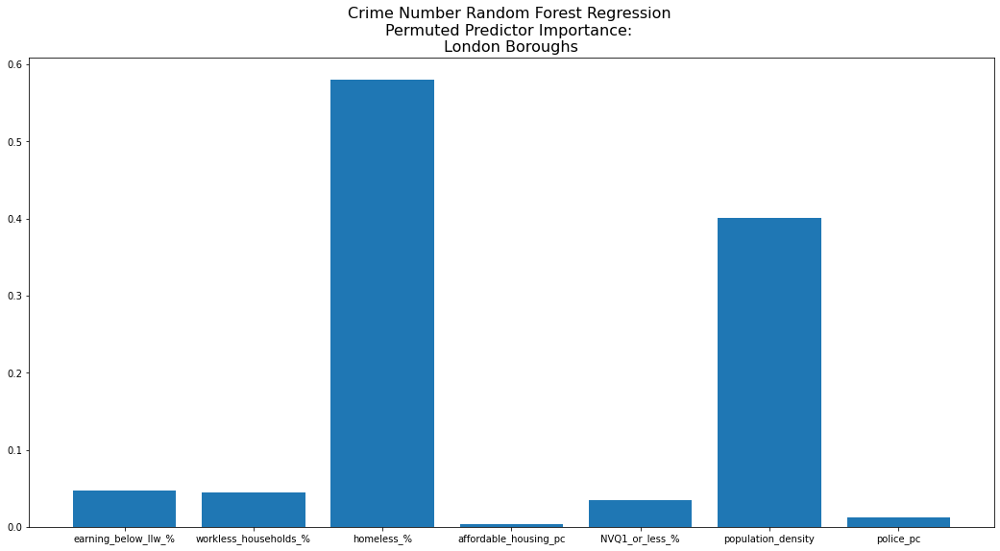

In [256]:
fig, ax = plt.subplots(1, figsize=(18, 9))
ax.bar(crime_num_pred_importance.columns,crime_num_pred_importance.loc['importance_mean'])
ax.set_title('Crime Number Random Forest Regression \nPermuted Predictor Importance: \nLondon Boroughs', fontdict={'fontsize': '16', 'fontweight' : '3'})
plt.show()
fig.savefig('figures/rf_permuted_predictor_importance/all_london_boroughs/crime_num_predictor_importance_bar.svg', bbox_inches='tight', dpi=300)

### 7.1.2: Crime per Capita

In [257]:
crime_pc_pred_importance = train_test_rf_model(all_yearly_values_df, 'crime_pc', 0.3)
crime_pc_pred_importance.head()

Mean Absolute Error: 0.009551397698033894 
Mean Absolute Percentage Error: 0.08693353529629129 
Mean Squared Error: 0.0003711514620632741


,earning_below_llw_%,workless_households_%,homeless_%,affordable_housing_pc,NVQ1_or_less_%,population_density,police_pc
importance_mean,0.013762,0.023238,0.457700,-0.000016,0.012916,0.595419,0.007312
importance_std,0.002789,0.005755,0.064038,0.000959,0.004459,0.107687,0.002337


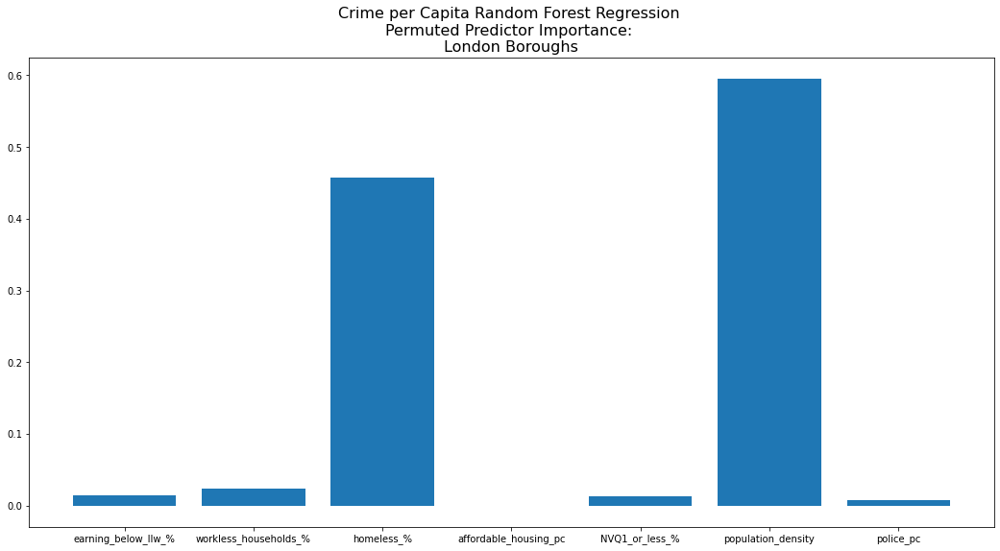

In [258]:
fig, ax = plt.subplots(1, figsize=(18, 9))
ax.bar(crime_pc_pred_importance.columns,crime_pc_pred_importance.loc['importance_mean'])
ax.set_title('Crime per Capita Random Forest Regression \nPermuted Predictor Importance: \nLondon Boroughs', fontdict={'fontsize': '16', 'fontweight' : '3'})
plt.show()
fig.savefig('figures/rf_permuted_predictor_importance/all_london_boroughs/crime_pc_predictor_importance_bar.svg', bbox_inches='tight', dpi=300)

We can see that, for boroughs across the city, by far the most important attribute for predicting the number of crimes is the percentage of the population that is homeless, with the second most important being population density. The next three highest importance levels of predictors is for the  percentage of workless households, the percentage of employees earning below minimum wage, and the percentage of the population with qualification level NVQ1 or less. 

The results are very similar for the model predicting crimes per capita, except the importance of population density has now overtaken the importance of the percentage of population that are homeless.
We can see that the number of Metropolitan Police per capita has the second lowest of our importance estimates, suggesting police numbers are not key in changing crime rates.

## 7.2: Clusters Based on Independent Variables

### 7.2.1: Cluster 0

In [259]:
print('The boroughs in this cluster are:')
print(X_cluster_0_boroughs)

The boroughs in this cluster are:
['Barking and Dagenham' 'Barnet' 'Bexley' 'Brent' 'Bromley' 'Croydon'
 'Ealing' 'Enfield' 'Greenwich' 'Harrow' 'Havering' 'Hillingdon'
 'Hounslow' 'Kingston upon Thames' 'Merton' 'Redbridge'
 'Richmond upon Thames' 'Sutton' 'Waltham Forest']


In [260]:
# Number of crimes
X_cluster_0_crime_num_pred_importance = train_test_rf_model(X_cluster_0_df, 'crime_num', 0.3)
X_cluster_0_crime_num_pred_importance.head()

Mean Absolute Error: 4015.952557249514 
Mean Absolute Percentage Error: 0.23351736670073728 
Mean Squared Error: 26634627.925449546


,earning_below_llw_%,workless_households_%,homeless_%,affordable_housing_pc,NVQ1_or_less_%,population_density,police_pc
importance_mean,0.000520,0.111146,0.283742,-0.000491,0.176780,0.276495,0.037060
importance_std,0.014071,0.049681,0.126270,0.034308,0.097705,0.071483,0.018484


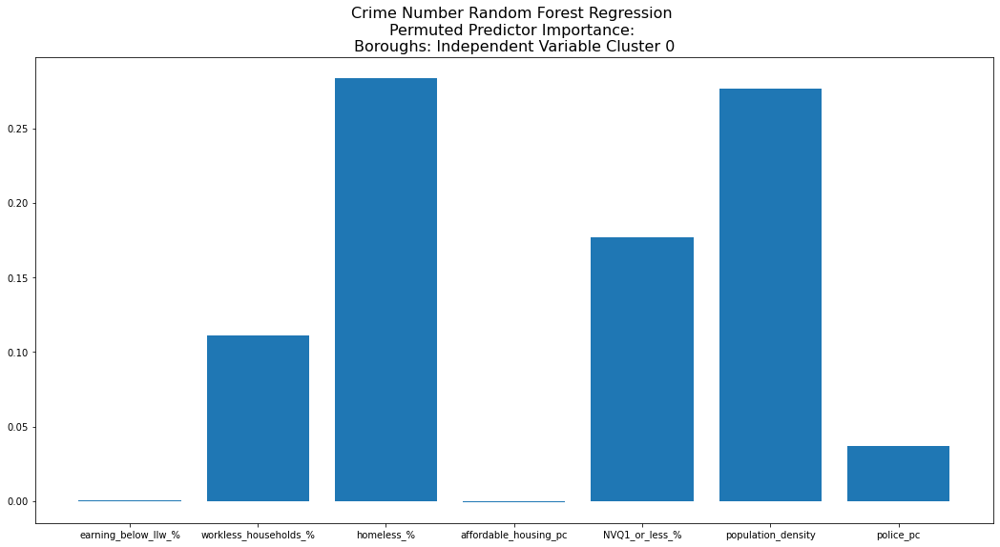

In [261]:
plot_pred_importance_bar(X_cluster_0_crime_num_pred_importance, 0, 'num', 'Independent Variable Cluster 0', 'X_clusters')

For boroughs in independent variable cluster 0, by far the most important attribute for predicting the number of crimes is the percentage of population that are homeless.

In [262]:
# Crimes per capita
X_cluster_0_crime_pc_pred_importance = train_test_rf_model(X_cluster_0_df, 'crime_pc', 0.3)
X_cluster_0_crime_pc_pred_importance.head()

Mean Absolute Error: 0.005516112735065303 
Mean Absolute Percentage Error: 0.07579293223464527 
Mean Squared Error: 5.342490427945234e-05


,earning_below_llw_%,workless_households_%,homeless_%,affordable_housing_pc,NVQ1_or_less_%,population_density,police_pc
importance_mean,0.046323,0.061402,0.193234,0.030814,0.156703,0.652281,0.06074
importance_std,0.032208,0.024364,0.070648,0.015073,0.047519,0.138175,0.01858


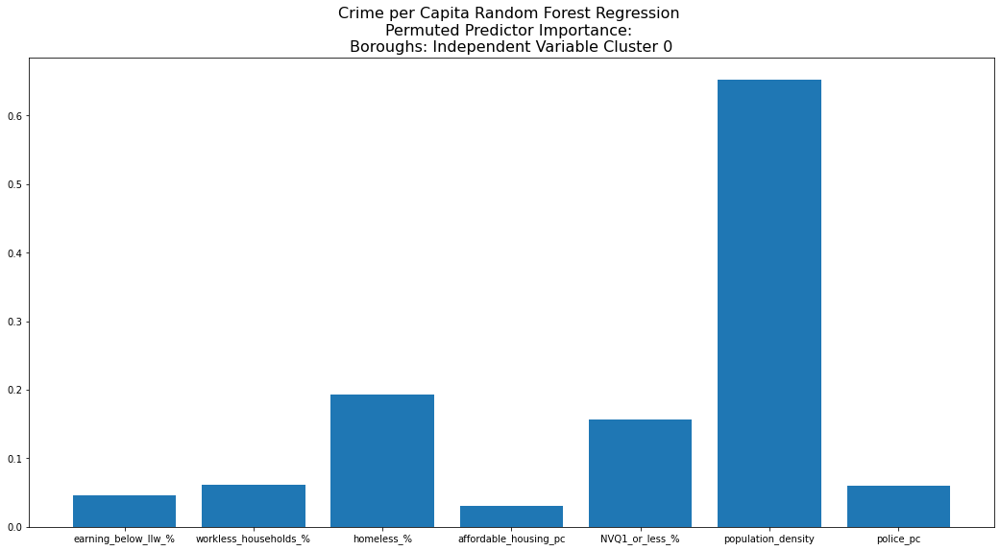

In [263]:
plot_pred_importance_bar(X_cluster_0_crime_pc_pred_importance, 0, 'pc', 'Independent Variable Cluster 0', 'X_clusters')

In this bar graph, we can see that, for boroughs in independent variable cluster 0, by far the most important attribute for predicting the crimes per capita, is the percentage of the population that is homeless. The next three highest importance levels of predictors is for the population density, the percentage of workless households, and the percentage of the population with qualification level NVQ1 or less.

### 7.2.2: Cluster 1

In [264]:
print('The boroughs in this cluster are:') 
print(X_cluster_1_boroughs)

The boroughs in this cluster are:
['Camden' 'Hackney' 'Hammersmith and Fulham' 'Haringey' 'Islington'
 'Kensington and Chelsea' 'Lambeth' 'Lewisham' 'Newham' 'Southwark'
 'Tower Hamlets' 'Wandsworth' 'Westminster']


In [265]:
X_cluster_1_crime_num_pred_importance = train_test_rf_model(X_cluster_1_df, 'crime_num', 0.3)
X_cluster_1_crime_num_pred_importance.head()

Mean Absolute Error: 4475.080613589309 
Mean Absolute Percentage Error: 0.13811154668400671 
Mean Squared Error: 36250512.48458335


,earning_below_llw_%,workless_households_%,homeless_%,affordable_housing_pc,NVQ1_or_less_%,population_density,police_pc
importance_mean,0.021223,0.016582,1.158384,0.006562,0.005039,0.016037,0.018558
importance_std,0.021810,0.007778,0.221826,0.012226,0.008190,0.006569,0.006866


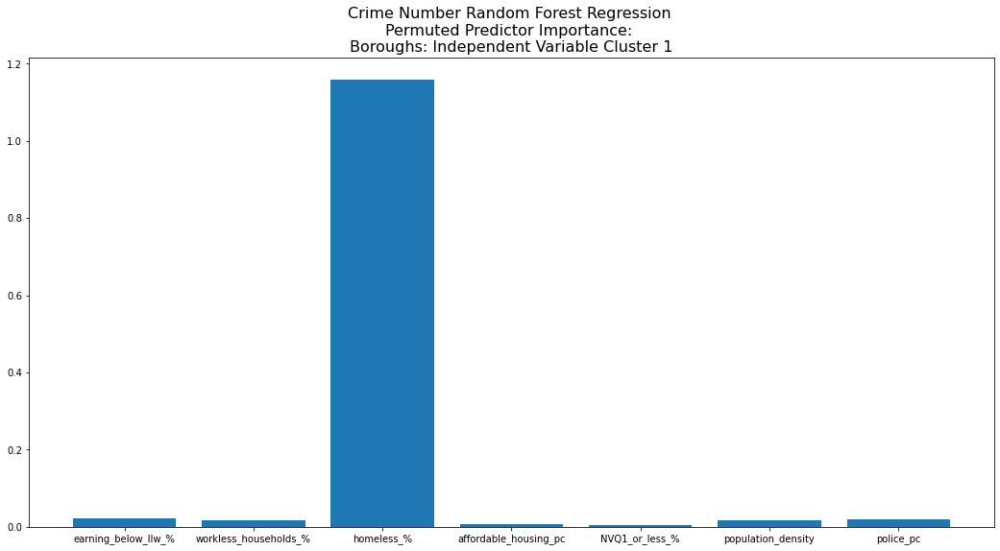

In [266]:
plot_pred_importance_bar(X_cluster_1_crime_num_pred_importance, 1, 'num', 'Independent Variable Cluster 1', 'X_clusters')

In this bar graph, we can see that, for boroughs in independent variable cluster 1, the most important attributes for predicting the number of crimes, is the percentage of the population that is homeless and the polulation density. The importance levels of the percentage of workless households, and the percentage of the population with qualification level NVQ1 or less, as well as police per capita, have increased for this cluster. This suggests that the higher levels of distinction between independent variables for Outer London boroughs, as demonstrated by the heatmaps, provides more importance to predictors that allow us to distinguish between areas of less similar characteristics, with different levels of crime.

In [267]:
X_cluster_1_crime_pc_pred_importance = train_test_rf_model(X_cluster_1_df, 'crime_pc', 0.3)
X_cluster_1_crime_pc_pred_importance.head()

Mean Absolute Error: 0.01370292211396216 
Mean Absolute Percentage Error: 0.09512740333460368 
Mean Squared Error: 0.000547634605793152


,earning_below_llw_%,workless_households_%,homeless_%,affordable_housing_pc,NVQ1_or_less_%,population_density,police_pc
importance_mean,-0.000230,0.039099,1.084300,0.004447,0.022802,0.105668,0.005979
importance_std,0.002509,0.010690,0.200009,0.001930,0.006549,0.029934,0.003277


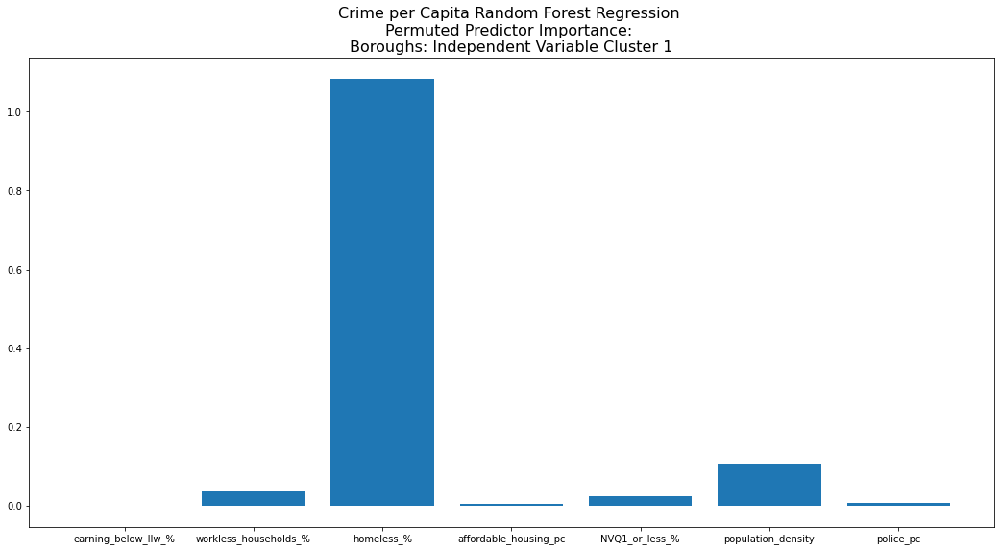

In [268]:
plot_pred_importance_bar(X_cluster_1_crime_pc_pred_importance, 1, 'pc', 'Independent Variable Cluster 1', 'X_clusters')

For independent variables cluster 1, the most important attributes for predicting crimes per capita, is the polulation density. The importance levels of the percentage of workless households, and the percentage of the population with qualification level NVQ1 or less, as well as police per capita, have decreased in comparison to the importance estimators for the corresponding total crime random forest.

## 7.3: Clusters Based on Crimes per Capita (Excluding Westminster)

### 7.3.1: Cluster 0

In [269]:
print('The boroughs in this cluster are:')
print(crime_pc_cluster_0_boroughs)

The boroughs in this cluster are:
['Barking and Dagenham' 'Barnet' 'Bexley' 'Brent' 'Bromley' 'Croydon'
 'Ealing' 'Enfield' 'Greenwich' 'Harrow' 'Havering' 'Hillingdon'
 'Hounslow' 'Kingston upon Thames' 'Lewisham' 'Merton' 'Redbridge'
 'Richmond upon Thames' 'Sutton' 'Waltham Forest' 'Wandsworth']


In [270]:
crime_cluster_0_crime_num_pred_importance = train_test_rf_model(crime_pc_cluster_0_df, 'crime_num', 0.3)
crime_cluster_0_crime_num_pred_importance.head()

Mean Absolute Error: 3430.130893901421 
Mean Absolute Percentage Error: 0.20158860128475983 
Mean Squared Error: 18055854.830266632


,earning_below_llw_%,workless_households_%,homeless_%,affordable_housing_pc,NVQ1_or_less_%,population_density,police_pc
importance_mean,0.001311,0.123388,0.154802,0.036996,0.211714,0.633743,0.029602
importance_std,0.008853,0.045770,0.077078,0.021233,0.066377,0.113404,0.023326


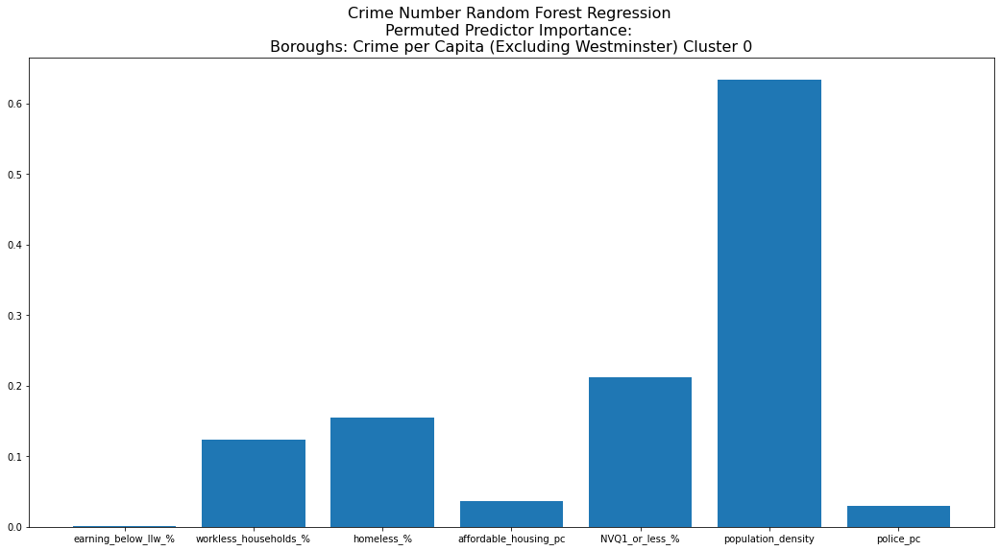

In [271]:
plot_pred_importance_bar(crime_cluster_0_crime_num_pred_importance, 0, 'num', 'Crime per Capita (Excluding Westminster) Cluster 0', 'crime_pc_clusters')

In [272]:
crime_cluster_0_crime_pc_pred_importance = train_test_rf_model(crime_pc_cluster_0_df, 'crime_pc', 0.3)
crime_cluster_0_crime_pc_pred_importance.head()

Mean Absolute Error: 0.006085119146068363 
Mean Absolute Percentage Error: 0.08521372718448754 
Mean Squared Error: 6.763538204973823e-05


,earning_below_llw_%,workless_households_%,homeless_%,affordable_housing_pc,NVQ1_or_less_%,population_density,police_pc
importance_mean,0.051211,0.066058,0.166529,0.028540,0.128591,0.657060,0.080724
importance_std,0.023991,0.025876,0.076410,0.018265,0.040176,0.136659,0.026114


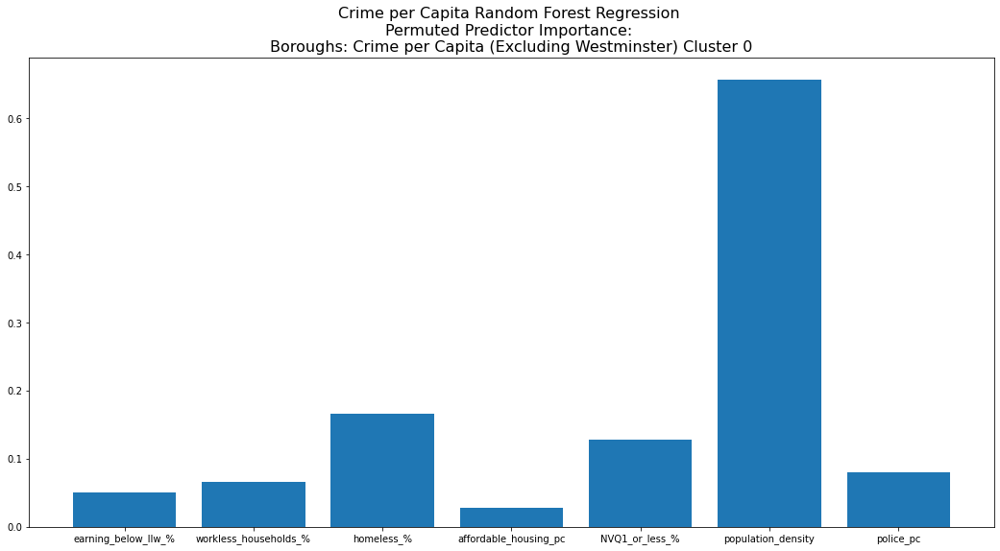

In [273]:
plot_pred_importance_bar(crime_cluster_0_crime_pc_pred_importance, 0, 'pc', 'Crime per Capita (Excluding Westminster) Cluster 0', 'crime_pc_clusters')

We see similar importance predictions in both of the bar graphs for this cluster, with population density dominating predictive power in both models. The percentage of the population that are homeless, and the percentage with NVQ1 qualification level, or lower, are the predictors with the next two highest levels of importance.

### Cluster 1

In [274]:
print('The boroughs in this cluster are:')
print(crime_pc_cluster_1_boroughs)

The boroughs in this cluster are:
['Camden' 'Hackney' 'Hammersmith and Fulham' 'Haringey' 'Islington'
 'Kensington and Chelsea' 'Lambeth' 'Newham' 'Southwark' 'Tower Hamlets']


In [275]:
crime_cluster_1_crime_num_pred_importance = train_test_rf_model(crime_pc_cluster_1_df, 'crime_num', 0.3)
crime_cluster_1_crime_num_pred_importance.head()

Mean Absolute Error: 4422.59425312476 
Mean Absolute Percentage Error: 0.16670892715833002 
Mean Squared Error: 28490908.43533106


,earning_below_llw_%,workless_households_%,homeless_%,affordable_housing_pc,NVQ1_or_less_%,population_density,police_pc
importance_mean,0.055530,-0.114757,0.043476,0.178764,0.041659,0.112008,0.038720
importance_std,0.045701,0.122281,0.058516,0.094437,0.028215,0.049225,0.017424


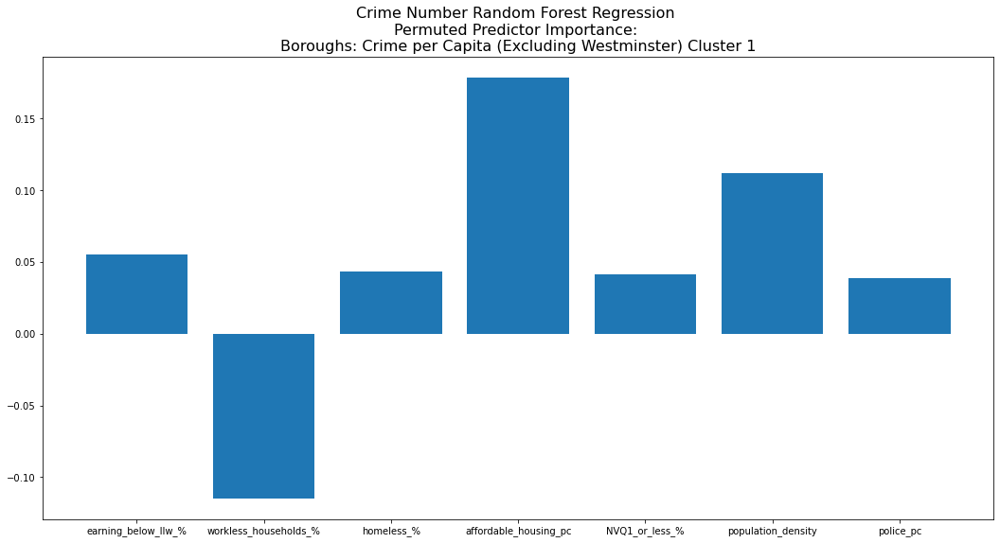

In [276]:
plot_pred_importance_bar(crime_cluster_1_crime_num_pred_importance, 1, 'num', 'Crime per Capita (Excluding Westminster) Cluster 1', 'crime_pc_clusters')

There is a negative predictor importance estimate for the percentage of households that are workless, which suggests that this measure is not very useful when trying to predict crime rates within this cluster of boroughs. This is the first bar chart where the most important predictors weren't the homeless or population density predictors. The most important predictor in this case is the amount of affordable housing made available per capita, with population density and percentage of employees earning below LLW coming next. Interestingly, the importance of the percentage of the population that are homeless has massively decreased in predictor importance, suggesting that when Westminster is not

In [277]:
crime_cluster_1_crime_pc_pred_importance = train_test_rf_model(crime_pc_cluster_1_df, 'crime_pc', 0.3)
crime_cluster_1_crime_pc_pred_importance.head()

Mean Absolute Error: 0.008660294348191233 
Mean Absolute Percentage Error: 0.07250101732458852 
Mean Squared Error: 0.00013213586855053802


,earning_below_llw_%,workless_households_%,homeless_%,affordable_housing_pc,NVQ1_or_less_%,population_density,police_pc
importance_mean,0.028672,0.173641,0.023832,0.045303,0.062036,0.340709,-0.015491
importance_std,0.024881,0.068164,0.009741,0.040990,0.046294,0.131658,0.032673


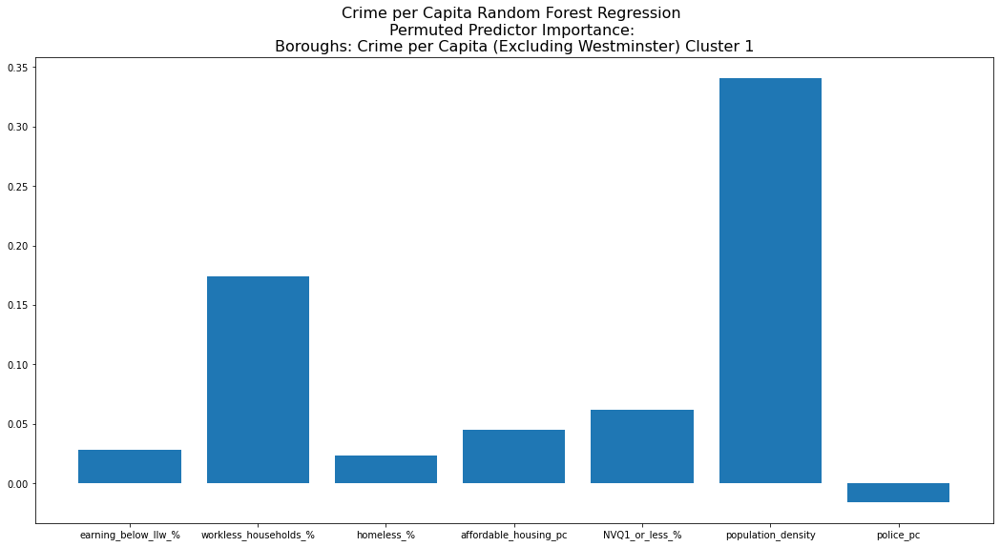

In [278]:
plot_pred_importance_bar(crime_cluster_1_crime_pc_pred_importance, 1, 'pc', 'Crime per Capita (Excluding Westminster) Cluster 1', 'crime_pc_clusters')

There is a negative predictor importance estimate for the number of Metropolitan Police per capita, which implies that this measure is not very useful when trying to predict crime rates within this cluster of boroughs. The most important predictor in this case is population density, followed by the percentage of households that are workless and then the percentage of the population with NVQ1 qualification level, or lower. Interestingly, the importance of the percentage of the population that are homeless has massively decreased in predictor importance, suggesting that models excluding Westminster rely less on this measure to predict crime numbers.

## 7.4: Clusters Based on Crime Category Proportions

### Cluster 0

In [279]:
print('The boroughs in this cluster are:')  
print(crime_category_cluster_0_boroughs)

The boroughs in this cluster are:
['Barking and Dagenham' 'Barnet' 'Bexley' 'Brent' 'Bromley' 'Croydon'
 'Ealing' 'Enfield' 'Greenwich' 'Hackney' 'Haringey' 'Harrow' 'Havering'
 'Hillingdon' 'Hounslow' 'Kingston upon Thames' 'Lambeth' 'Lewisham'
 'Merton' 'Newham' 'Redbridge' 'Richmond upon Thames' 'Southwark' 'Sutton'
 'Tower Hamlets' 'Waltham Forest' 'Wandsworth']


In [280]:
crime_cat_cluster_0_crime_num_pred_importance = train_test_rf_model(crime_category_cluster_0_df, 'crime_num', 0.3)
crime_cat_cluster_0_crime_num_pred_importance.head()

Mean Absolute Error: 2871.20432664946 
Mean Absolute Percentage Error: 0.14395706748650322 
Mean Squared Error: 13619799.304694317


,earning_below_llw_%,workless_households_%,homeless_%,affordable_housing_pc,NVQ1_or_less_%,population_density,police_pc
importance_mean,0.027717,0.094508,0.186255,0.012733,0.052413,0.975929,0.014513
importance_std,0.007755,0.038096,0.047817,0.006823,0.038205,0.147558,0.008100


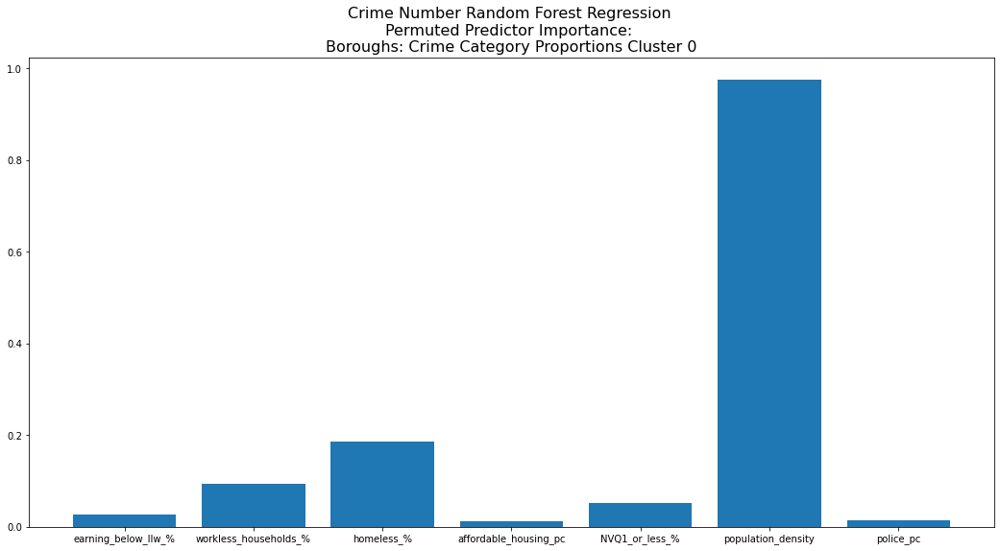

In [281]:
plot_pred_importance_bar(crime_cat_cluster_0_crime_num_pred_importance, 0, 'num', 'Crime Category Proportions Cluster 0', 'crime_category_clusters')

In [282]:
crime_cat_cluster_0_crime_pc_pred_importance = train_test_rf_model(crime_category_cluster_0_df, 'crime_pc', 0.3)
crime_cat_cluster_0_crime_pc_pred_importance.head()

Mean Absolute Error: 0.00415633443146155 
Mean Absolute Percentage Error: 0.05386828809843936 
Mean Squared Error: 2.9243325613846115e-05


,earning_below_llw_%,workless_households_%,homeless_%,affordable_housing_pc,NVQ1_or_less_%,population_density,police_pc
importance_mean,0.070084,0.036455,0.067322,0.007486,0.045317,1.264165,0.031028
importance_std,0.015554,0.008048,0.016926,0.002930,0.011411,0.168199,0.008478


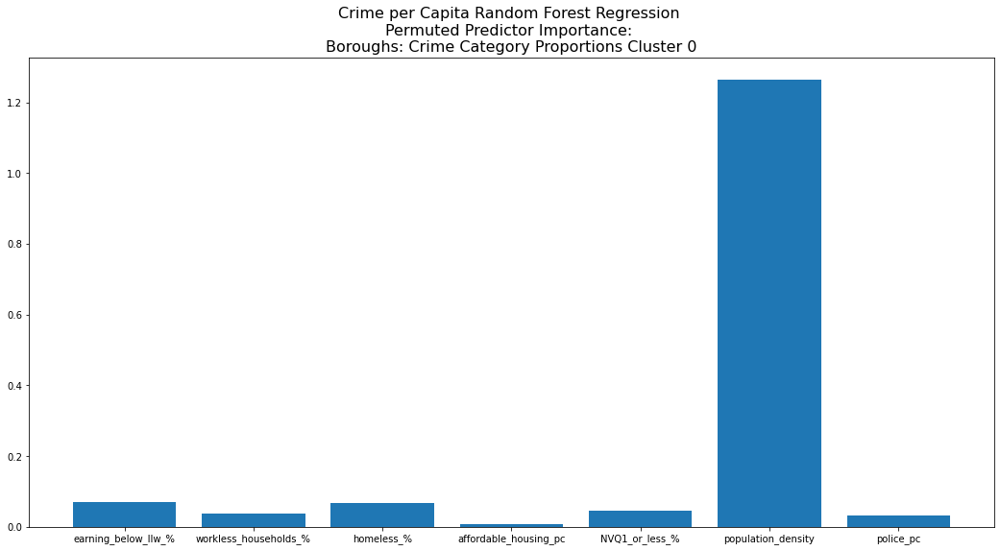

In [283]:
plot_pred_importance_bar(crime_cat_cluster_0_crime_pc_pred_importance, 0, 'pc', 'Crime Category Proportions Cluster 0', 'crime_category_clusters')

Population density acts as the most powerful predictor in both models built for this cluster. While the percentage of people that are homeless is the next highest in both models, this measure has lower importance level in the crime per capita model, where it sits at a similar level of importance to the percentage of employees that are earning below LLW.

### Cluster 1

In [284]:
print('The boroughs in this cluster are:')
print(crime_category_cluster_1_boroughs)

The boroughs in this cluster are:
['Camden' 'Hammersmith and Fulham' 'Islington' 'Kensington and Chelsea'
 'Westminster']


In [285]:
crime_cat_cluster_1_crime_num_pred_importance = train_test_rf_model(crime_category_cluster_1_df, 'crime_num', 0.3)
crime_cat_cluster_1_crime_num_pred_importance.head()

Mean Absolute Error: 5191.891618603963 
Mean Absolute Percentage Error: 0.16254072866263963 
Mean Squared Error: 68197975.90515433


,earning_below_llw_%,workless_households_%,homeless_%,affordable_housing_pc,NVQ1_or_less_%,population_density,police_pc
importance_mean,0.168228,0.012280,0.988748,-0.001011,0.038965,0.009381,0.001147
importance_std,0.084507,0.011178,0.253926,0.004861,0.028398,0.004597,0.003630


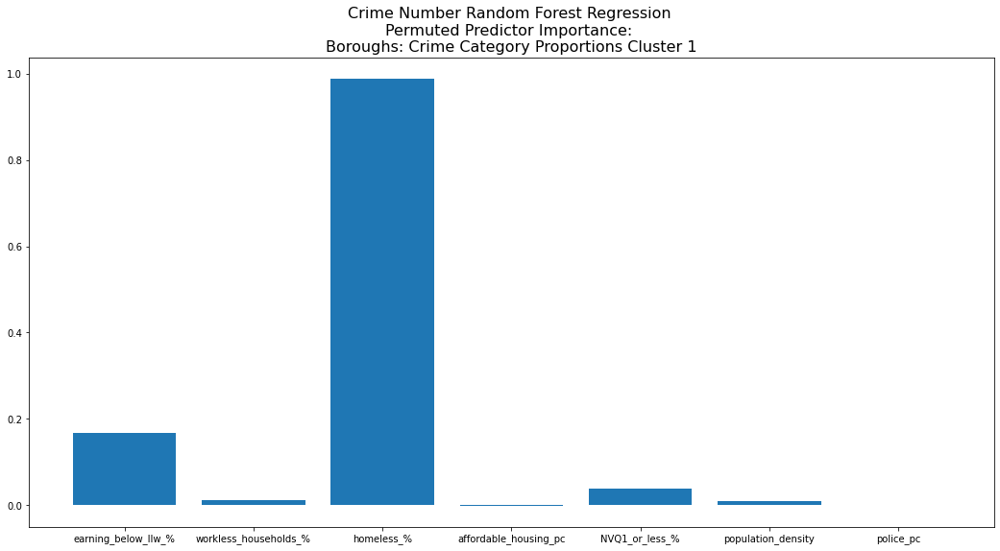

In [286]:
plot_pred_importance_bar(crime_cat_cluster_1_crime_num_pred_importance, 1, 'num', 'Crime Category Proportions Cluster 1', 'crime_category_clusters')

In [287]:
crime_cat_cluster_1_crime_pc_pred_importance = train_test_rf_model(crime_category_cluster_1_df, 'crime_pc', 0.3)
crime_cat_cluster_1_crime_pc_pred_importance.head()

Mean Absolute Error: 0.020923356253195784 
Mean Absolute Percentage Error: 0.10480411310361333 
Mean Squared Error: 0.0015638447803970252


,earning_below_llw_%,workless_households_%,homeless_%,affordable_housing_pc,NVQ1_or_less_%,population_density,police_pc
importance_mean,0.015233,0.046853,0.899126,-0.004114,0.001346,0.033366,-0.000177
importance_std,0.014172,0.036272,0.262412,0.014780,0.001926,0.010233,0.004907


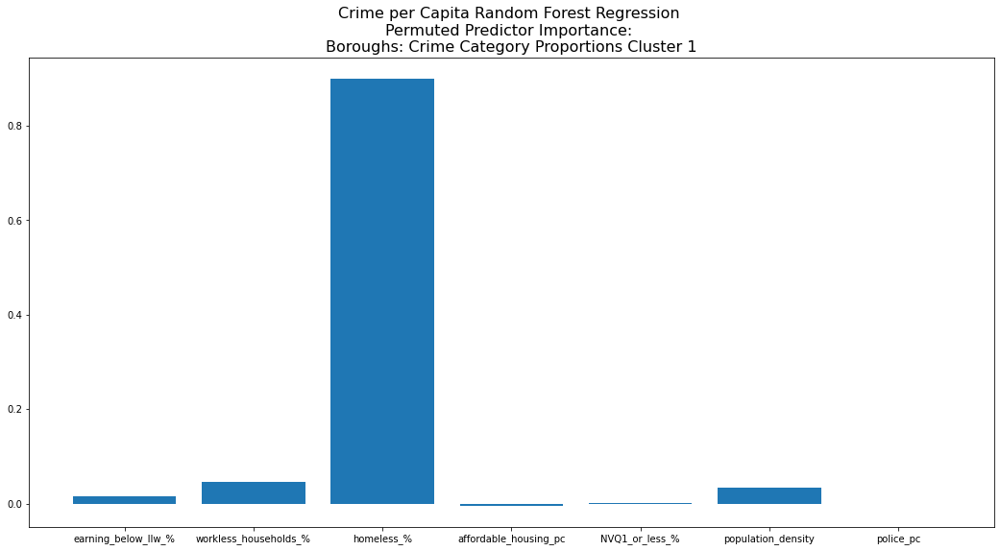

In [288]:
plot_pred_importance_bar(crime_cat_cluster_1_crime_pc_pred_importance, 1, 'pc', 'Crime Category Proportions Cluster 1', 'crime_category_clusters')

In both models for this cluster, affordable housing and police per capita have negligable predictive power. The percentage of the population that is homeless is the by far the most important predictor in both these models, with the number of employees earning below LLW also showing notable prediction importance in the first of these two models.

# 8: Crime Timeseries

In [289]:
# Defining a function to add a date-time row an input DataFrame
def format_date_time(df):
    df.loc['date_time'] = pd.to_datetime(df.columns, format='%Y%m')
    df.columns = df.loc['date_time'].apply(lambda x: x.strftime('%Y-%m'))
    return df

In [290]:
# Apply to borough crime DataFrame
crime_08_21_df = format_date_time(crime_08_21_df)

In [291]:
crime_08_21_df.head()

date_time,2008-01,2008-02,2008-03,2008-04,2008-05,2008-06,2008-07,2008-08,2008-09,2008-10,...,2021-02,2021-03,2021-04,2021-05,2021-06,2021-07,2021-08,2021-09,2021-10,2021-11
Borough,,,,,,,,,,,,,,,,,,,,,
Barking and Dagenham,1593,1517,1500,1614,1549,1554,1693,1574,1316,1531,...,1433,1576,1643,1700,1782,1741,1633,1707,1856,1754
Barnet,2104,1866,2089,2091,2273,2094,2144,1923,1923,2162,...,1891,2489,2249,2431,2485,2259,2189,2323,2396,2241
Bexley,1324,1304,1406,1296,1311,1233,1302,1339,1236,1311,...,1011,1260,1149,1226,1267,1269,1278,1296,1358,1409
Brent,2182,1991,2199,1929,2246,2103,2199,2038,2047,2367,...,2075,2251,2095,2439,2395,2652,2498,2409,2695,2446
Bromley,2106,1963,2041,1993,2124,2012,2234,2067,1974,2190,...,1585,1841,1839,1891,1853,1921,1735,1987,2133,2156


In [292]:
# Apply to city crime DataFrame.
city_crime_08_21_df = format_date_time(city_crime_08_21_df)

In [293]:
city_crime_08_21_df.head()

date_time,2008-01,2008-02,2008-03,2008-04,2008-05,2008-06,2008-07,2008-08,2008-09,2008-10,...,2021-02,2021-03,2021-04,2021-05,2021-06,2021-07,2021-08,2021-09,2021-10,2021-11
London,68690,65702,68070,66071,69400,69134,71069,66155,64641,69829,...,52233,62667,61763,67515,69725,70754,67113,70010,75726,73108
date_time,2008-01-01 00:00:00,2008-02-01 00:00:00,2008-03-01 00:00:00,2008-04-01 00:00:00,2008-05-01 00:00:00,2008-06-01 00:00:00,2008-07-01 00:00:00,2008-08-01 00:00:00,2008-09-01 00:00:00,2008-10-01 00:00:00,...,2021-02-01 00:00:00,2021-03-01 00:00:00,2021-04-01 00:00:00,2021-05-01 00:00:00,2021-06-01 00:00:00,2021-07-01 00:00:00,2021-08-01 00:00:00,2021-09-01 00:00:00,2021-10-01 00:00:00,2021-11-01 00:00:00


In [294]:
import matplotlib.dates as mdates

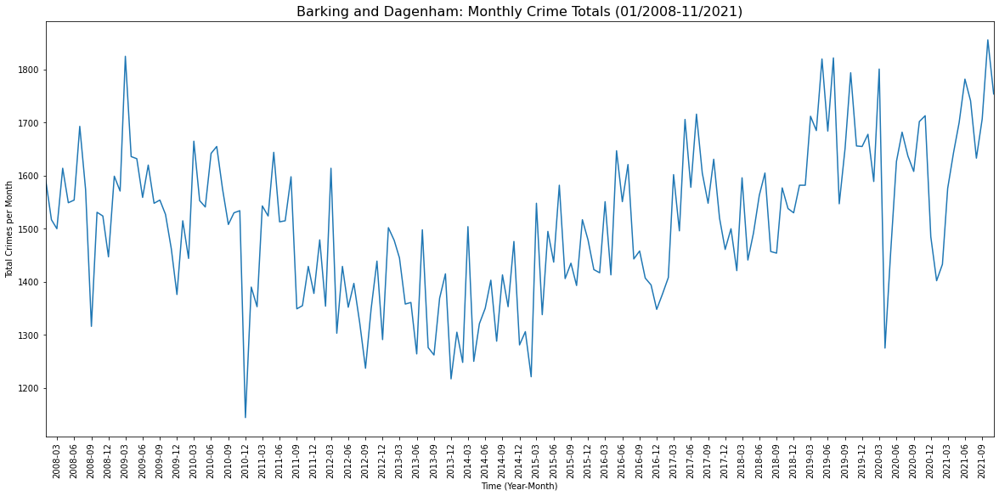

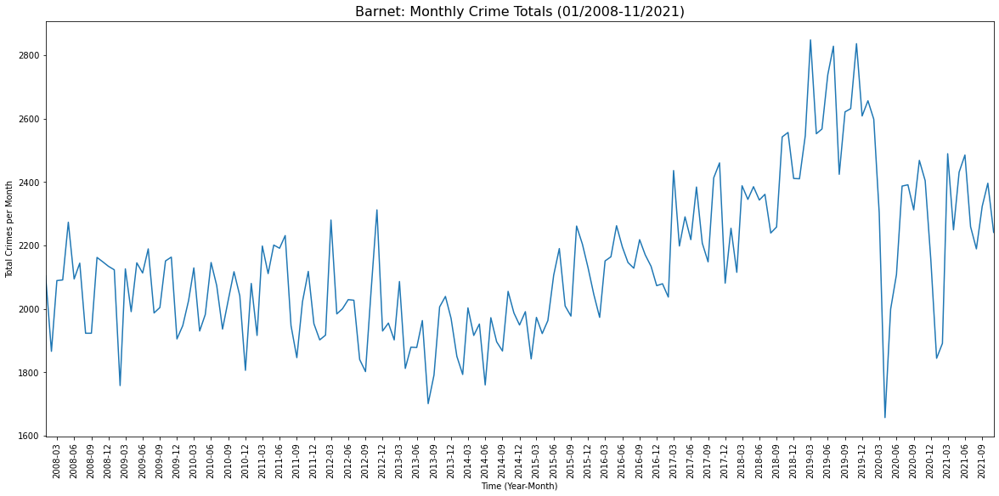

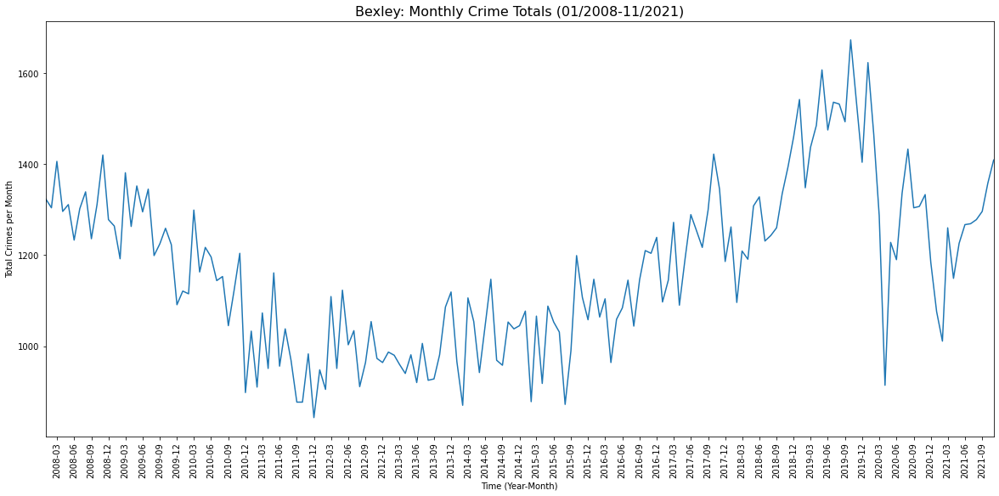

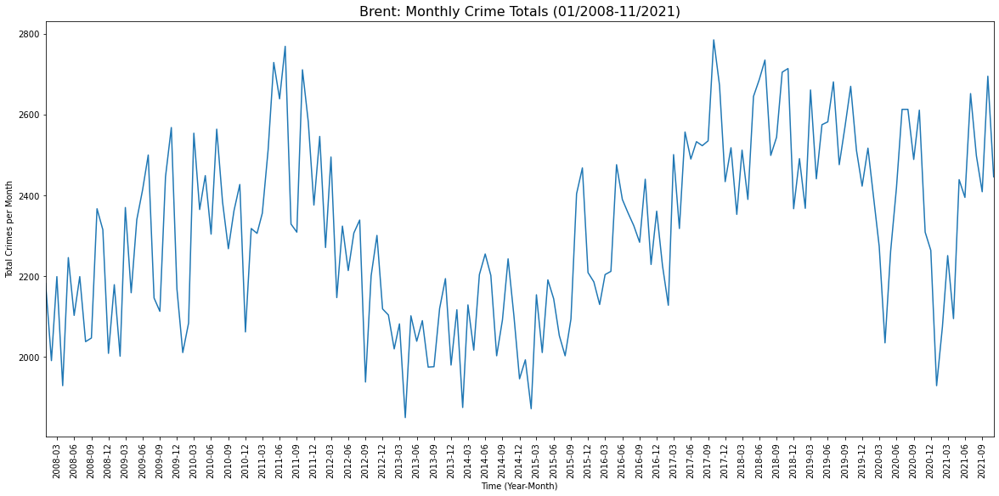

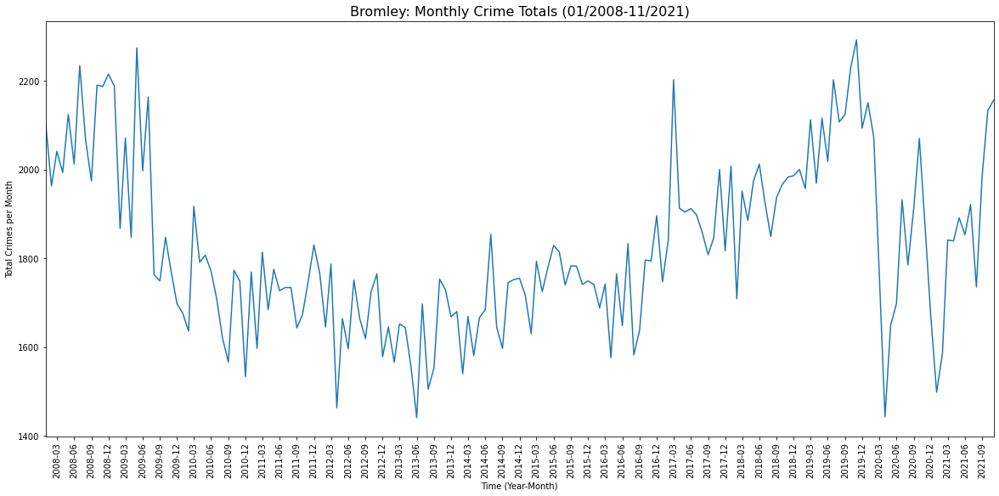

...

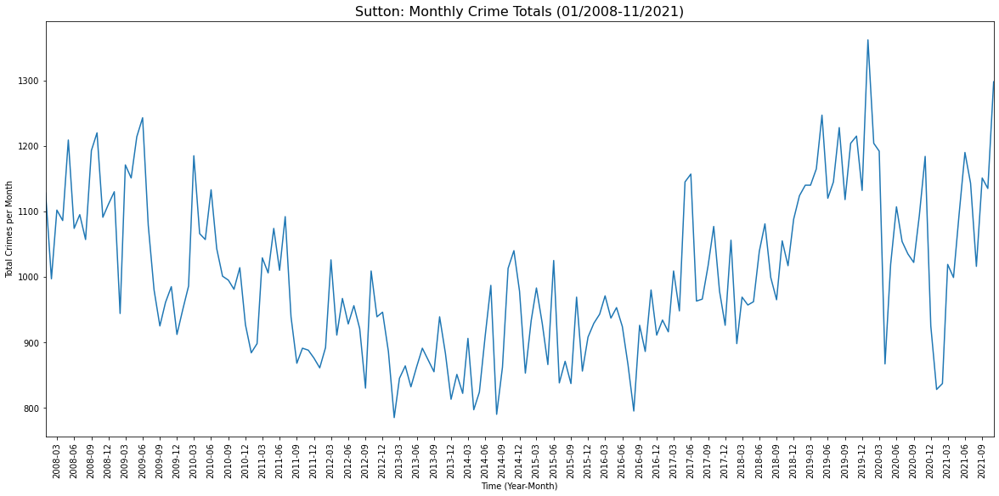

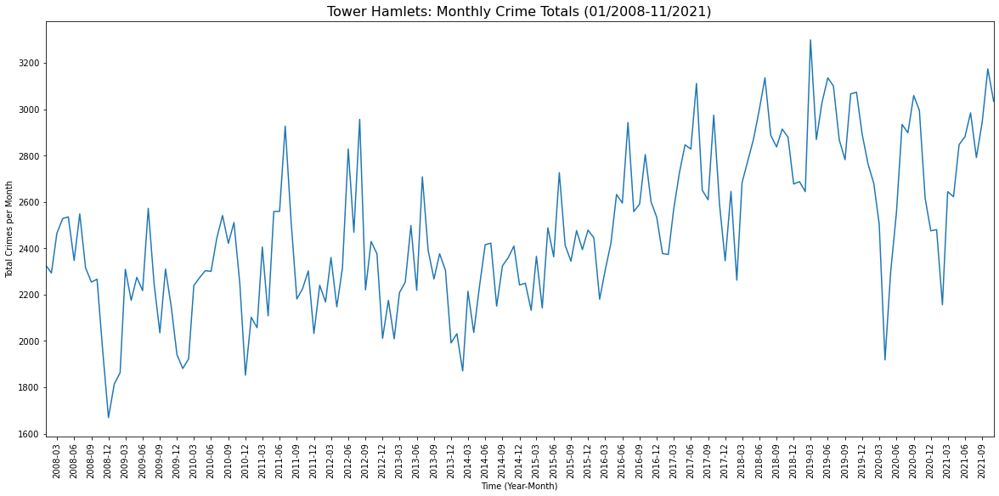

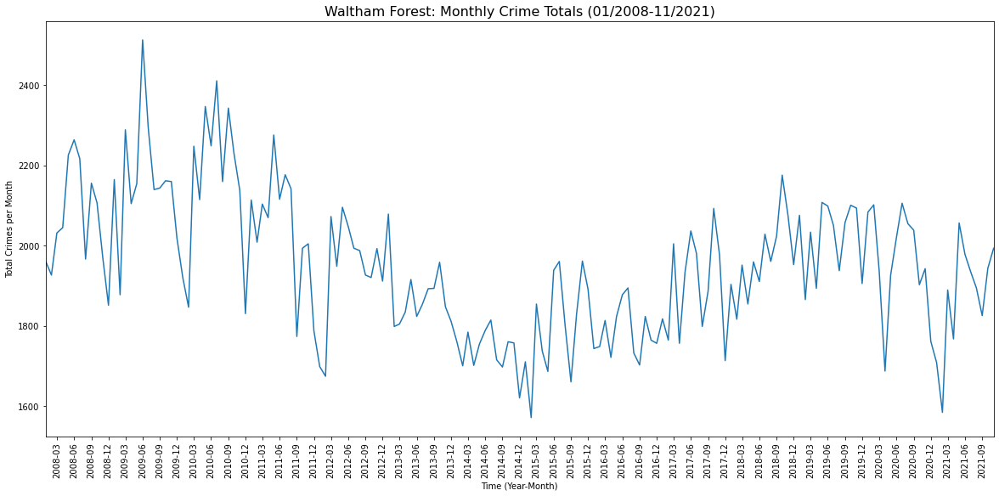

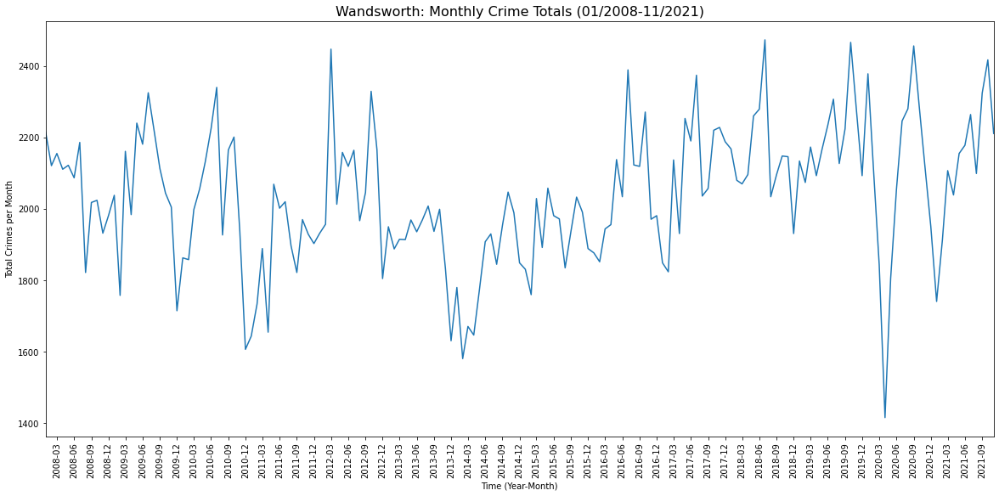

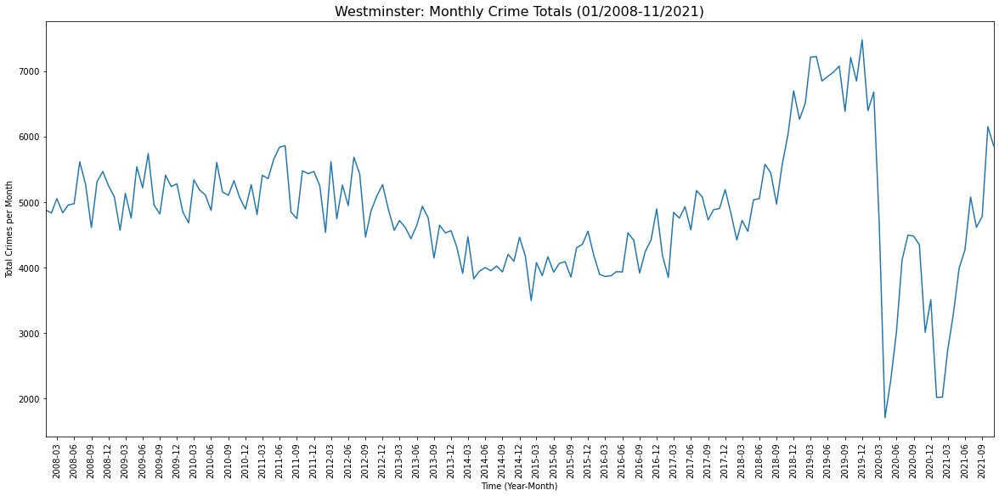

In [295]:
# Plotting an individual time series for each borough, showing monthly crimes (2008-2021)
for borough in borough_list:
    fig, ax = plt.subplots(1, figsize=(20, 9))
    ax.set_title('{}: Monthly Crime Totals (01/2008-11/2021)'.format(borough), fontdict={'fontsize': '16', 'fontweight' : '3'})
    plt.plot(crime_08_21_df.loc['date_time'], crime_08_21_df.loc[borough])
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
    ax.set_xlim(pd.Timestamp('2008-01'), pd.Timestamp('2021-11'))
    plt.xlabel('Time (Year-Month)')
    plt.ylabel('Total Crimes per Month')
    plt.xticks(rotation=90)
    plt.show()
    fig.savefig('figures/timeseries_crime/{}_timeseries_crime.svg'.format(borough), bbox_inches='tight', dpi=300)

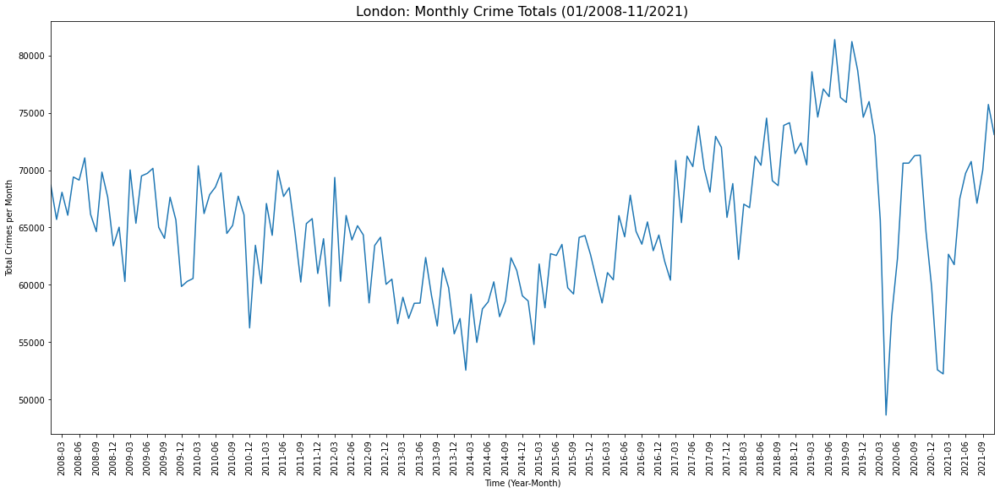

In [296]:
# Plotting a time series for London as a whole, showing monthly crimes (2008-2021)
fig, ax = plt.subplots(1, figsize=(20, 9))
ax.set_title('London: Monthly Crime Totals (01/2008-11/2021)'.format(borough), fontdict={'fontsize': '16', 'fontweight' : '3'})
plt.plot(city_crime_08_21_df.loc['date_time'], city_crime_08_21_df.loc['London'])
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
ax.set_xlim(pd.Timestamp('2008-01'), pd.Timestamp('2021-11'))
plt.xlabel('Time (Year-Month)')
plt.ylabel('Total Crimes per Month')
plt.xticks(rotation=90)
plt.show()
fig.savefig('figures/timeseries_crime/London_timeseries_crime.svg', bbox_inches='tight', dpi=300)

This timeseries shows a dip in the total number of monthly crimes in the city between the December and March of each pair of years. This is most likely due to cold weather keeping people inside over this period. We can also see huge dips in crime numbers at the start of 2020 and 2021, which is due to the lockdown measures posed by the coronavirus pandemic. There has been a rise in the number of domestic abuse crimes, committed against women and children, during the pandemic, however the increase in these types of crimes being reported will not necessarily yield the same increase in Metropolitan Police reports on such crimes, due to the difficulties posed to victims attempting to receive support.

In [297]:
crime_major_category_08_18_df.head()

,Borough,Major Category,200801,200802,200803,200804,200805,200806,200807,200808,...,201805,201806,201807,201808,201809,201810,201811,201812,total,sum_crimes_08_18
0,Barking and Dagenham,Burglary,141,139,143,127,131,142,157,133,...,132,129,134,120,149,155,166,213,22234,44468
1,Barking and Dagenham,Criminal Damage,294,279,246,300,260,237,257,256,...,139,141,144,110,117,145,114,94,22708,45416
2,Barking and Dagenham,Drugs,102,122,99,146,108,136,146,212,...,80,73,82,77,81,69,79,68,12216,24432
3,Barking and Dagenham,Other Notifiable Offences,16,22,27,23,19,30,24,23,...,39,36,39,28,25,20,31,33,3697,7394
4,Barking and Dagenham,Robbery,54,52,58,61,60,56,64,43,...,44,83,81,57,68,78,82,61,8094,16188


In [298]:
crime_major_category_19_21_df.head()

,Borough,Major Category,201901,201902,201903,201904,201905,201906,201907,201908,...,202103,202104,202105,202106,202107,202108,202109,202110,202111,total
0,Barking and Dagenham,Burglary,162,136,130,125,137,124,103,102,...,86,88,112,90,81,115,91,121,109,3899
1,Barking and Dagenham,Criminal Damage,106,133,148,138,161,122,142,135,...,90,117,139,154,137,166,127,138,116,4370
2,Barking and Dagenham,Drugs,85,76,124,110,96,106,103,82,...,156,138,124,133,136,132,143,140,130,4304
3,Barking and Dagenham,Other Notifiable,31,43,43,41,51,31,32,33,...,50,46,57,45,50,30,39,67,51,1511
4,Barking and Dagenham,Robbery,84,74,86,95,132,108,103,81,...,53,41,48,49,45,41,55,58,65,2353


In [299]:
# Formatting crime category names, as they are not the same in both category DataFrames.
crime_major_category_19_21_df.loc[crime_major_category_19_21_df['Major Category'] == 'Other Notifiable', 'Major Category'] = 'Other Notifiable Offences'

In [300]:
# Dropping undesired columns in both DataFrames
crime_major_category_08_18_df.drop(columns=['total', 'sum_crimes_08_18'], inplace=True)
crime_major_category_19_21_df.drop(columns=['total'], inplace=True)

In [301]:
# Merging DataFrames on borough and major category values.
crime_major_category_08_21_df = pd.merge(crime_major_category_08_18_df, crime_major_category_19_21_df,  how='left', left_on=['Borough', 'Major Category'], right_on=['Borough', 'Major Category'])

After plotting graphs, for each borough, containing lines for each of the different majory categories, most of the categories showed little change over the years, aside from a few spikes. The two categories that showed more variation, with long-lasting trends, were 'Theft and Handling' and 'Violence Against the Person'. As a result the graphs below will only show measurements for these two categories.

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


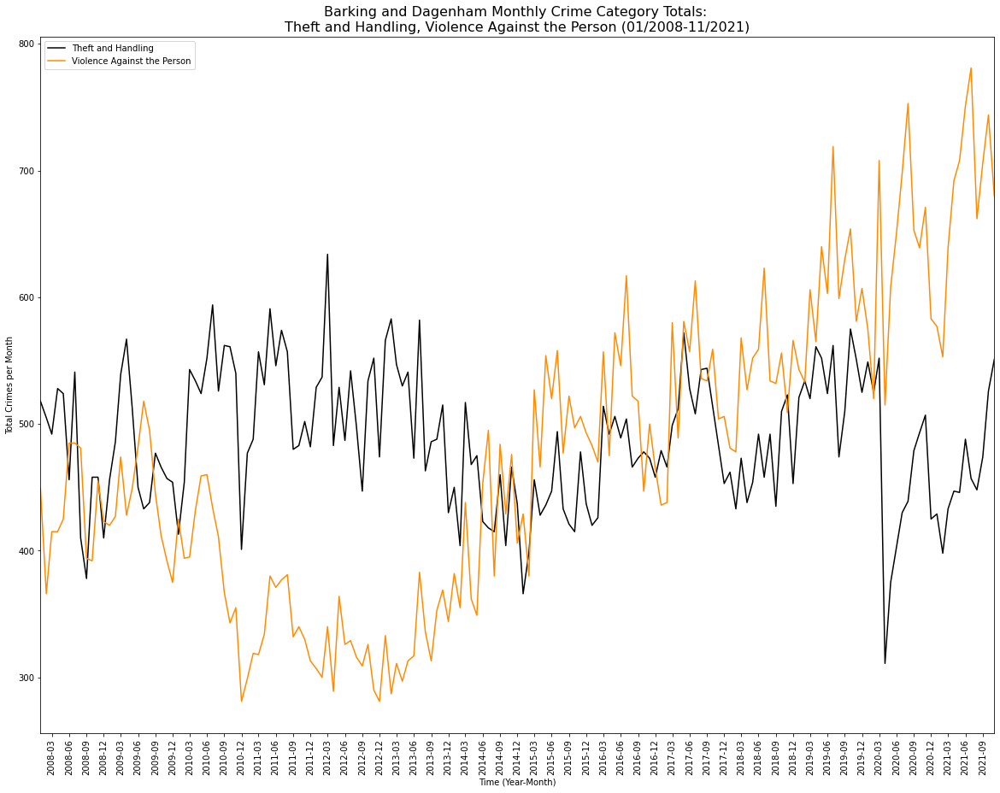

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


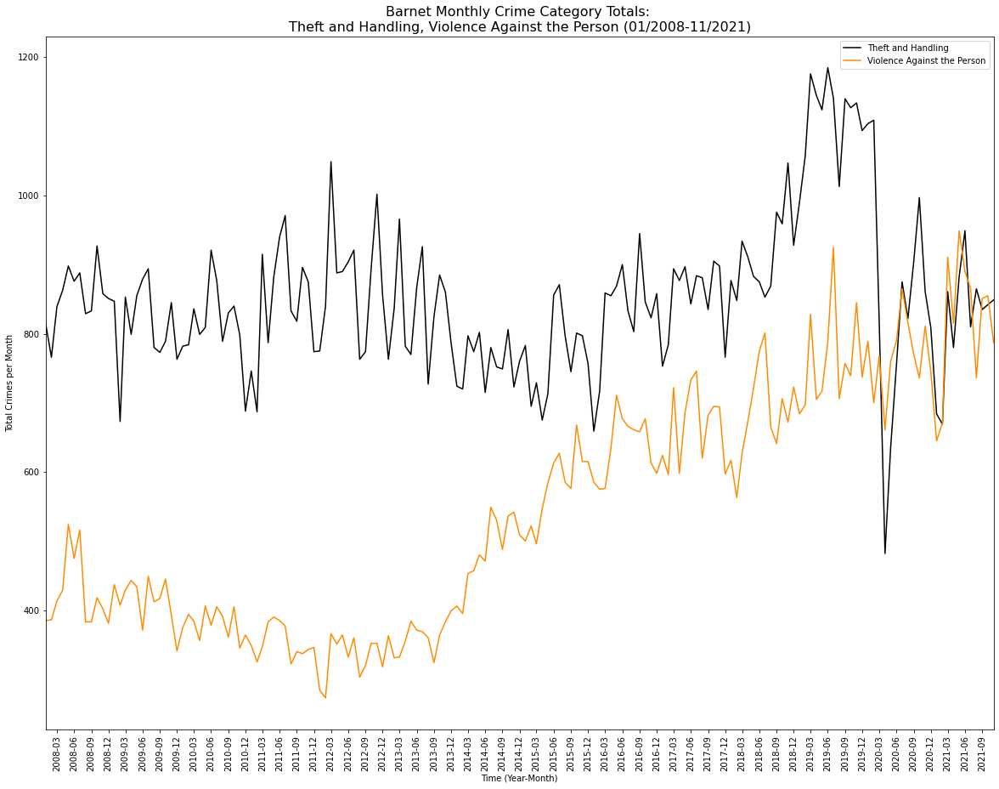

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


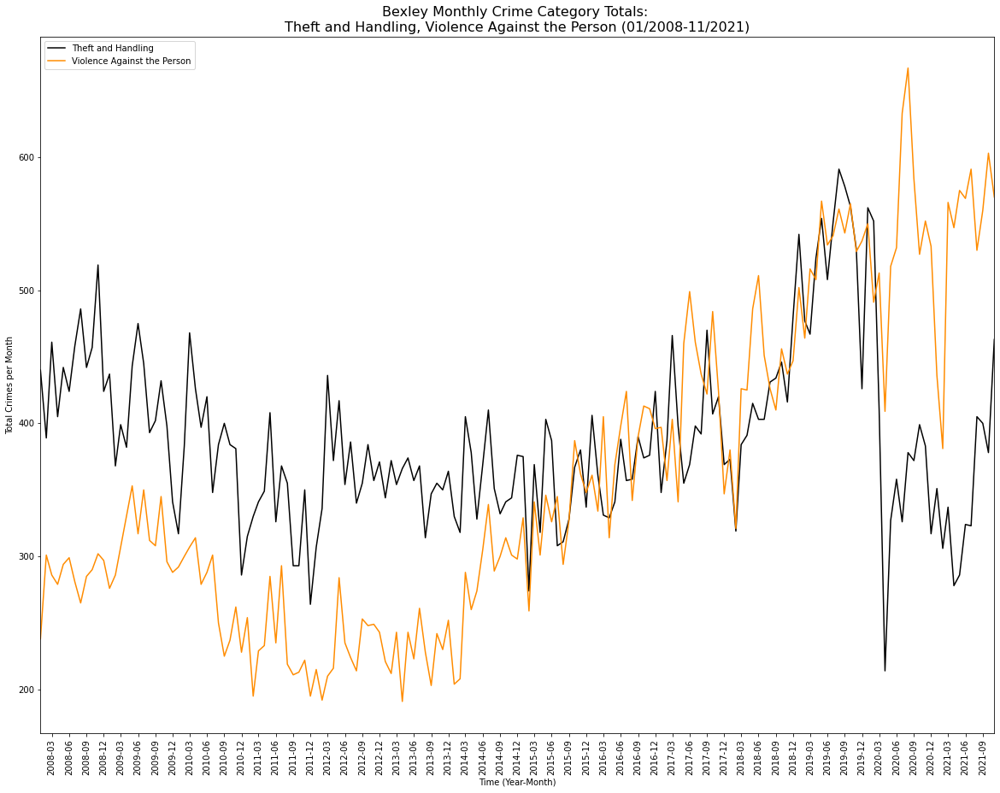

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


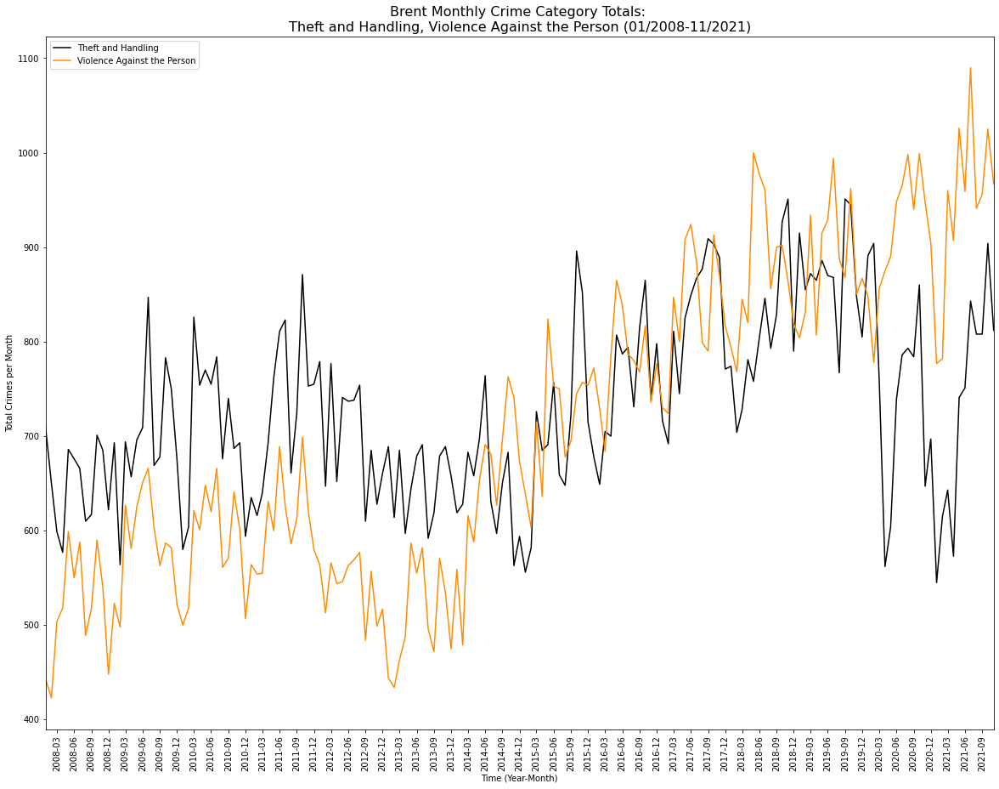

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


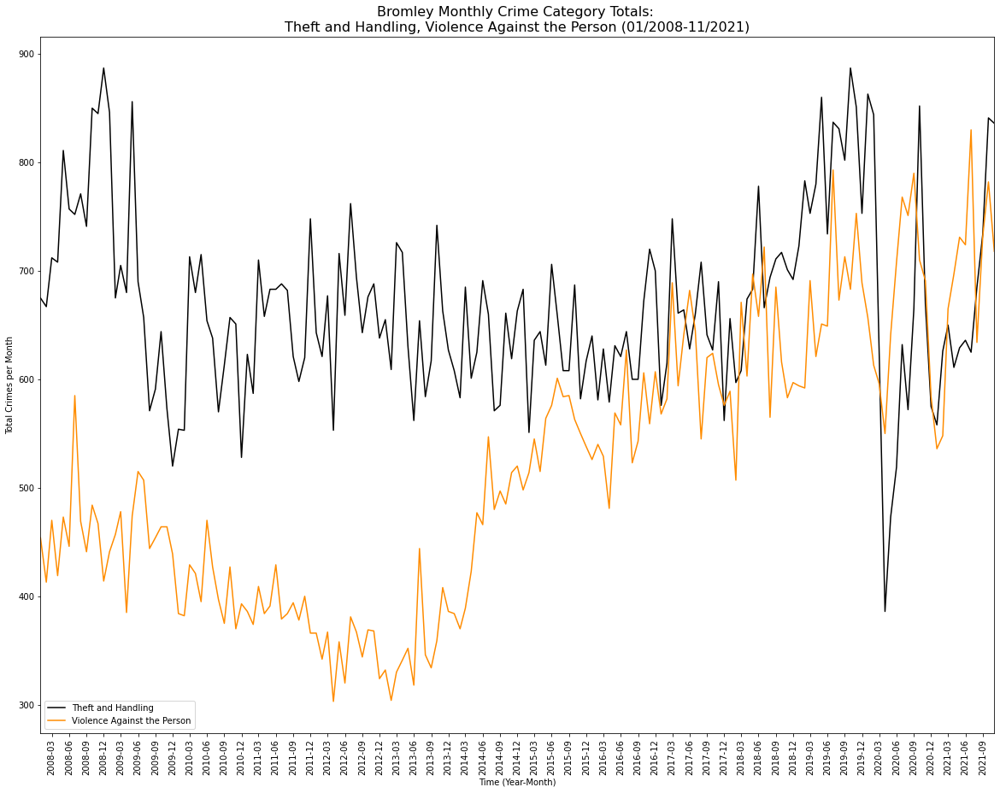

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


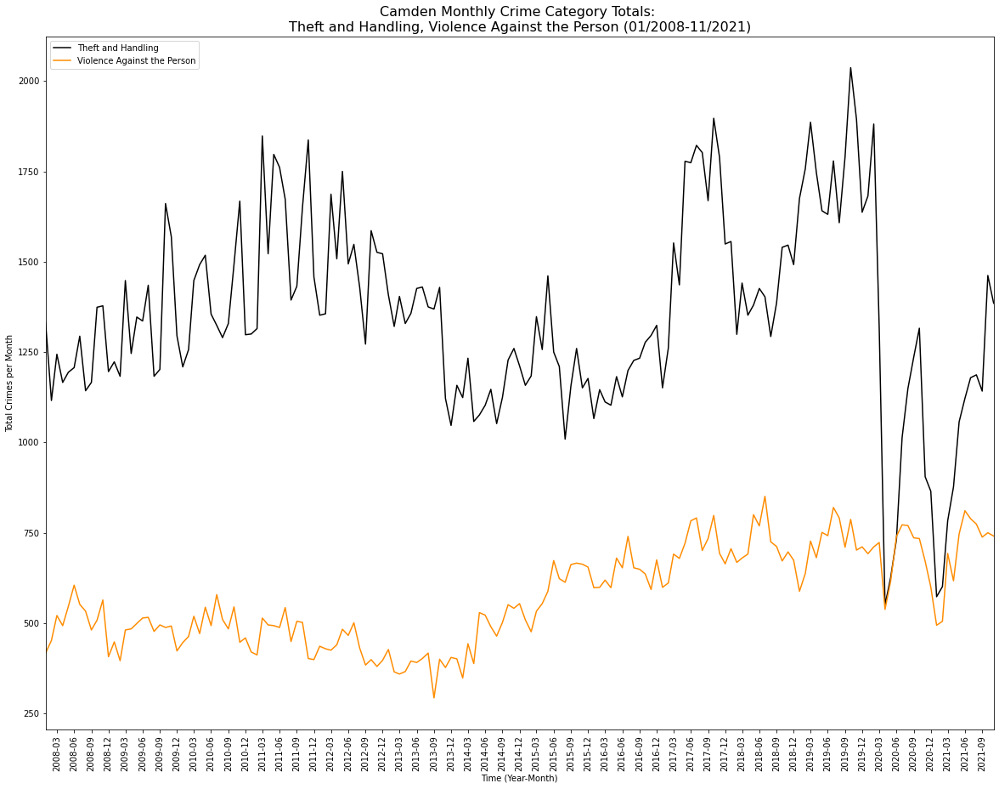

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


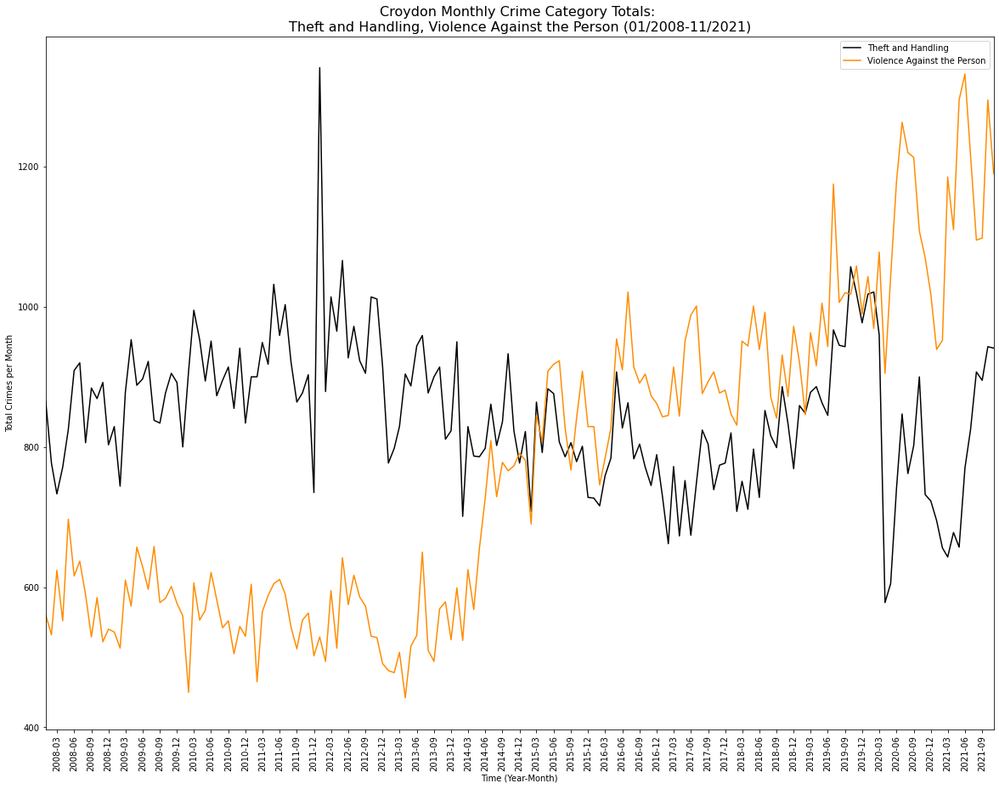

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


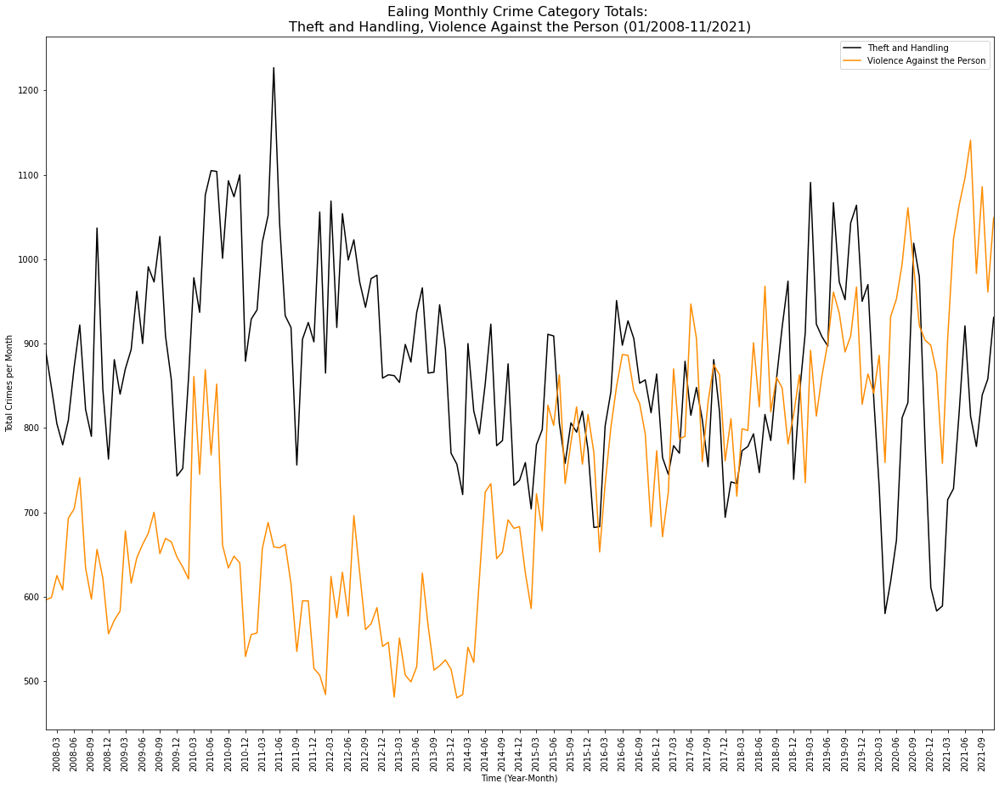

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


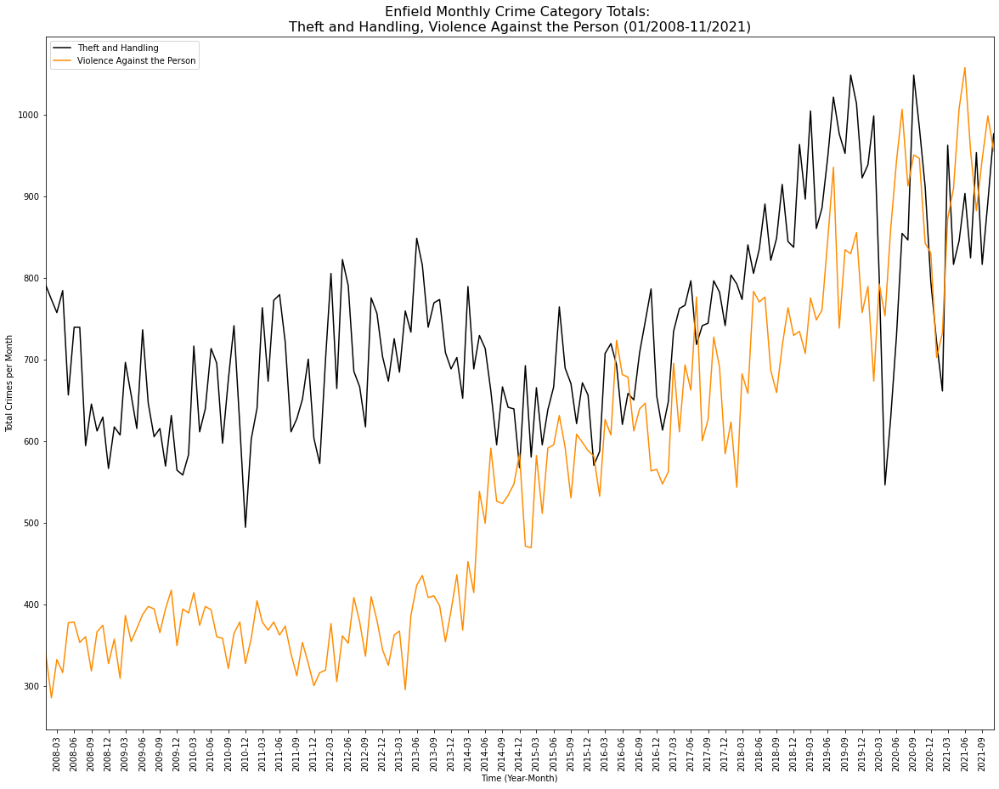

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


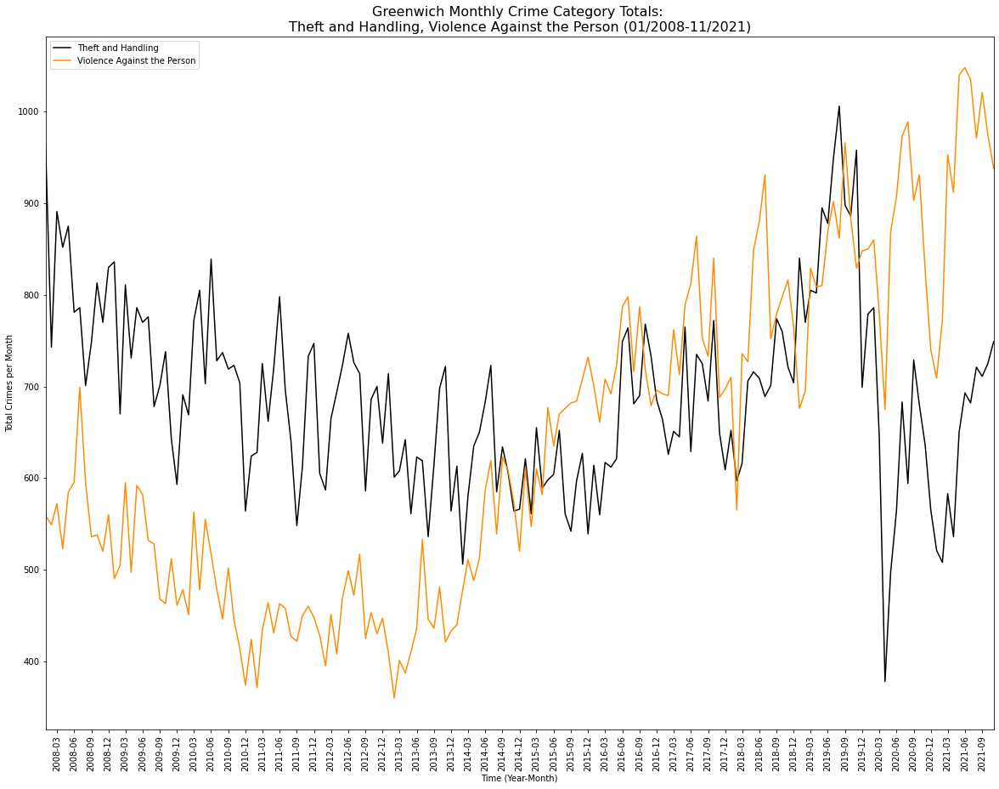

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


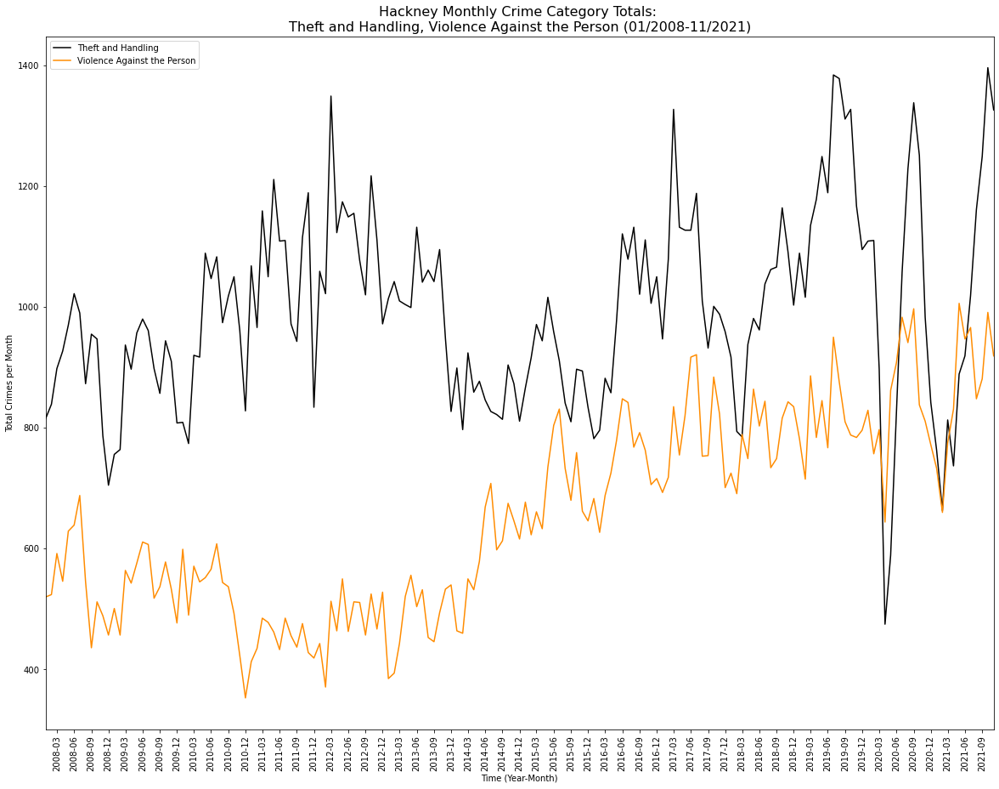

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


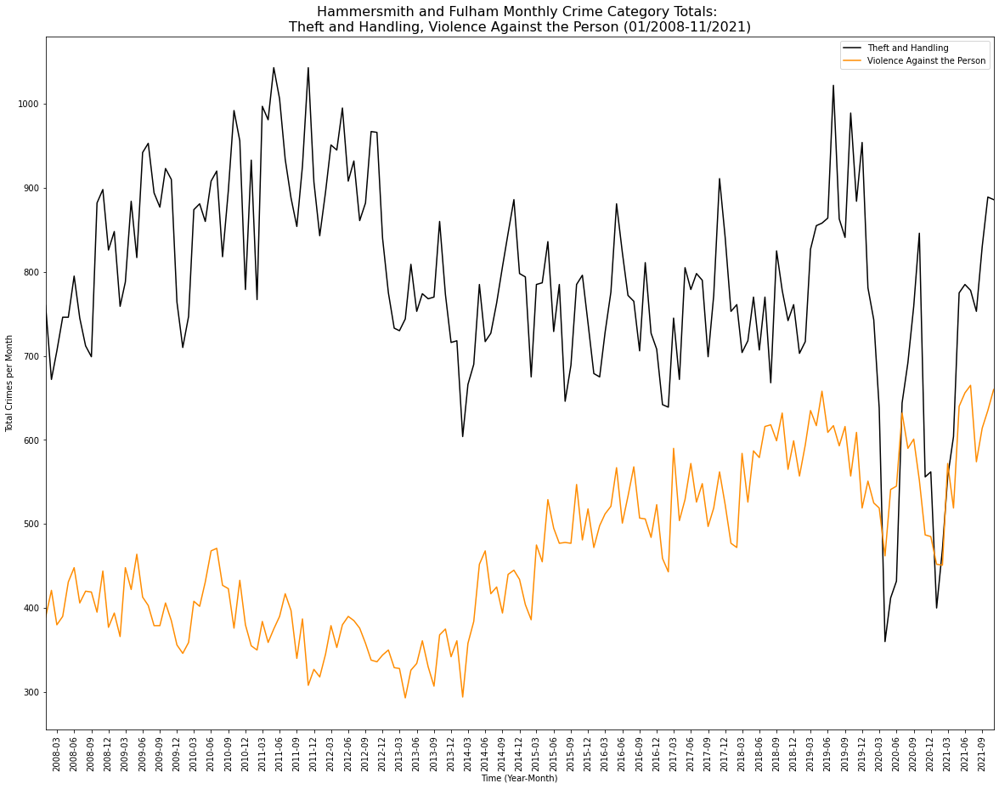

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


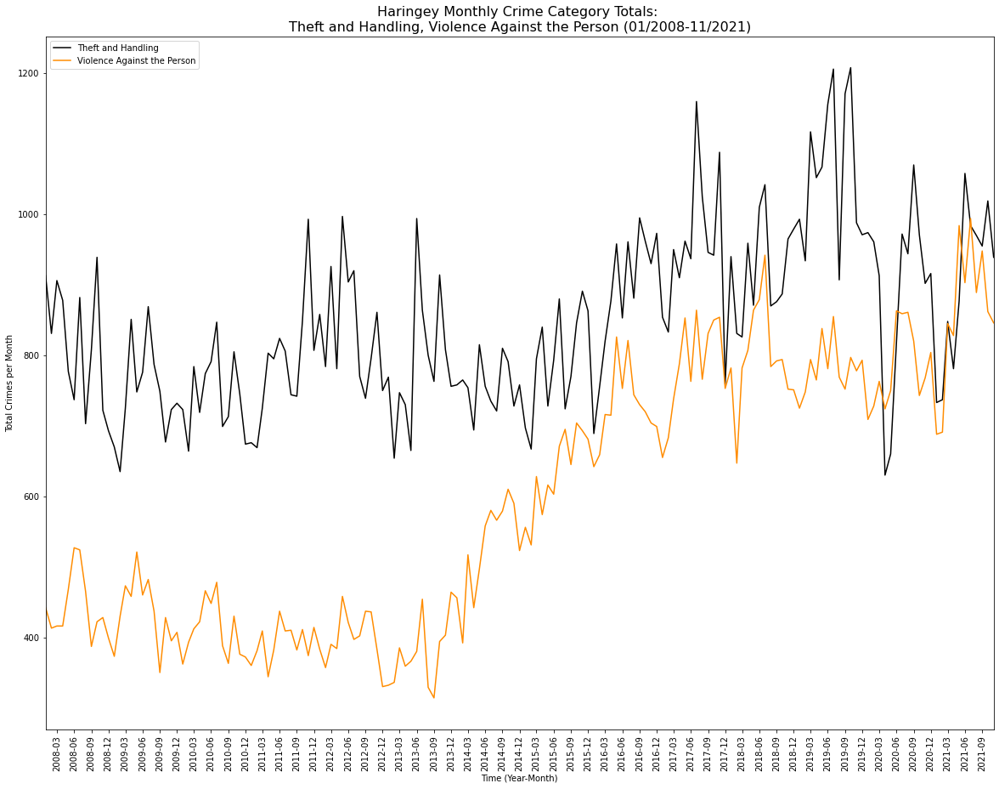

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


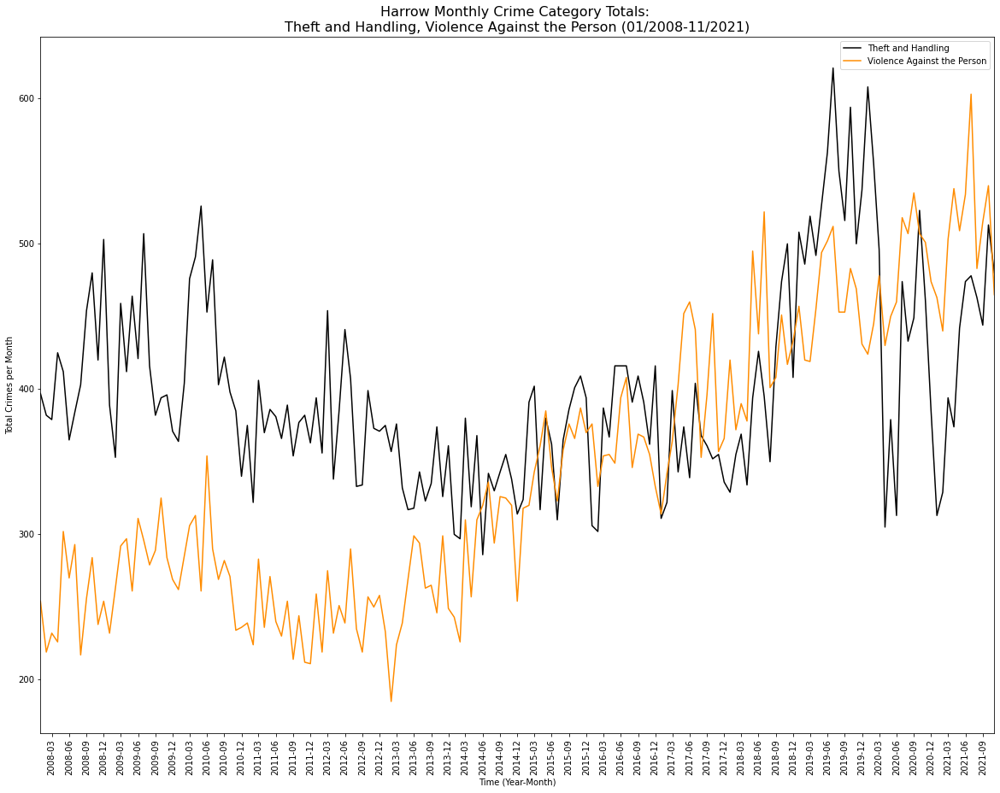

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


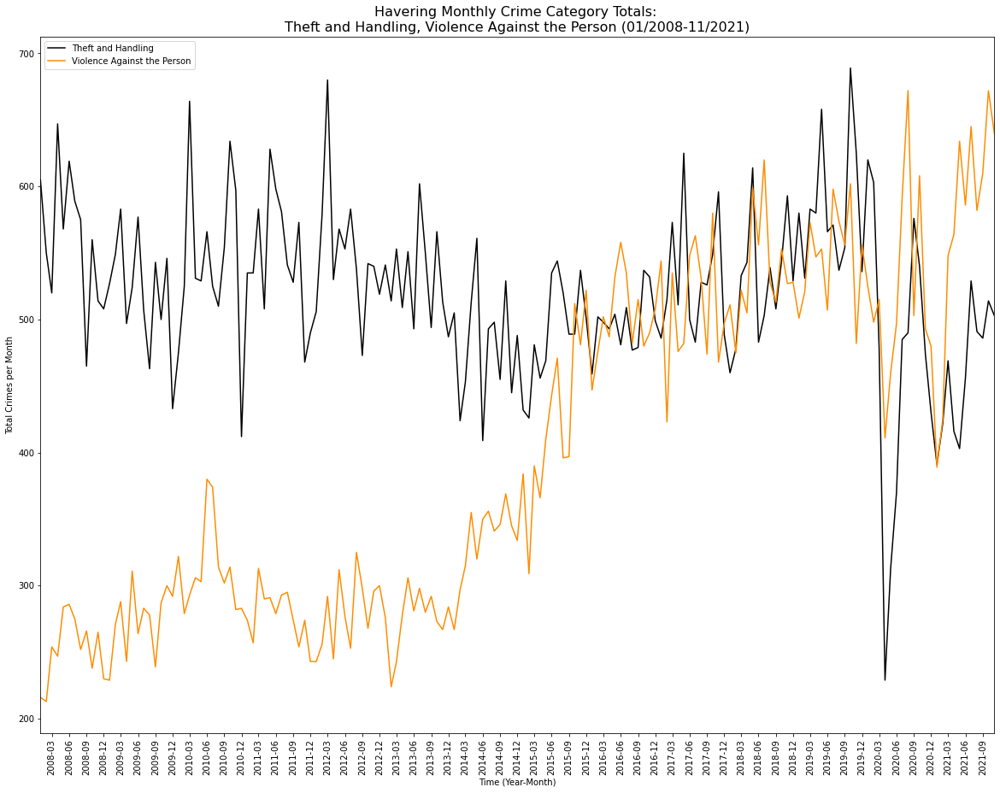

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


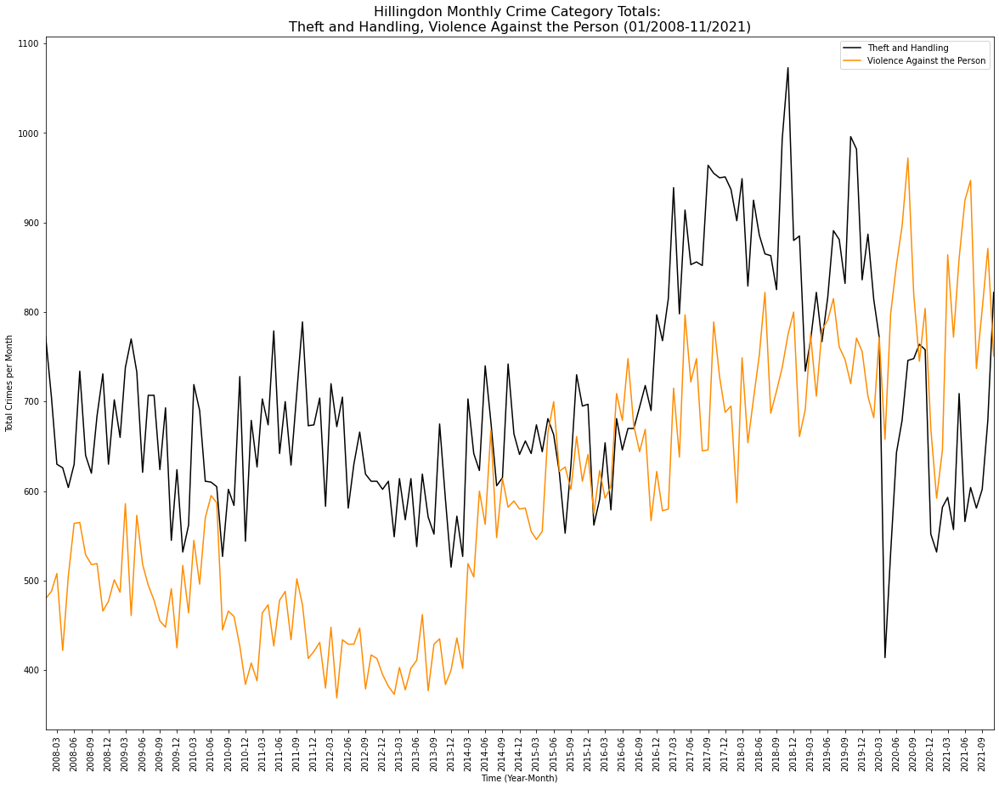

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


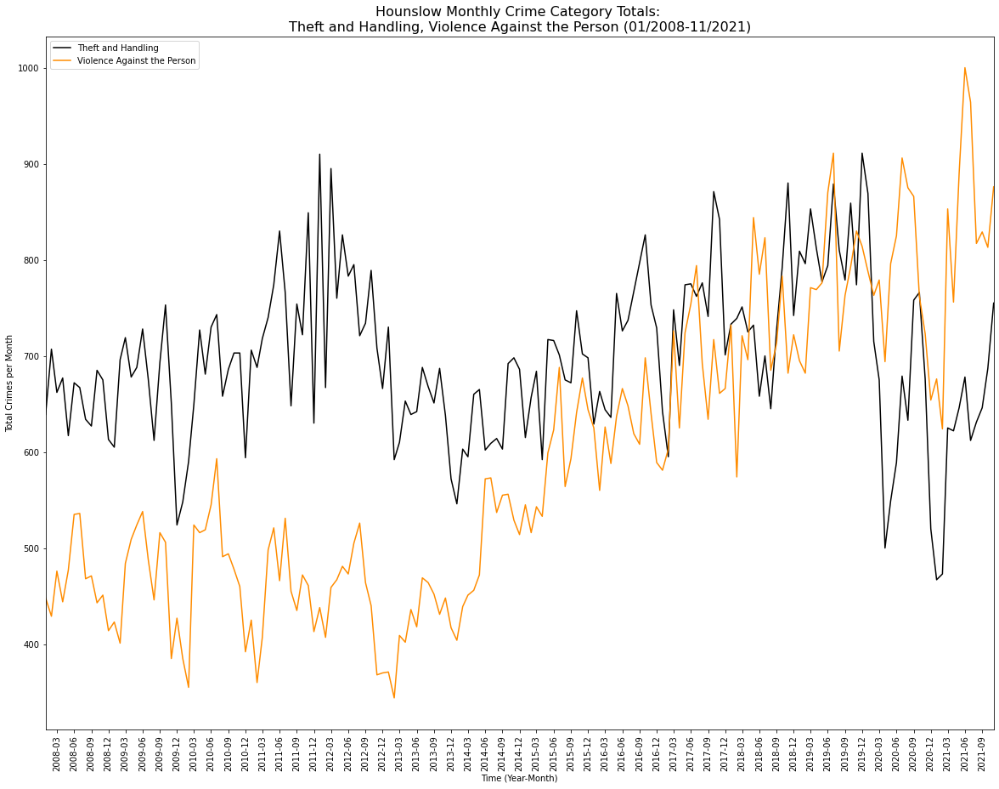

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


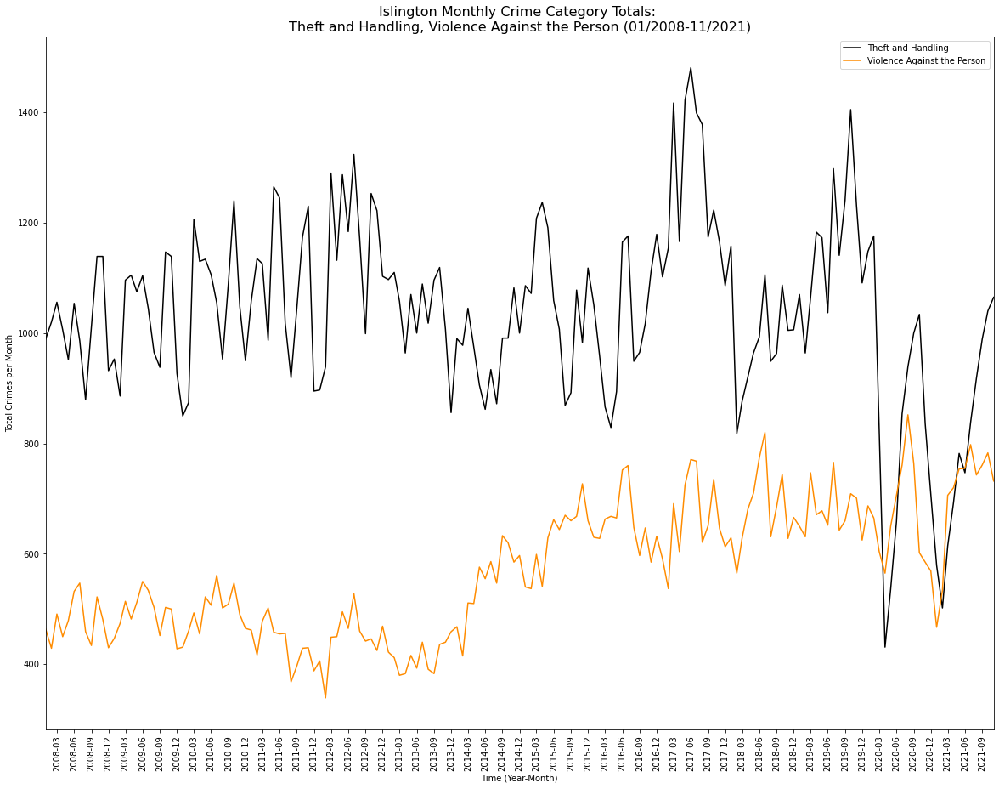

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


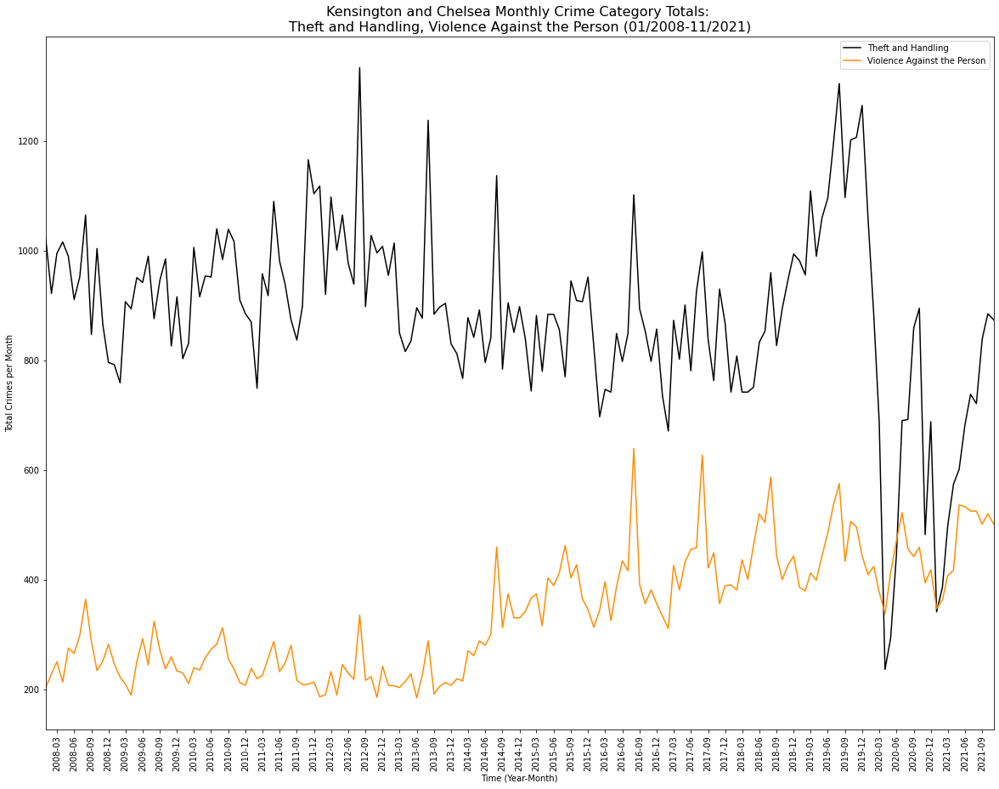

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


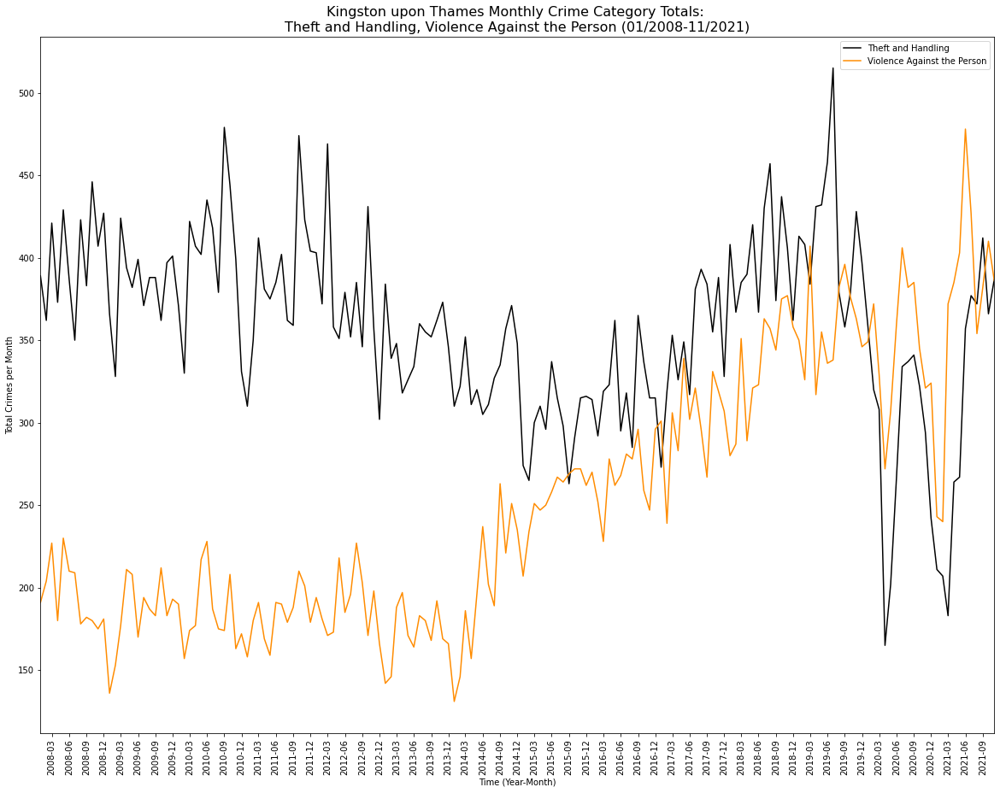

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


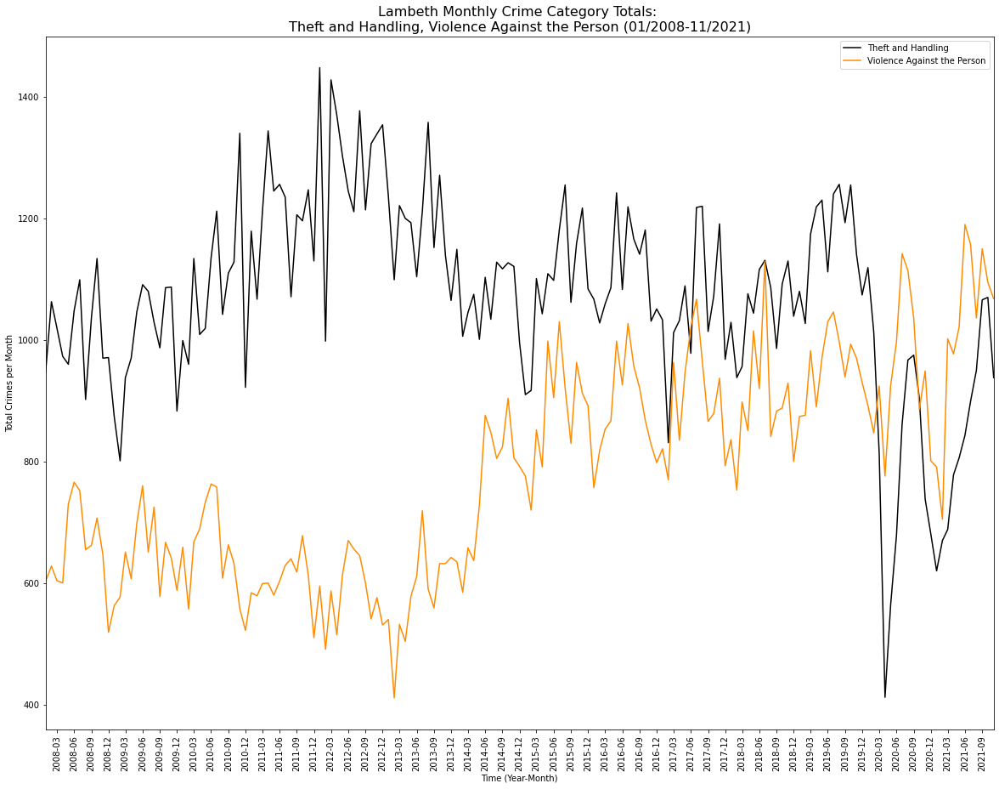

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


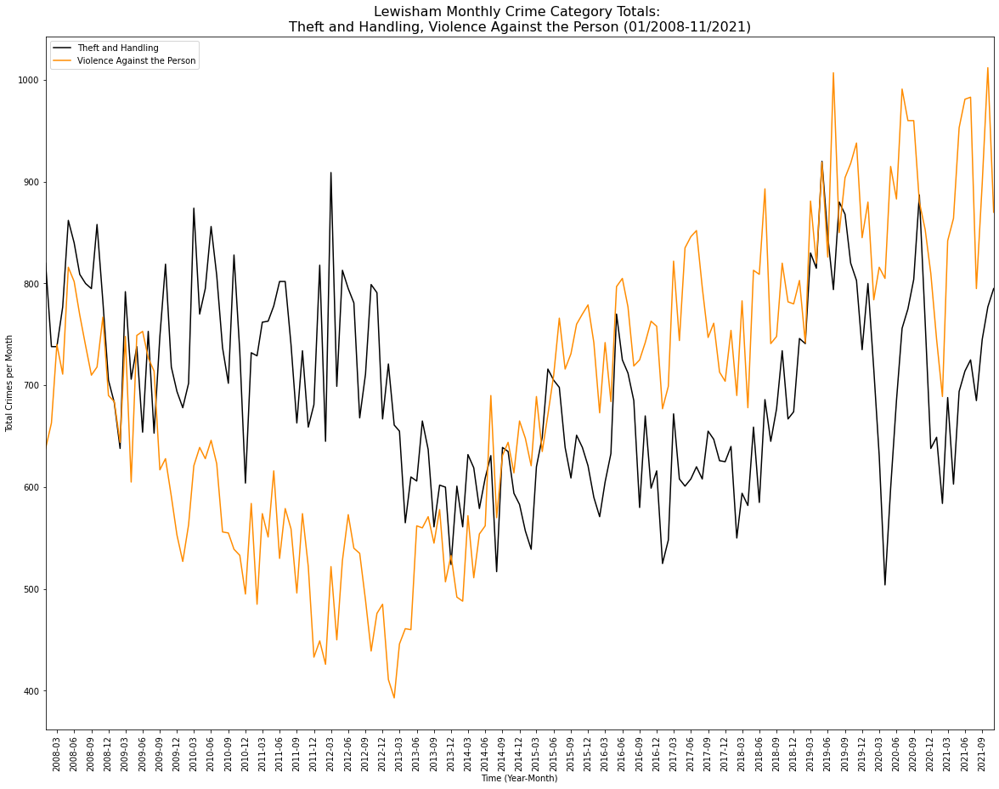

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


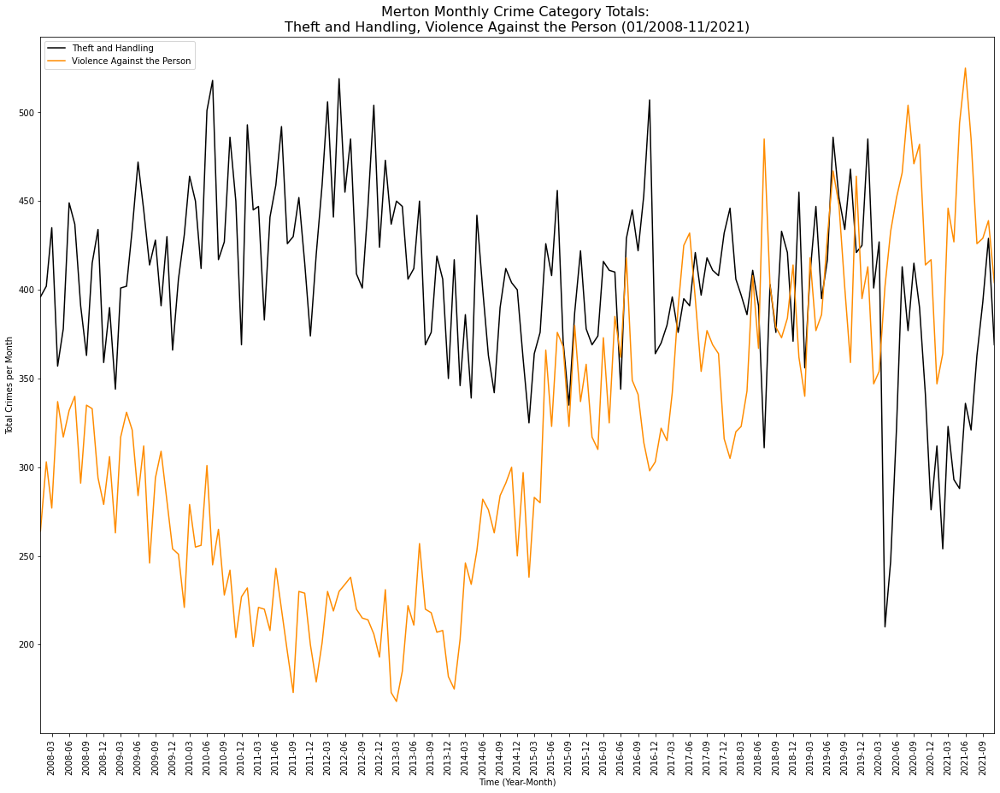

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


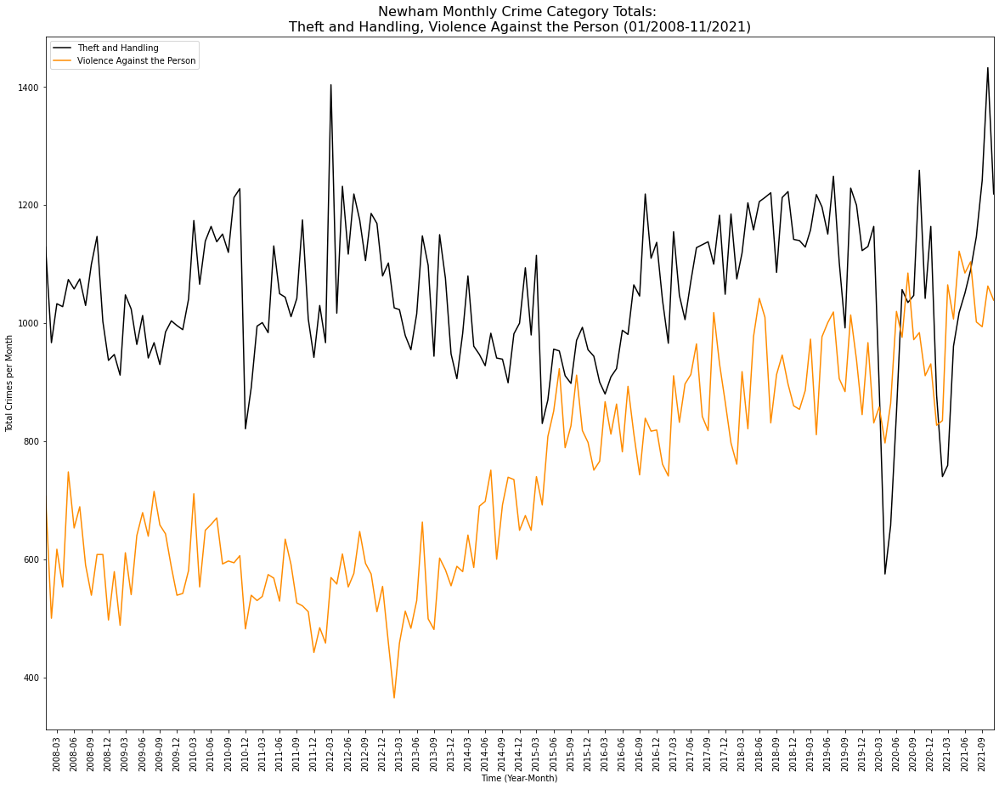

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


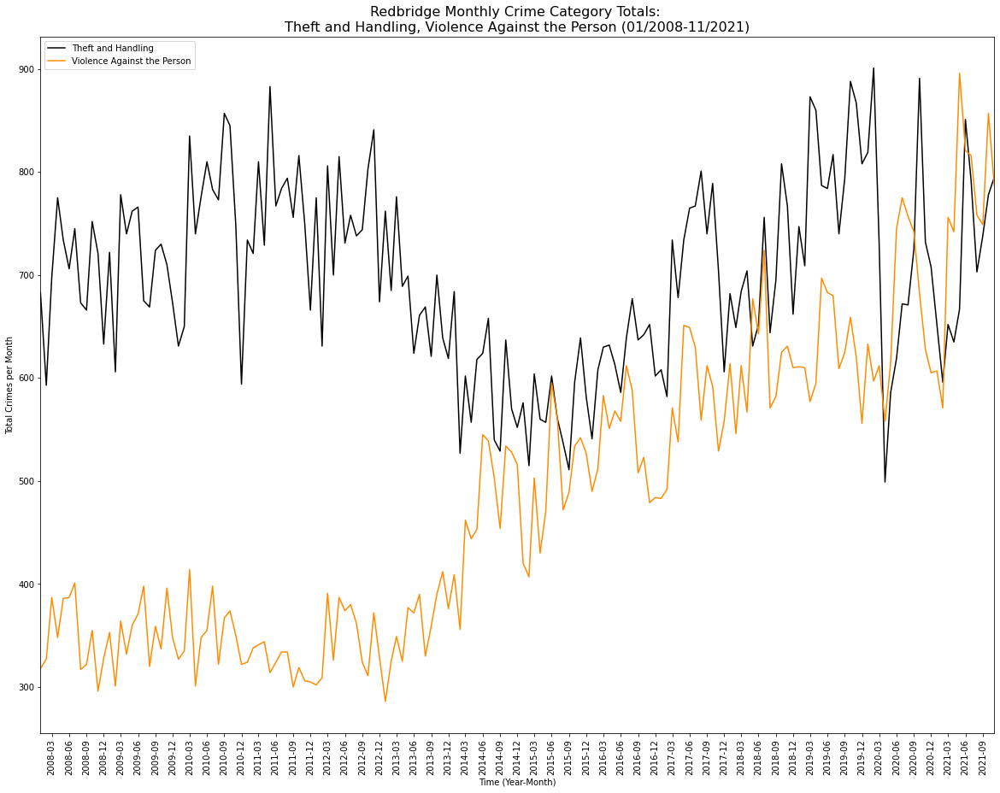

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


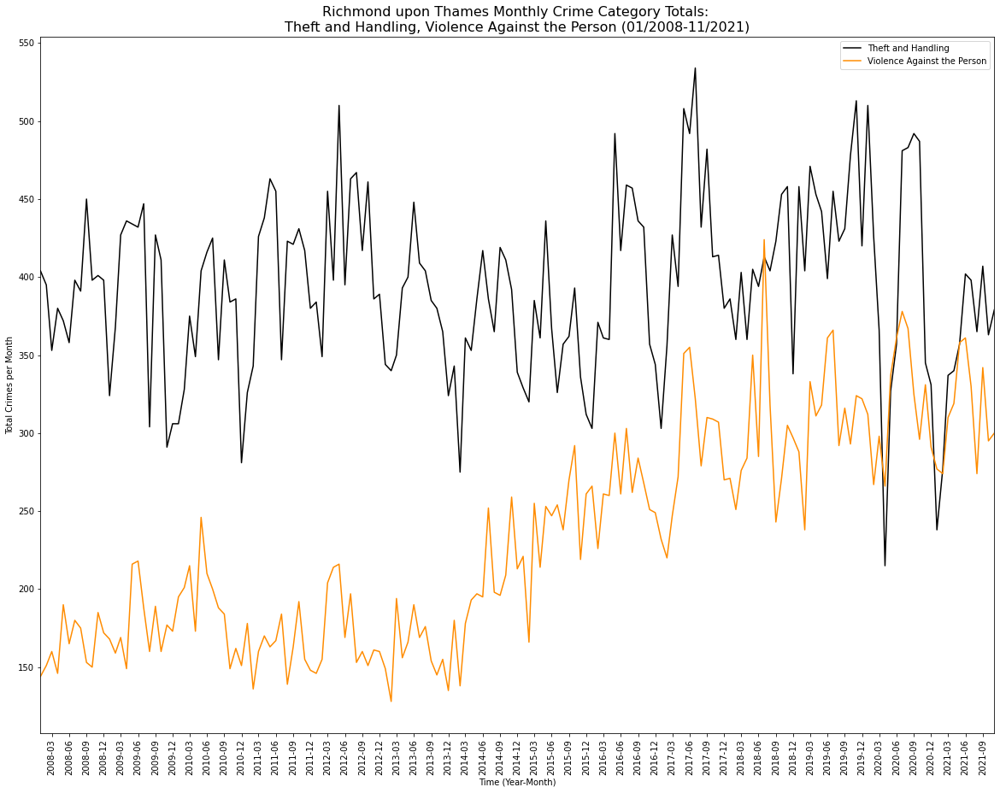

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


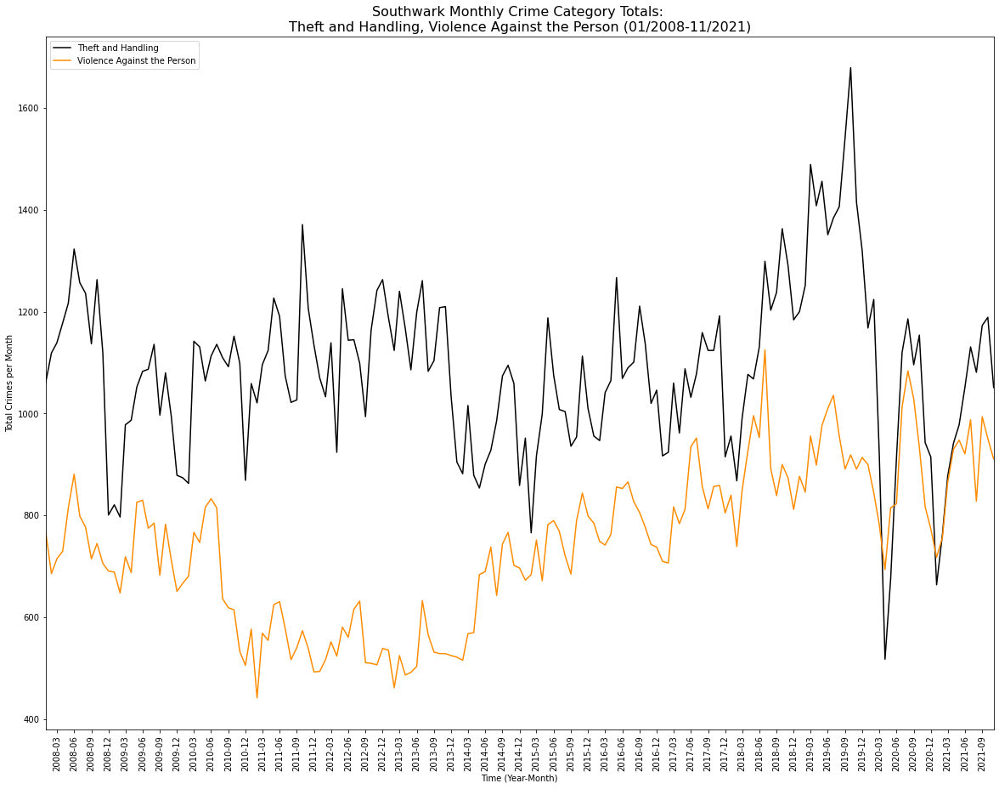

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


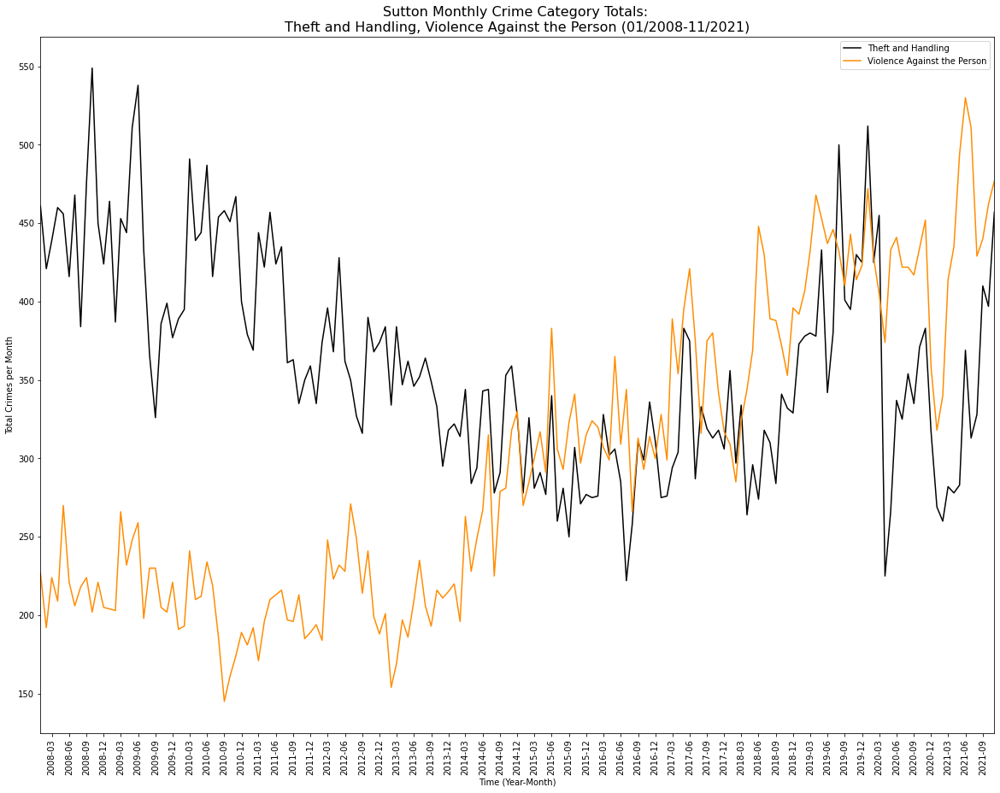

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


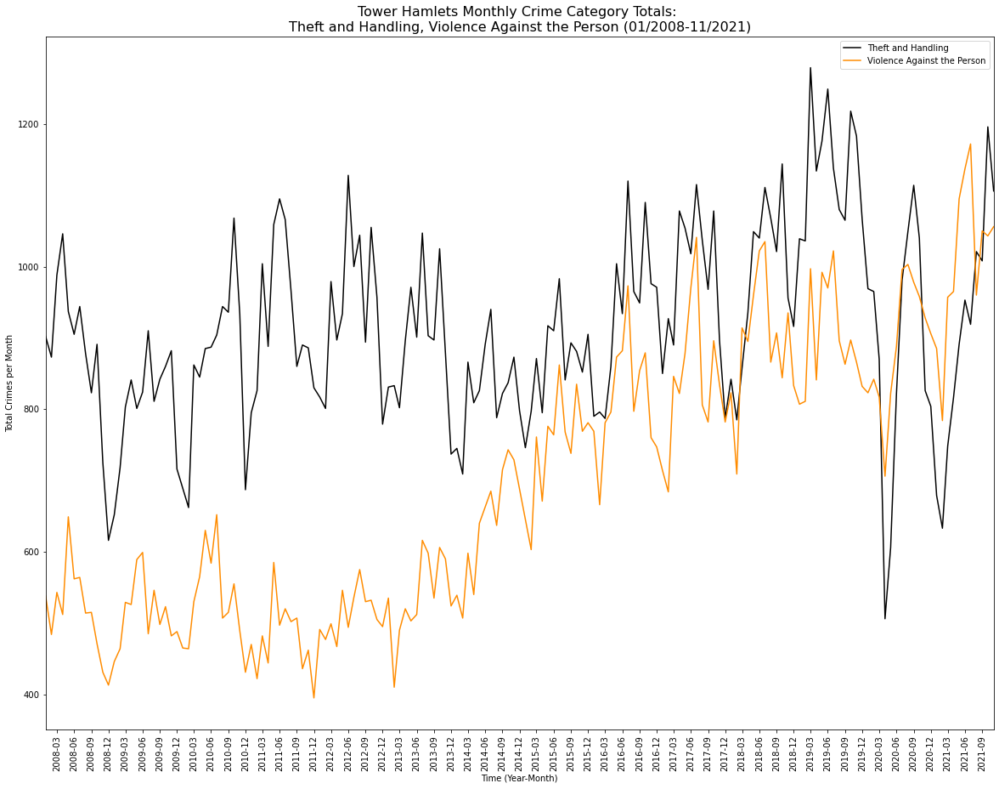

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


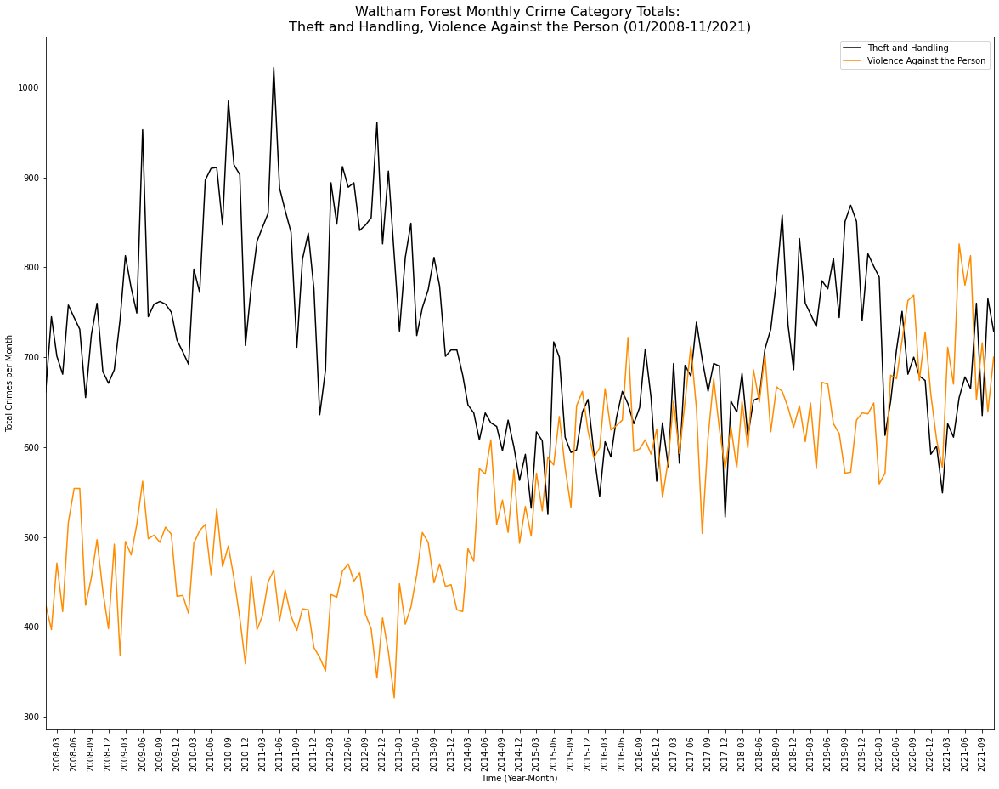

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


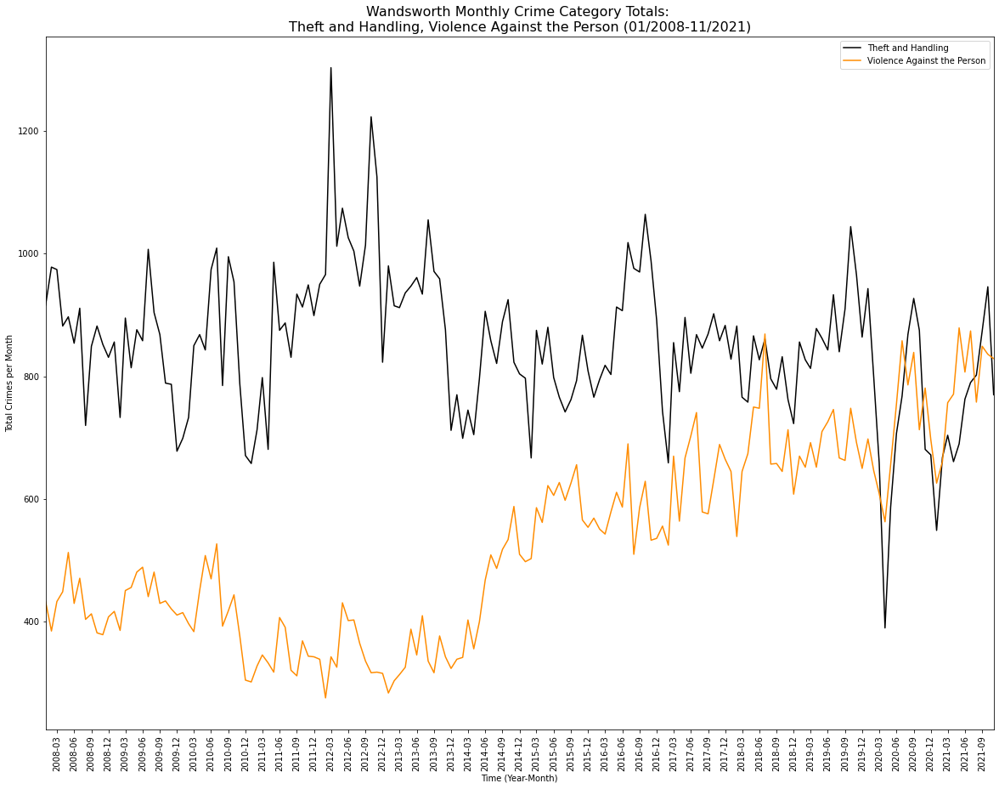

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


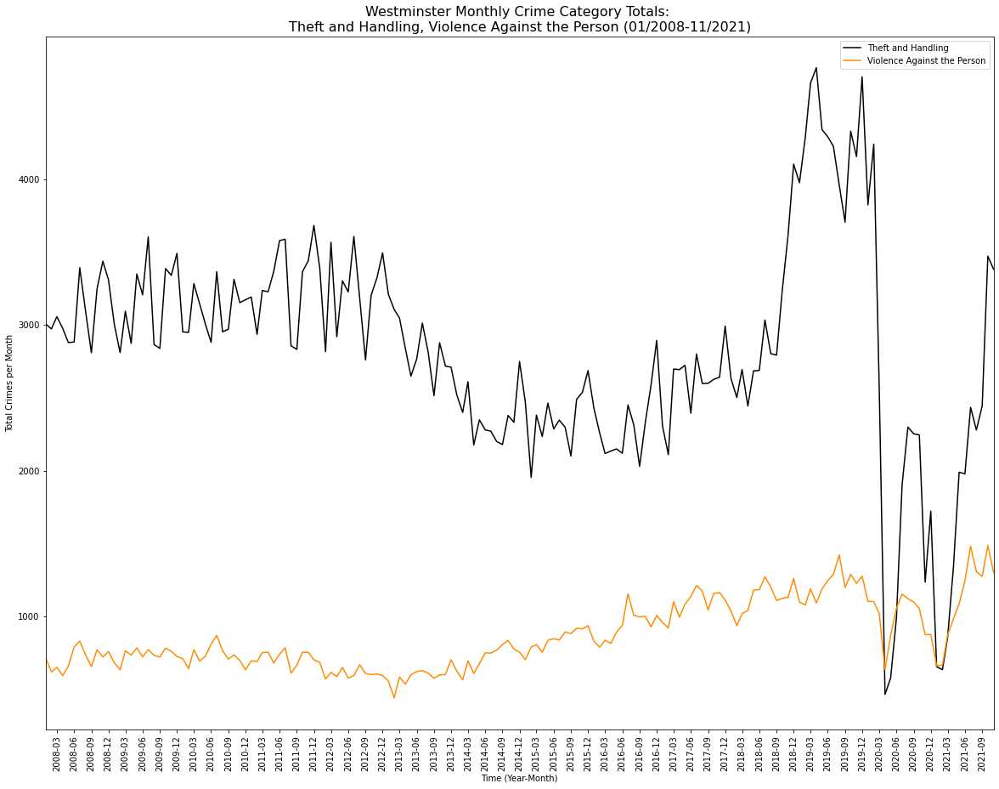

In [302]:
for borough in borough_list:
    # Filter crime category DataFrame for specific borough
    borough_crime_category_df = crime_major_category_08_21_df[crime_major_category_08_21_df['Borough'] == borough]
    # Drop borough column
    borough_crime_category_df.drop(columns=['Borough'], inplace=True)
    # Setting major categories as the indices
    borough_crime_category_df.set_index('Major Category', inplace=True)
    # Using previously defined function to acquire date_time row for the DataFrame
    borough_crime_category_df = format_date_time(borough_crime_category_df)
    
    fig, ax = plt.subplots(1, figsize=(20, 15))
    ax.set_title('{} Monthly Crime Category Totals: \nTheft and Handling, Violence Against the Person (01/2008-11/2021)'.format(borough), fontdict={'fontsize': '16', 'fontweight' : '3'})
    # Acquiring major category labels
    category_labels = ['Theft and Handling', 'Violence Against the Person']
    plot_colours = ['k', 'darkorange']
    for i in range(len(category_labels)):
        plt.plot(borough_crime_category_df.loc['date_time'], borough_crime_category_df.loc[category_labels[i]], plot_colours[i], label=category_labels[i])
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
    ax.set_xlim(pd.Timestamp('2008-01'), pd.Timestamp('2021-11'))
    ax.legend()
    plt.xlabel('Time (Year-Month)')
    plt.ylabel('Total Crimes per Month')
    plt.xticks(rotation=90)
    plt.show()
    fig.savefig('figures/timeseries_crime_categories/{}_timeseries_crime_categories.svg'.format(borough), bbox_inches='tight', dpi=300)

Over the years 2013-2021, most boroughs have seen a large increase in the number of crimes classed as 'Violence Against the Person, which could suggest that the types of crimes being committed have become more violent over the last decade.

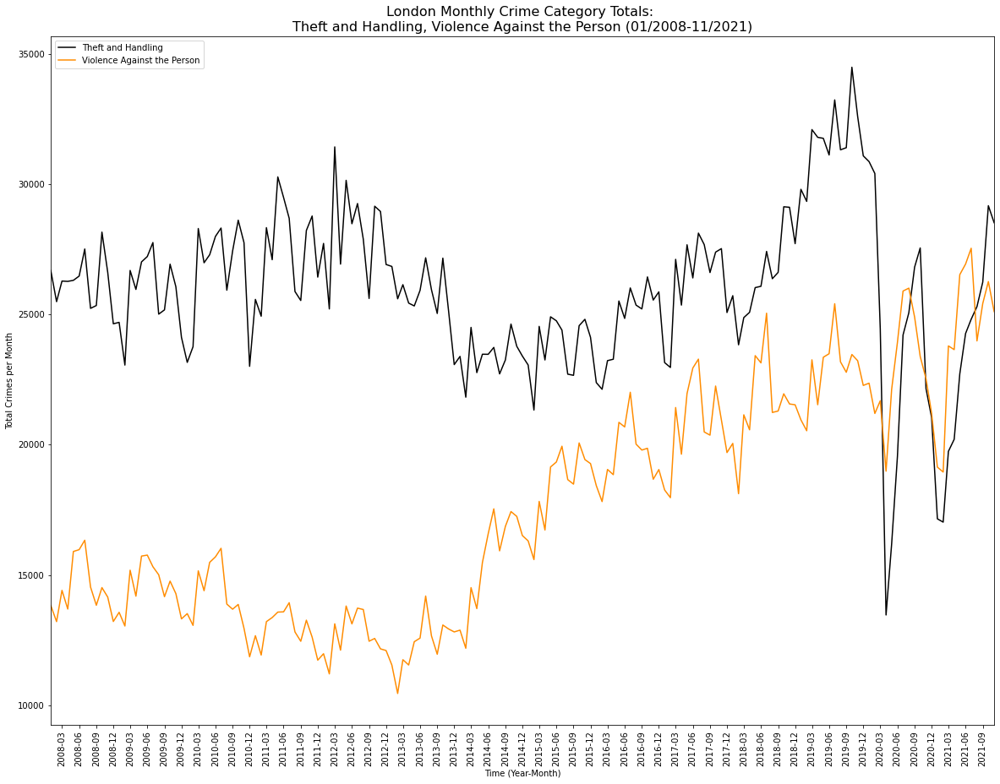

In [303]:
# Filter crime category DataFrame for specific borough
borough_crime_category_df = crime_major_category_08_21_df
# Drop borough column
borough_crime_category_df.drop(columns=['Borough'], inplace=True)
# Summing the number of occurrences of each major crime category, for each month in the DataFrame. The categories become row indices
london_crime_category_df = borough_crime_category_df.groupby(['Major Category']).sum()
# Using previously defined function to acquire date_time row for the DataFrame
london_crime_category_df = format_date_time(london_crime_category_df)
fig, ax = plt.subplots(1, figsize=(20, 15))
ax.set_title('London Monthly Crime Category Totals: \nTheft and Handling, Violence Against the Person (01/2008-11/2021)', fontdict={'fontsize': '16', 'fontweight' : '3'})
# Acquiring major category labels
category_labels = ['Theft and Handling', 'Violence Against the Person']
plot_colours = ['k', 'darkorange']
for i in range(len(category_labels)):
    plt.plot(london_crime_category_df.loc['date_time'], london_crime_category_df.loc[category_labels[i]], plot_colours[i], label=category_labels[i])
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
ax.set_xlim(pd.Timestamp('2008-01'), pd.Timestamp('2021-11'))
ax.legend()
plt.xlabel('Time (Year-Month)')
plt.ylabel('Total Crimes per Month')
plt.xticks(rotation=90)
plt.show()
fig.savefig('figures/timeseries_crime_categories/London_timeseries_crime_categories.svg', bbox_inches='tight', dpi=300)

Over the years 2013-2021, London has seen a large increase in the number of crimes classed as 'Violence Against the Person', which has almost doubled. This further supports the idea that the types of crimes being committed in the city have become more violent over the last decade. We can also see that the decrease in crimes classed as 'Violence Against the Person' over the lockdown periods of 2020 and 2021 is far less pronounced than the decrease in total crimes in the city for this period. This reinforces the idea that, while the number of crimes has decreased massively in those periods, violent crimes have been less affected than other types of crime.